statsmodels does not have bsts. best package that does is orbit.

In [1]:
!pip install orbit-ml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 446.9/446.9 kB 5.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 28.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 105.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 M

In [ ]:
from orbit.models import DLT
from orbit.diagnostics.backtest import backtest
from orbit.diagnostics.metrics import smape, mape, rmse, mae
from orbit.utils.plot import plot_predicted_data
from sklearn.metrics import r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# Load and preprocess
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D').reset_index()
df['y'].interpolate(method='time', inplace=True)

# Define folds
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# Run folds
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    print(f"\nFold {i} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")
    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit BSTS using DLT model
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=7,
        seed=2023,
        estimator='stan-map',
    )

    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Metrics
    rmse_val = rmse(y_true, y_pred)
    mae_val = mae(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {i} Metrics:")
    print(f"  RMSE: {rmse_val:.4f}")
    print(f"  MAE:  {mae_val:.4f}")
    print(f"  MAPE: {mape_val:.4f}")
    print(f"  R2:   {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(test_df['ds'], y_pred, label='Forecast')
    plt.title(f'Fold {i}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()


2025-06-09 16:40:30 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  9.5999
  MAE:   7.6641
  MAPE:  0.0570
  SMAPE: 0.0555
  R2:    0.5606


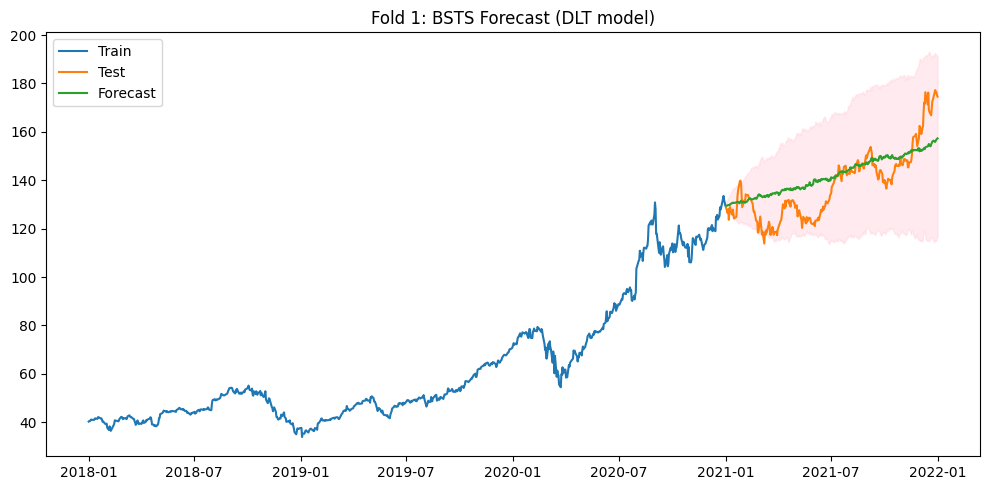

2025-06-09 16:41:44 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  51.1962
  MAE:   44.9690
  MAPE:  0.3090
  SMAPE: 0.2566
  R2:    -15.2899


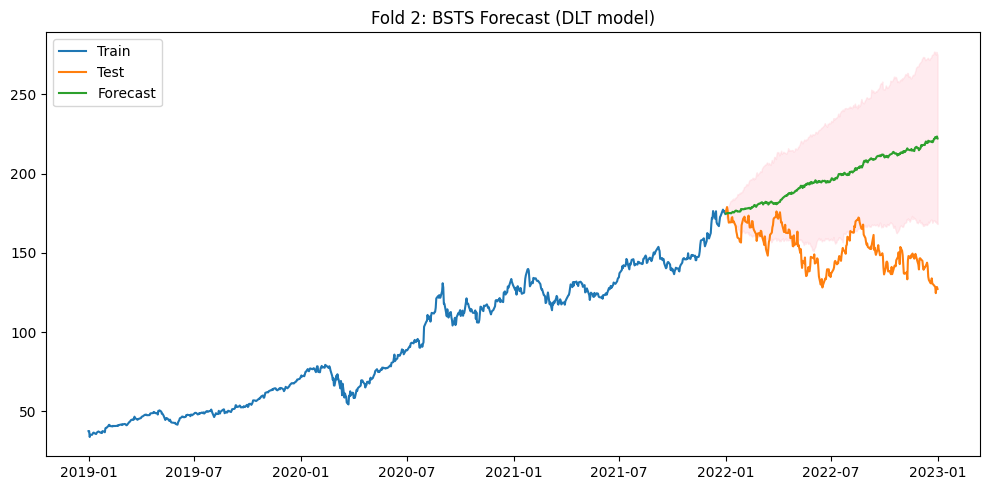

2025-06-09 16:42:56 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  32.9546
  MAE:   30.6612
  MAPE:  0.1741
  SMAPE: 0.1930
  R2:    -2.5130


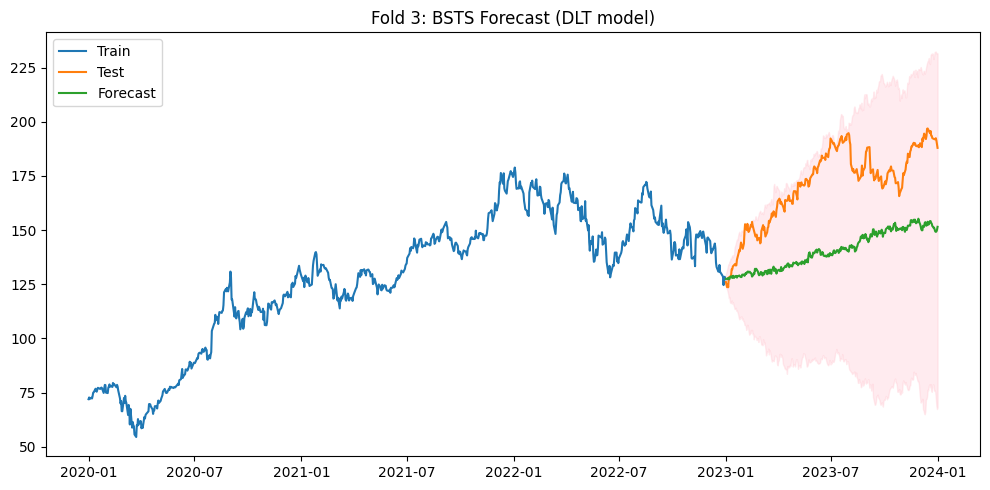

In [ ]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num):
    print(f"\nFold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=7,
        seed=2023,
        estimator='stan-mcmc',  # or 'pyro-svi' for faster, approximate
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values
    # print(forecast_df.head())
    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Run all folds
# -------------------------------
for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
    run_bsts_fold(df, train_start, train_end, test_start, test_end, i)


2025-06-09 16:56:00 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  9.9536
  MAE:   7.9105
  MAPE:  0.0590
  SMAPE: 0.0572
  R2:    0.5277


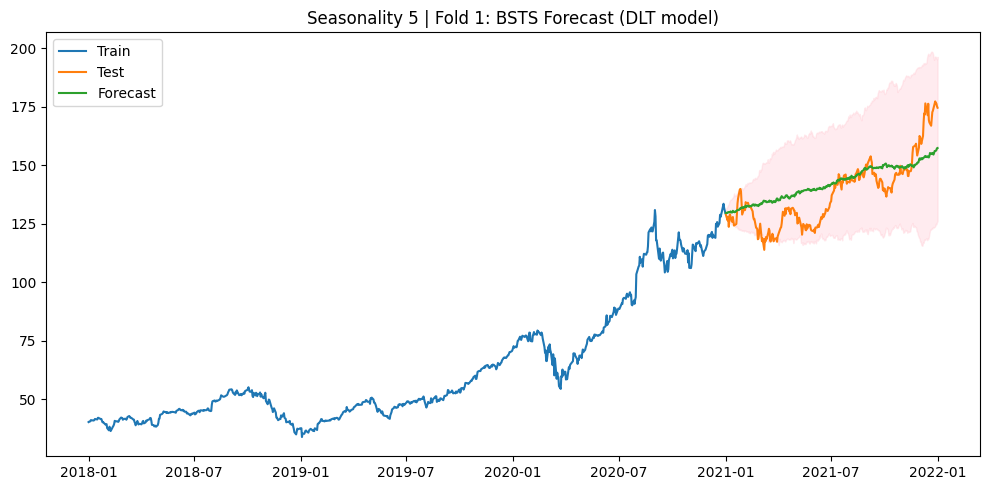

2025-06-09 16:57:12 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  47.1194
  MAE:   41.3695
  MAPE:  0.2845
  SMAPE: 0.2394
  R2:    -12.7988


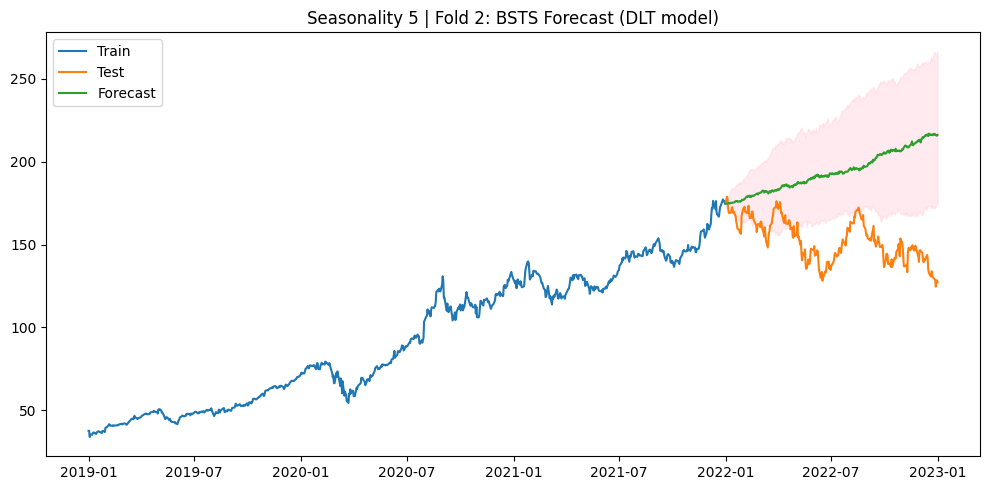

2025-06-09 16:58:24 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  30.6098
  MAE:   28.6366
  MAPE:  0.1634
  SMAPE: 0.1798
  R2:    -2.0308


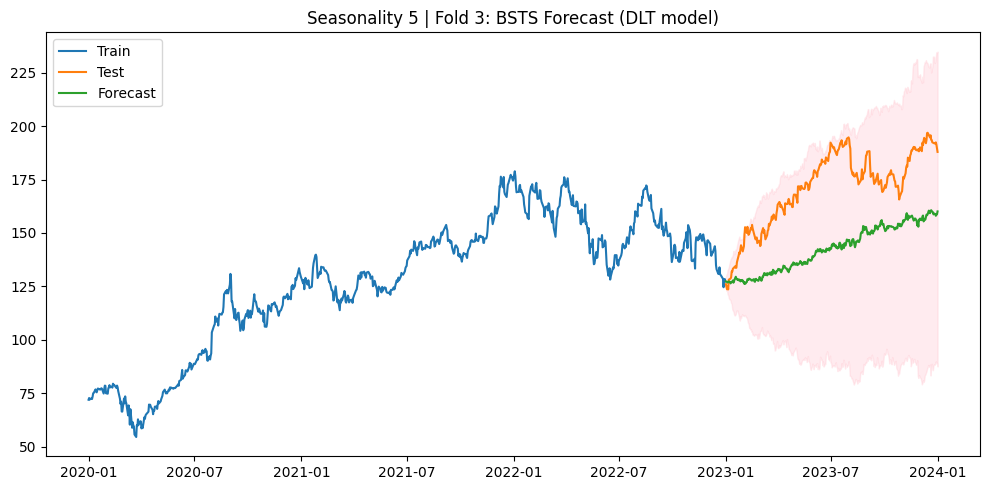

2025-06-09 16:59:36 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  11.6089
  MAE:   9.7267
  MAPE:  0.0727
  SMAPE: 0.0699
  R2:    0.3575


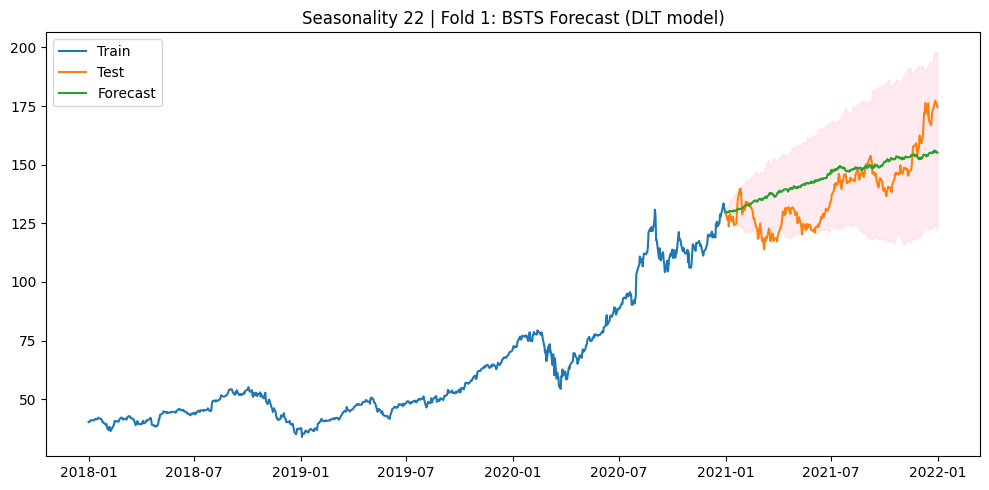

2025-06-09 17:00:47 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  53.3060
  MAE:   47.3999
  MAPE:  0.3250
  SMAPE: 0.2686
  R2:    -16.6602


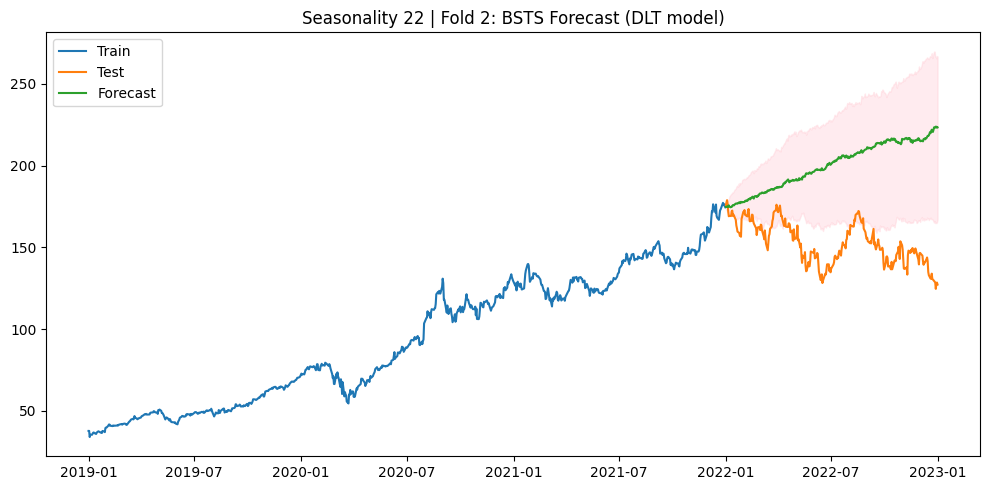

2025-06-09 17:02:08 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  32.9710
  MAE:   30.8206
  MAPE:  0.1747
  SMAPE: 0.1934
  R2:    -2.5165


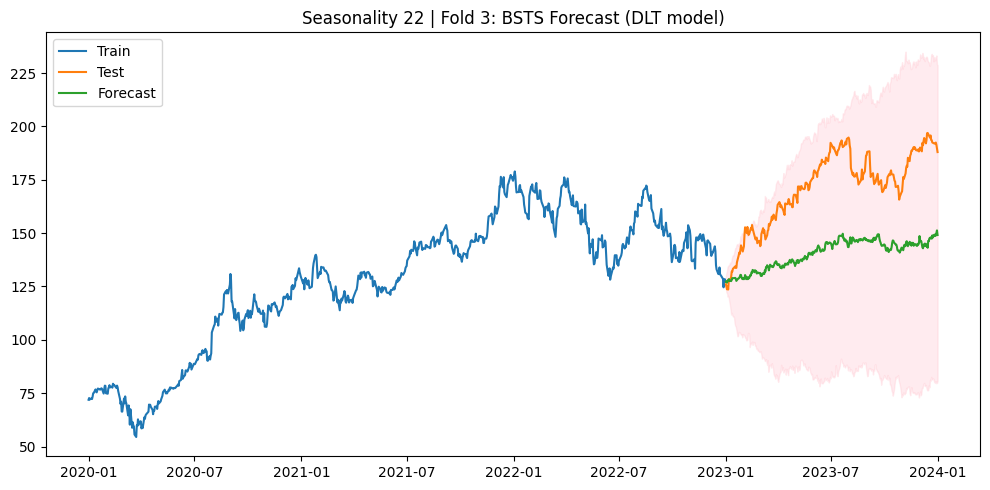

2025-06-09 17:03:20 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  10.2167
  MAE:   8.1632
  MAPE:  0.0605
  SMAPE: 0.0589
  R2:    0.5024


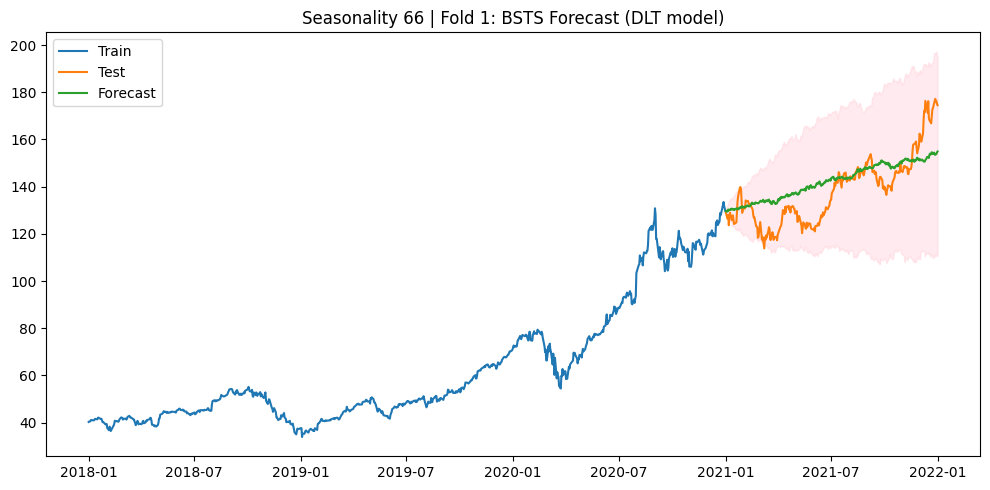

2025-06-09 17:05:31 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  51.7348
  MAE:   45.9197
  MAPE:  0.3152
  SMAPE: 0.2617
  R2:    -15.6344


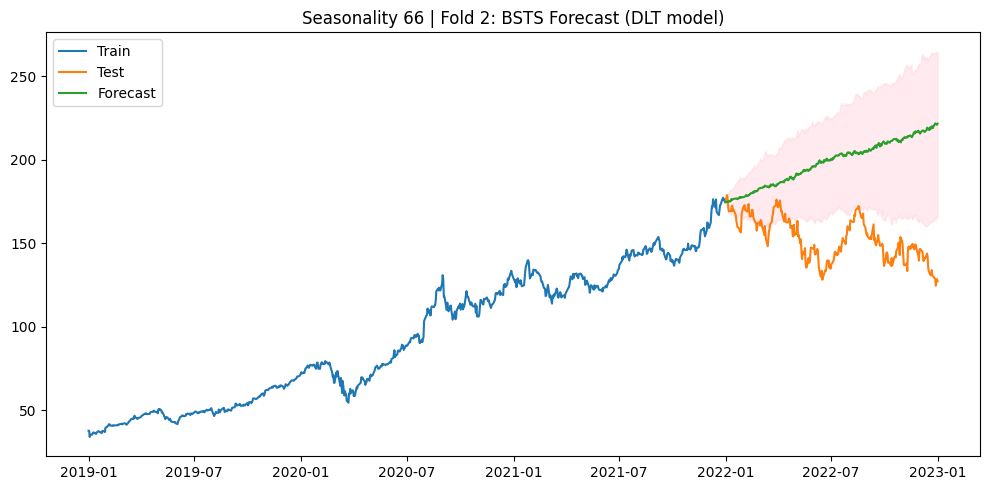

2025-06-09 17:07:38 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  34.9314
  MAE:   32.8750
  MAPE:  0.1868
  SMAPE: 0.2080
  R2:    -2.9470


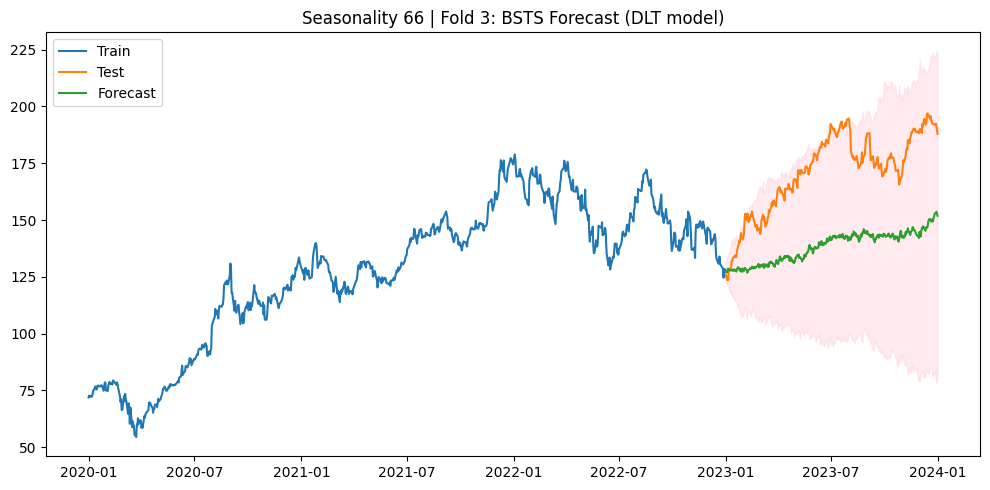

In [ ]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


2025-06-09 17:20:11 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  4.5736
  MAE:   3.4545
  MAPE:  0.0752
  SMAPE: 0.0760
  R2:    0.1572


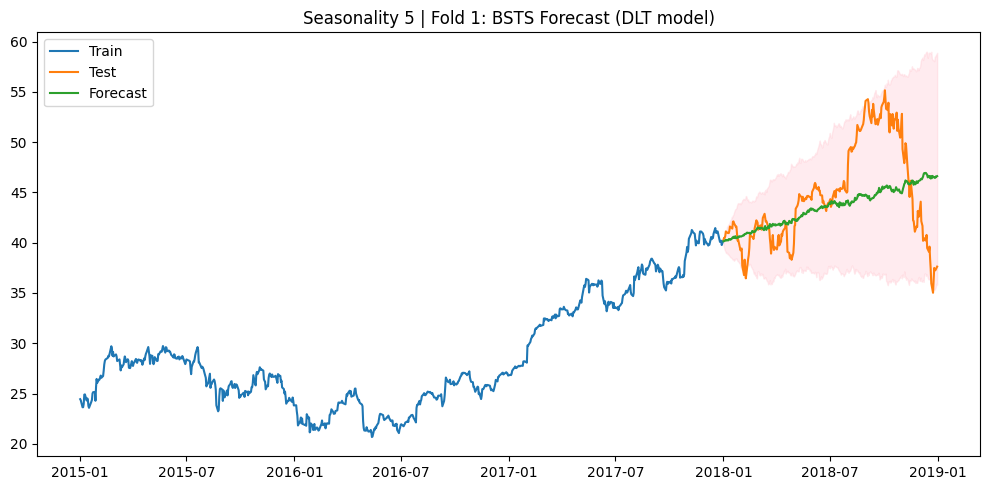

2025-06-09 17:21:52 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  10.7126
  MAE:   8.8898
  MAPE:  0.1636
  SMAPE: 0.1826
  R2:    -0.5428


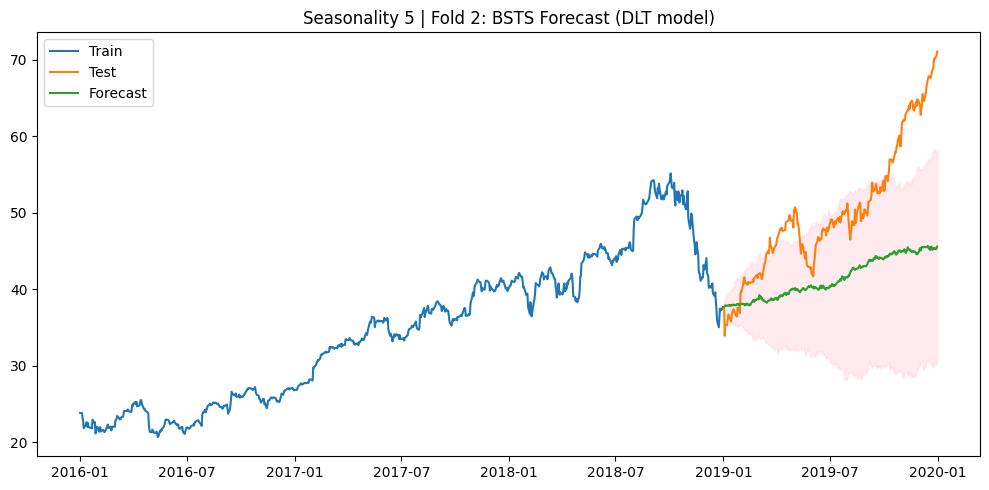

2025-06-09 17:23:26 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  23.3759
  MAE:   18.3279
  MAPE:  0.1769
  SMAPE: 0.1977
  R2:    -0.1977


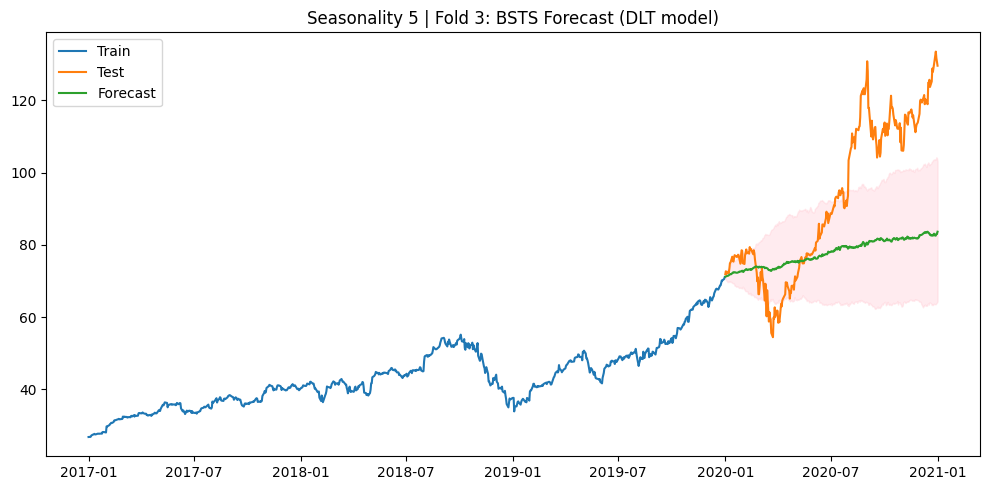

2025-06-09 17:24:54 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  4.4497
  MAE:   3.3158
  MAPE:  0.0734
  SMAPE: 0.0729
  R2:    0.2023


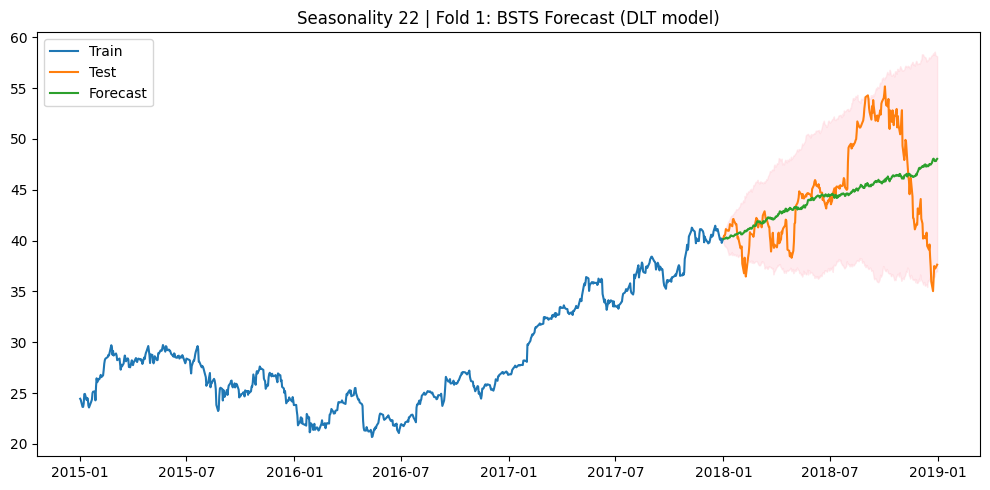

2025-06-09 17:26:38 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  9.9078
  MAE:   7.9552
  MAPE:  0.1449
  SMAPE: 0.1606
  R2:    -0.3197


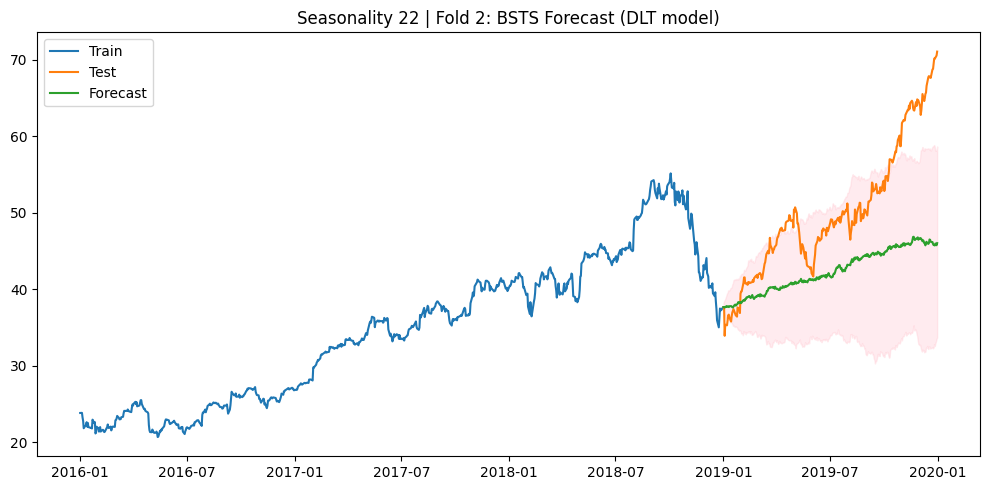

2025-06-09 17:28:18 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  23.0474
  MAE:   18.1921
  MAPE:  0.1770
  SMAPE: 0.1964
  R2:    -0.1643


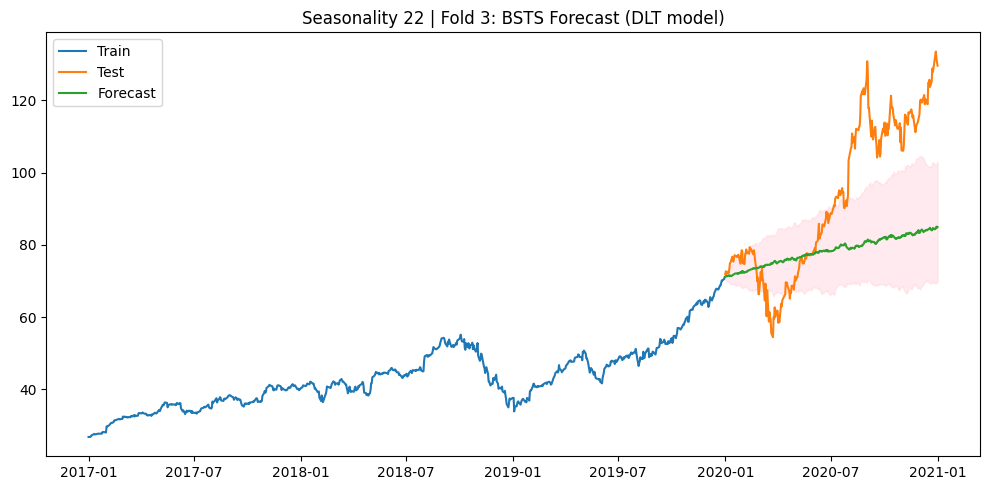

2025-06-09 17:29:47 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  4.3935
  MAE:   3.2737
  MAPE:  0.0727
  SMAPE: 0.0720
  R2:    0.2223


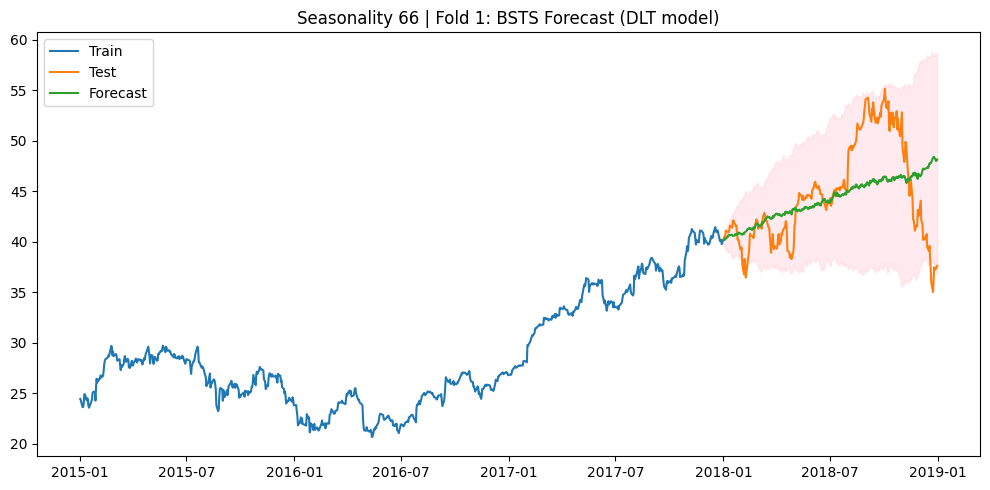

2025-06-09 17:32:15 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  11.4362
  MAE:   9.3819
  MAPE:  0.1718
  SMAPE: 0.1934
  R2:    -0.7583


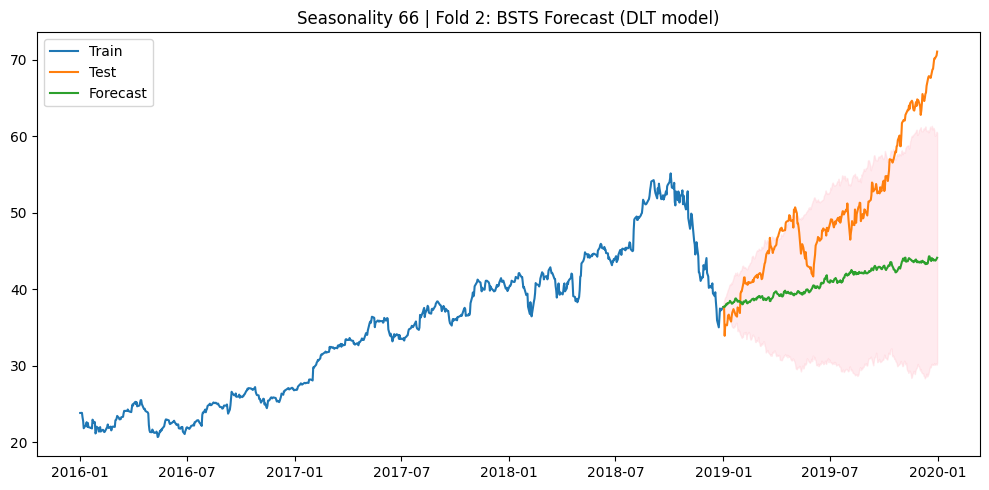

2025-06-09 17:35:22 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  23.7575
  MAE:   18.7325
  MAPE:  0.1817
  SMAPE: 0.2028
  R2:    -0.2371


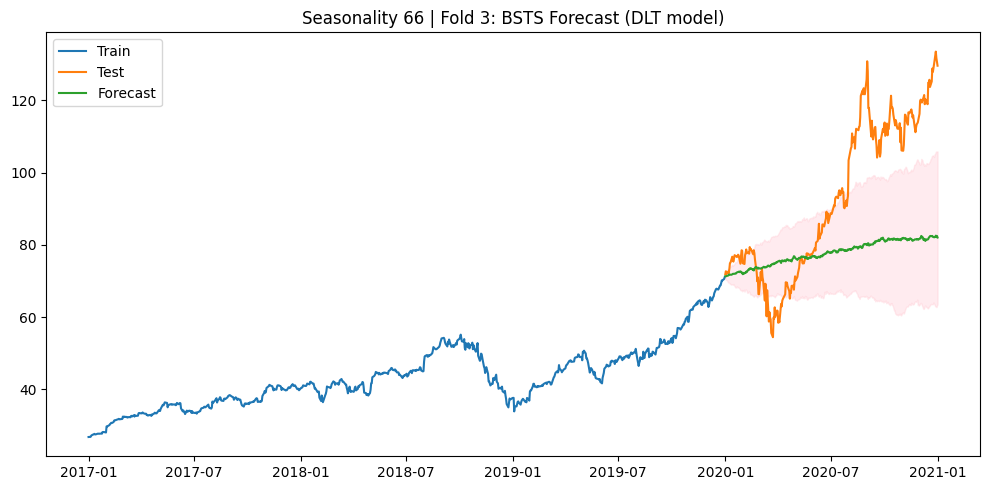

In [ ]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2015-01-01', '2017-12-31', '2018-01-01', '2018-12-31'),
    ('2016-01-01', '2018-12-31', '2019-01-01', '2019-12-31'),
    ('2017-01-01', '2019-12-31', '2020-01-01', '2020-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


2025-06-09 17:37:51 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  2.9770
  MAE:   2.6823
  MAPE:  0.1004
  SMAPE: 0.0988
  R2:    -2.1238


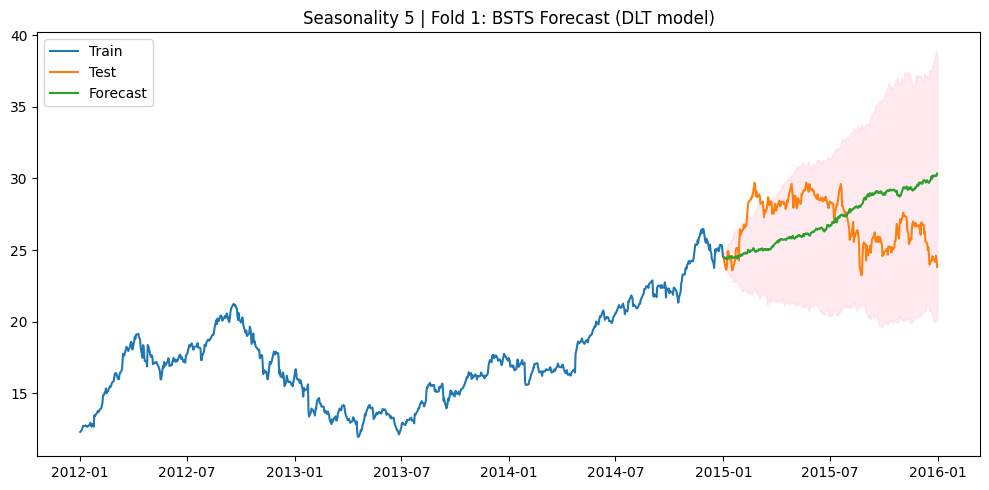

2025-06-09 17:40:04 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  2.1138
  MAE:   1.7430
  MAPE:  0.0762
  SMAPE: 0.0720
  R2:    -0.3082


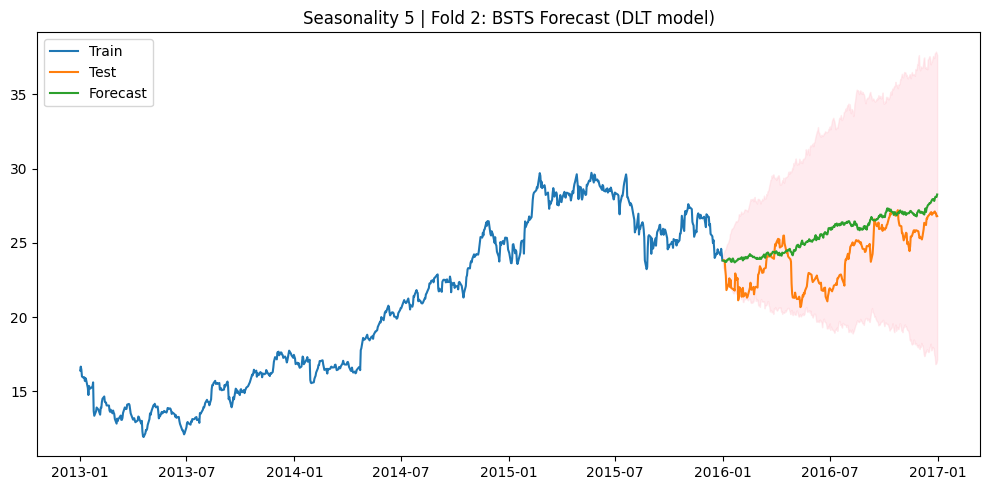

2025-06-09 17:41:52 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  6.4822
  MAE:   6.0564
  MAPE:  0.1674
  SMAPE: 0.1846
  R2:    -2.2006


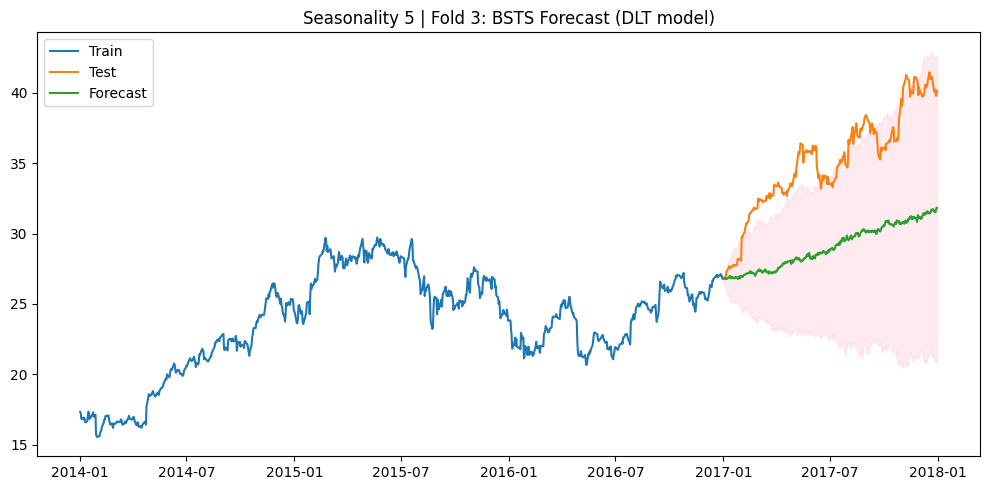

2025-06-09 17:43:24 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  2.6415
  MAE:   2.3461
  MAPE:  0.0875
  SMAPE: 0.0869
  R2:    -1.4594


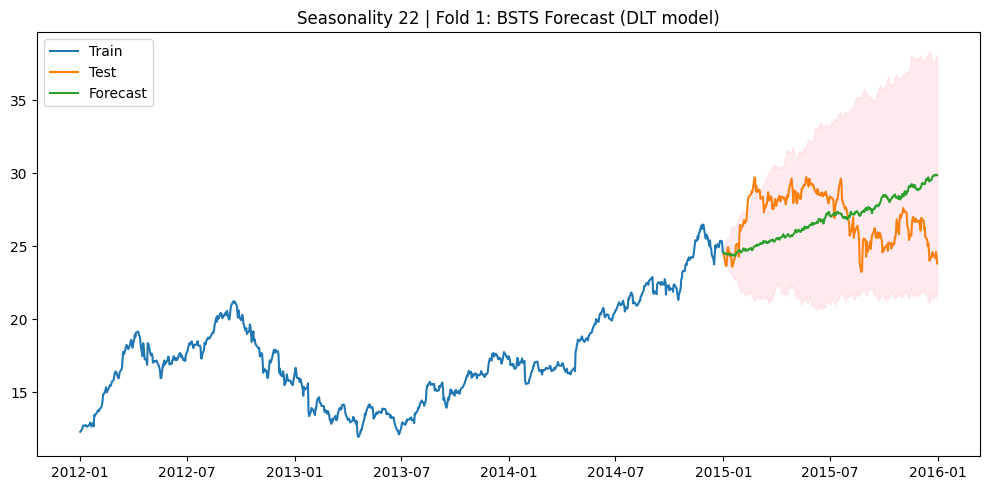

2025-06-09 17:45:09 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  2.9812
  MAE:   2.7106
  MAPE:  0.1159
  SMAPE: 0.1082
  R2:    -1.6022


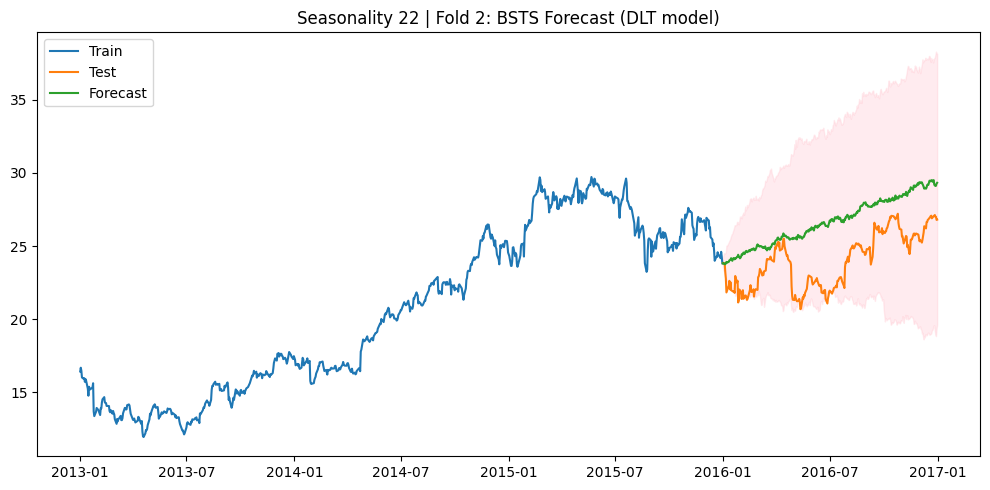

2025-06-09 17:47:04 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  5.5754
  MAE:   5.1210
  MAPE:  0.1410
  SMAPE: 0.1532
  R2:    -1.3678


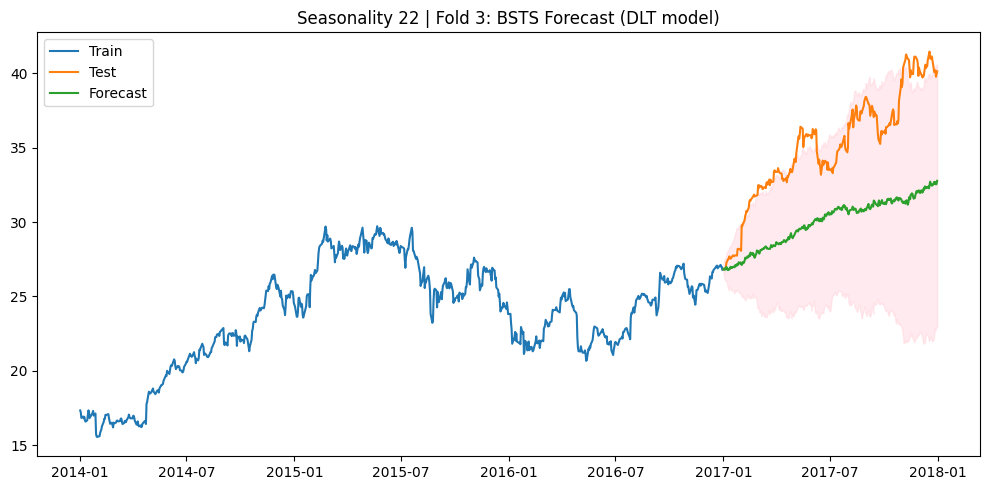

2025-06-09 17:48:40 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  3.0262
  MAE:   2.6347
  MAPE:  0.0995
  SMAPE: 0.0962
  R2:    -2.2278


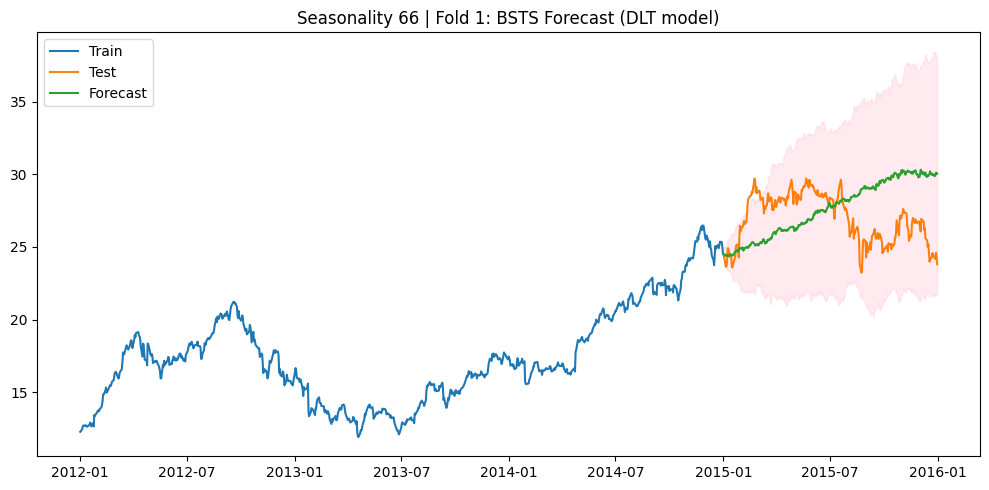

2025-06-09 17:51:44 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  2.8064
  MAE:   2.4882
  MAPE:  0.1071
  SMAPE: 0.1000
  R2:    -1.3058


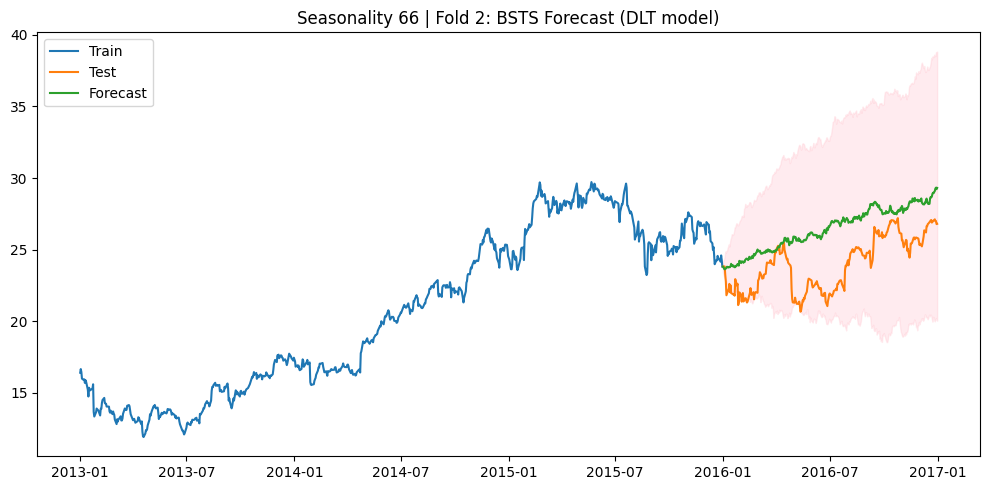

2025-06-09 17:54:38 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  5.3965
  MAE:   4.9977
  MAPE:  0.1380
  SMAPE: 0.1496
  R2:    -1.2183


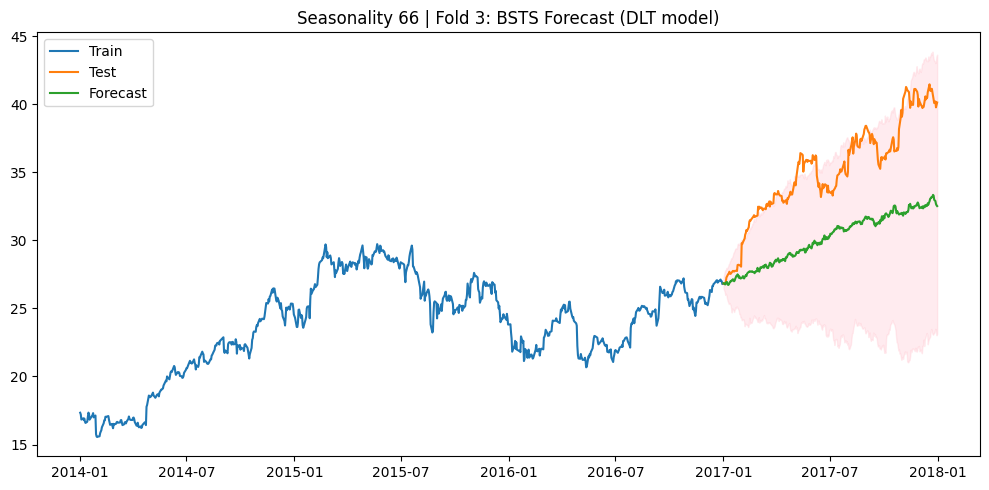

In [ ]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2012-01-01', '2014-12-31', '2015-01-01', '2015-12-31'),
    ('2013-01-01', '2015-12-31', '2016-01-01', '2016-12-31'),
    ('2014-01-01', '2016-12-31', '2017-01-01', '2017-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


# Period 1:

2025-06-10 15:28:40 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  4.4497
  MAE:   3.3158
  MAPE:  0.0734
  SMAPE: 0.0729
  R2:    0.2023


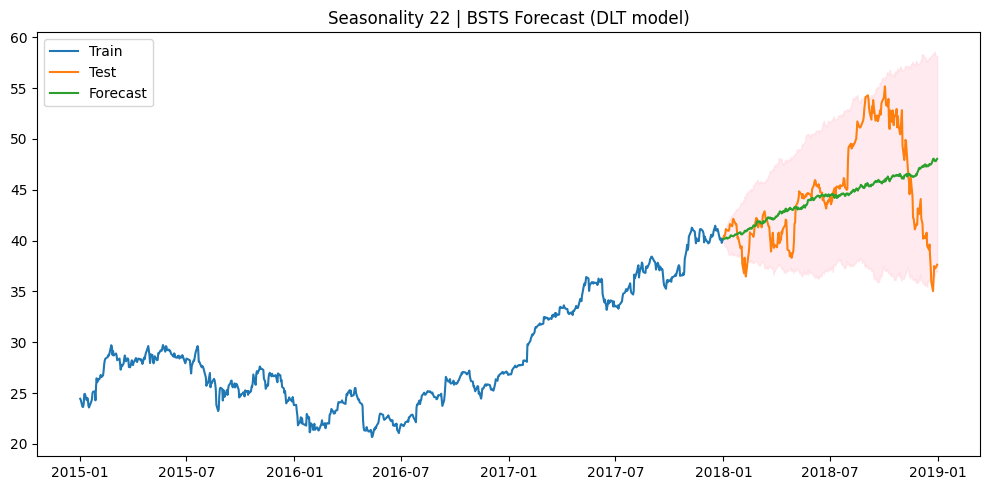

In [7]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

train_start = '2015-01-01'
train_end = '2017-12-31'
test_start = '2018-01-01'
test_end = '2018-12-31'

seasonality = 22

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# Period 2:

2025-06-10 15:32:51 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  11.6089
  MAE:   9.7267
  MAPE:  0.0727
  SMAPE: 0.0699
  R2:    0.3575


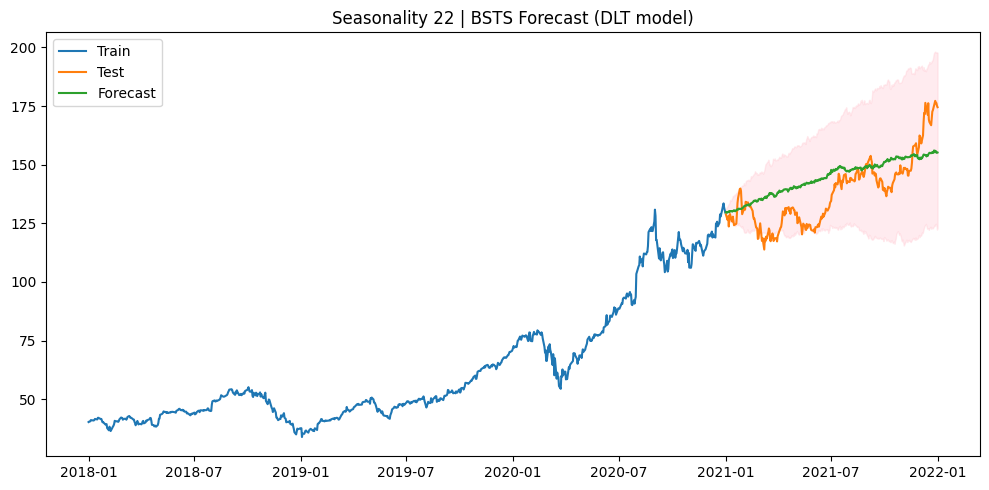

In [8]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
train_start = '2018-01-01'
train_end = '2020-12-31'
test_start = '2021-01-01'
test_end = '2021-12-31'

seasonality = 22

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# Period 3:

2025-06-10 15:35:23 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  23.5562
  MAE:   19.7855
  MAPE:  0.0915
  SMAPE: 0.0955
  R2:    0.1576


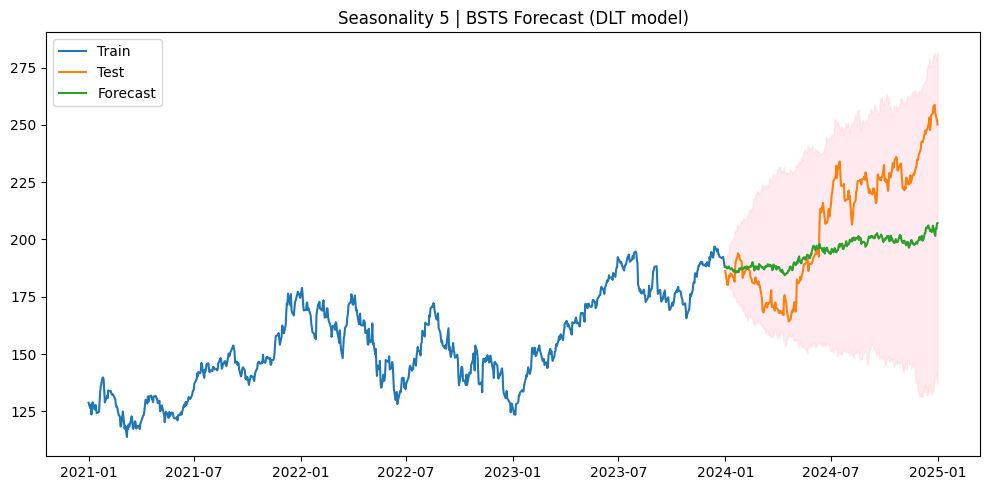

In [9]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('AAPL.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
train_start = '2021-01-01'
train_end = '2023-12-31'
test_start = '2024-01-01'
test_end = '2024-12-31'

seasonality = 5

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# **JPM:**

2025-06-09 17:59:47 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  24.3869
  MAE:   23.0847
  MAPE:  0.1606
  SMAPE: 0.1762
  R2:    -5.5377


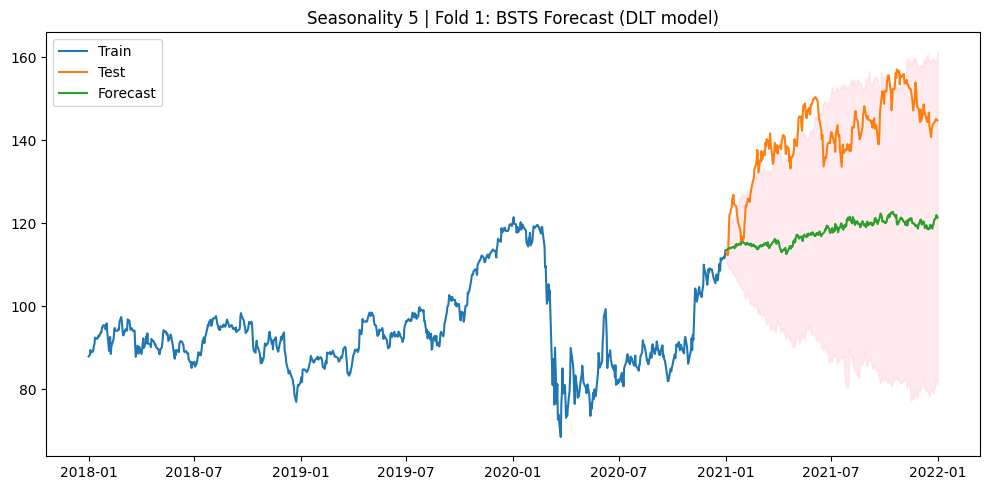

2025-06-09 18:00:44 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  35.0946
  MAE:   32.1227
  MAPE:  0.2840
  SMAPE: 0.2417
  R2:    -6.4260


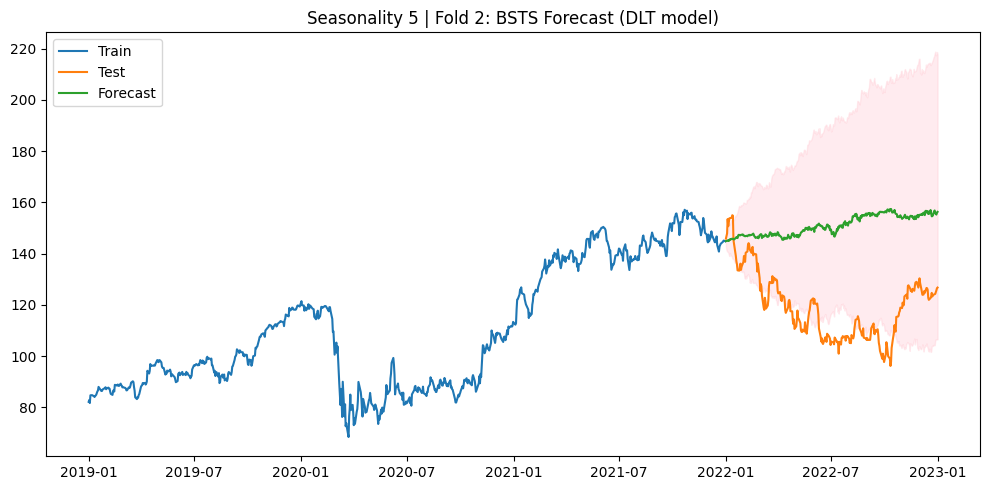

2025-06-09 18:01:56 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  16.7611
  MAE:   13.7316
  MAPE:  0.0950
  SMAPE: 0.1018
  R2:    -1.8955


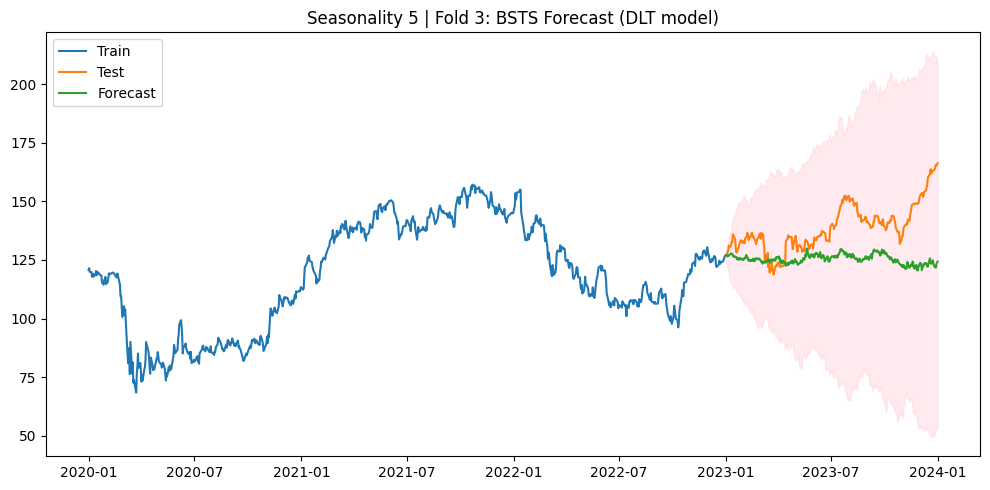

2025-06-09 18:03:06 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  22.4820
  MAE:   21.3181
  MAPE:  0.1485
  SMAPE: 0.1617
  R2:    -4.5563


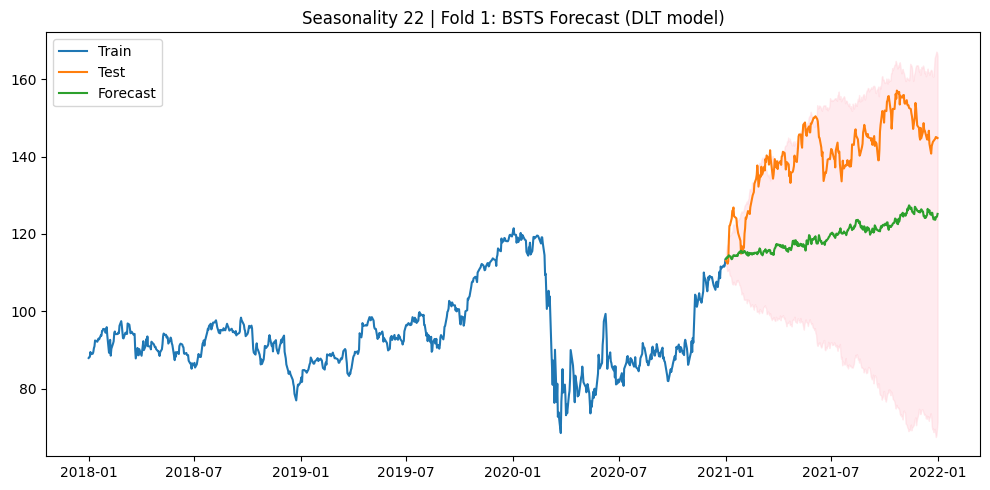

2025-06-09 18:04:08 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  41.2209
  MAE:   37.9129
  MAPE:  0.3344
  SMAPE: 0.2780
  R2:    -9.2450


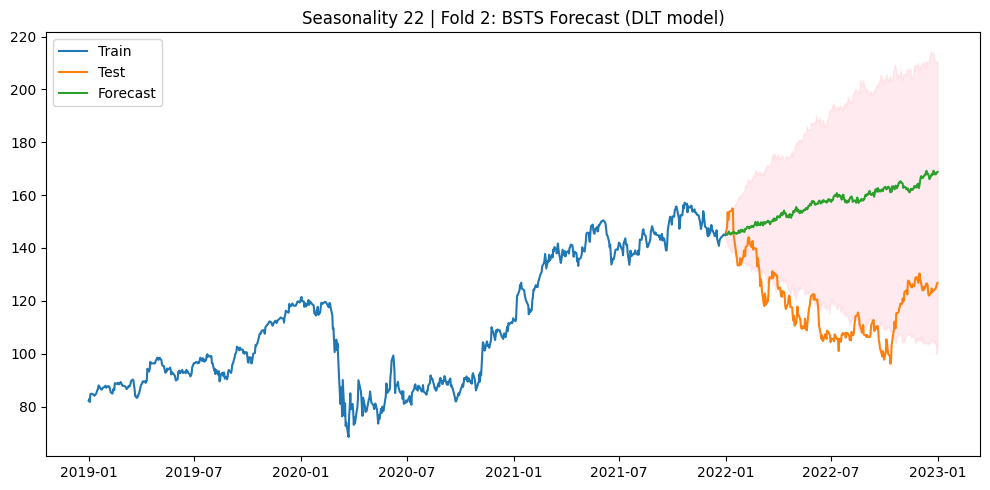

2025-06-09 18:05:18 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  18.3176
  MAE:   14.7842
  MAPE:  0.1021
  SMAPE: 0.1102
  R2:    -2.4582


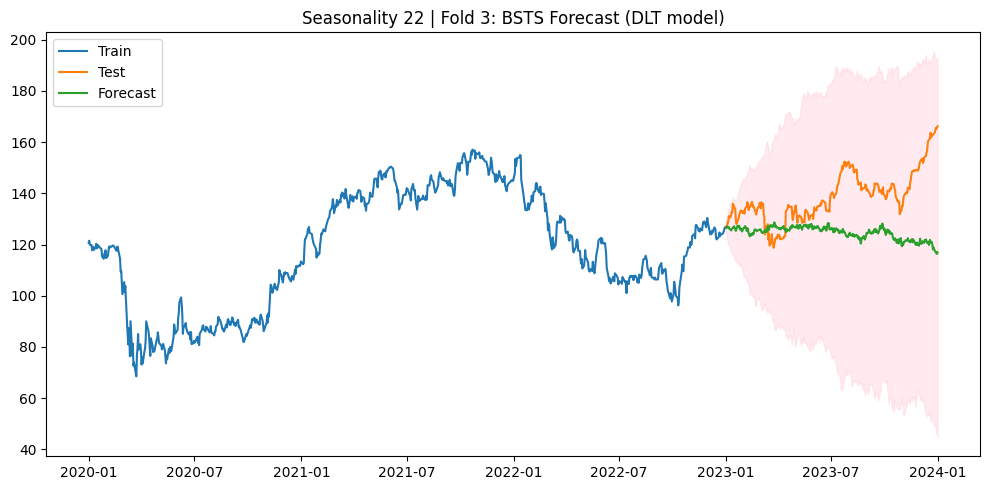

2025-06-09 18:06:15 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  24.8738
  MAE:   23.4379
  MAPE:  0.1629
  SMAPE: 0.1790
  R2:    -5.8014


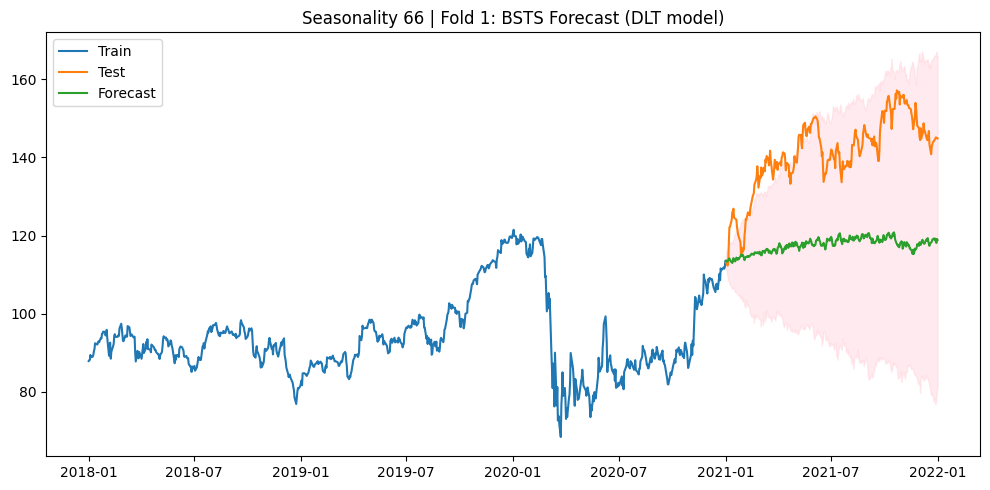

2025-06-09 18:08:07 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  33.2228
  MAE:   30.1559
  MAPE:  0.2672
  SMAPE: 0.2289
  R2:    -5.6550


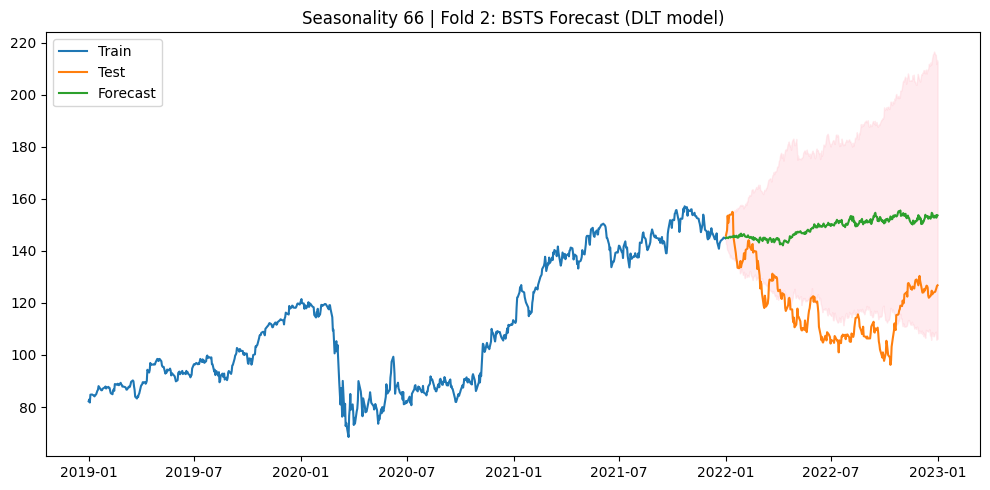

2025-06-09 18:10:05 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  13.7918
  MAE:   10.9241
  MAPE:  0.0755
  SMAPE: 0.0798
  R2:    -0.9605


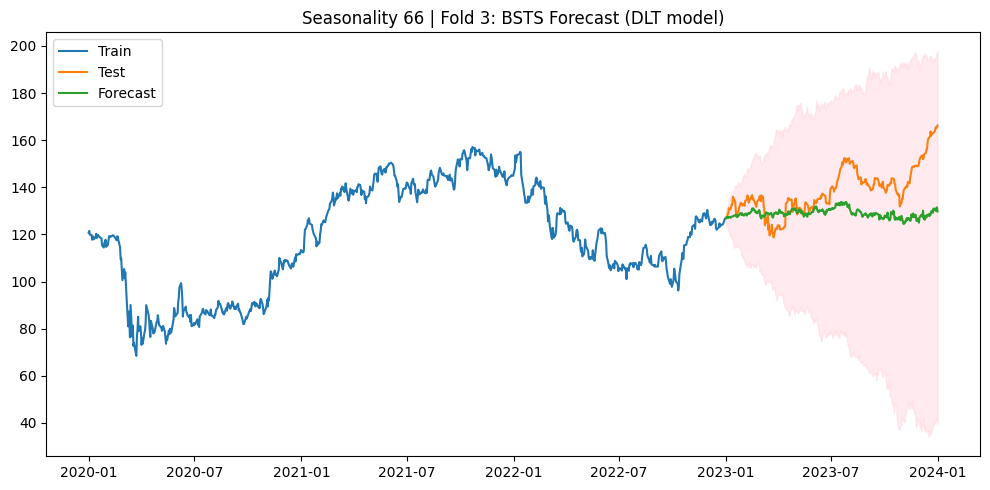

In [16]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


2025-06-09 18:11:48 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  4.7027
  MAE:   3.6697
  MAPE:  0.0407
  SMAPE: 0.0405
  R2:    -0.4303


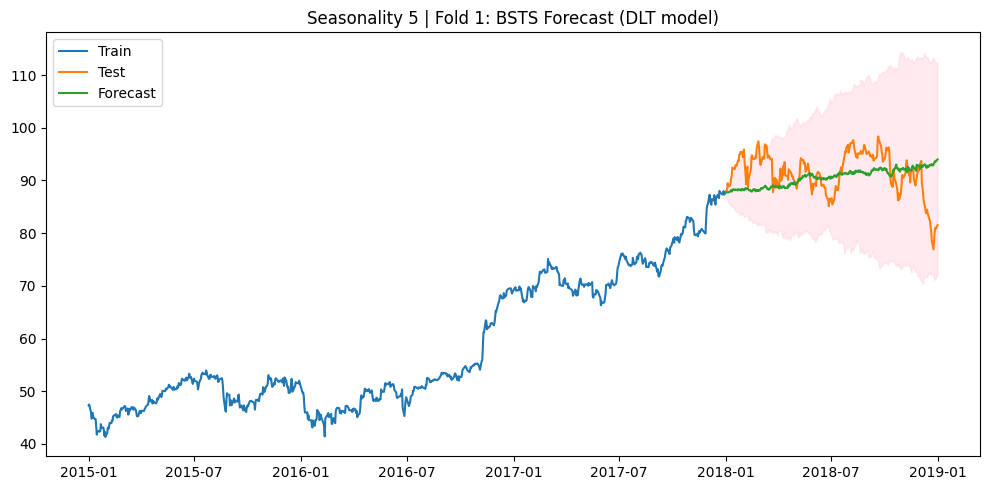

2025-06-09 18:13:06 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  13.9648
  MAE:   11.5494
  MAPE:  0.1127
  SMAPE: 0.1220
  R2:    -1.0890


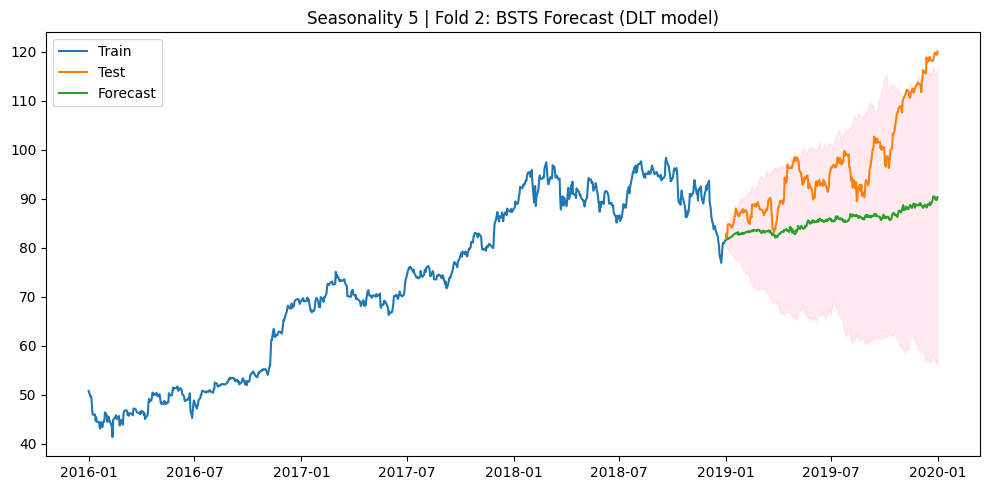

2025-06-09 18:14:30 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  34.5232
  MAE:   31.2508
  MAPE:  0.3603
  SMAPE: 0.2937
  R2:    -5.3285


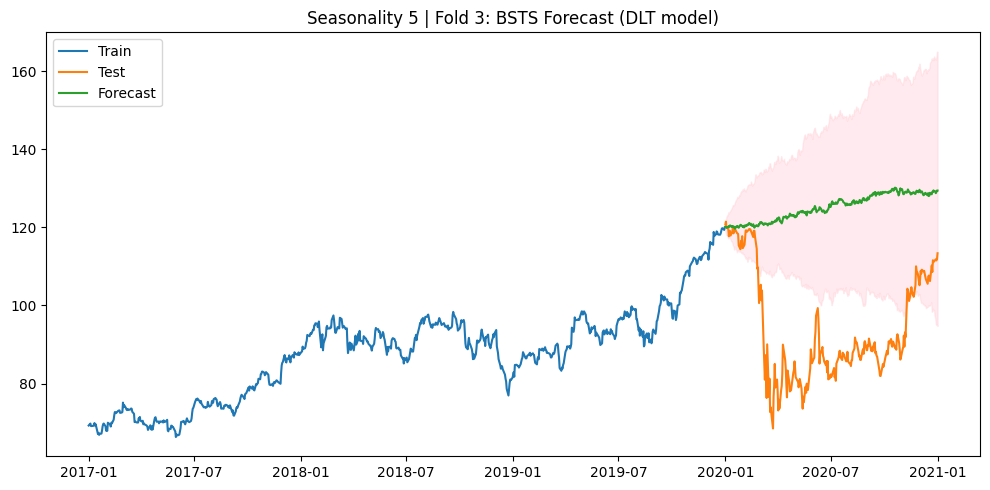

2025-06-09 18:15:34 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  4.9574
  MAE:   3.6809
  MAPE:  0.0413
  SMAPE: 0.0405
  R2:    -0.5894


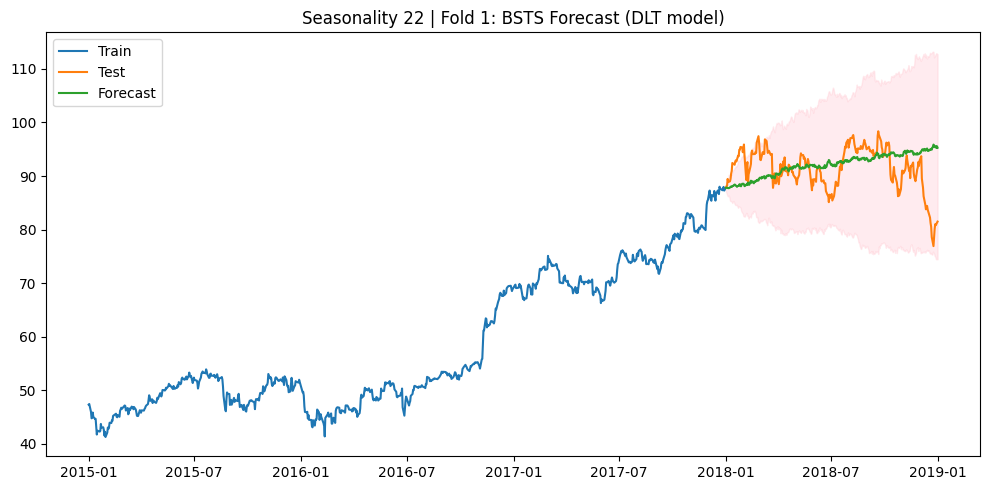

2025-06-09 18:16:55 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  14.7236
  MAE:   11.3770
  MAPE:  0.1097
  SMAPE: 0.1199
  R2:    -1.3222


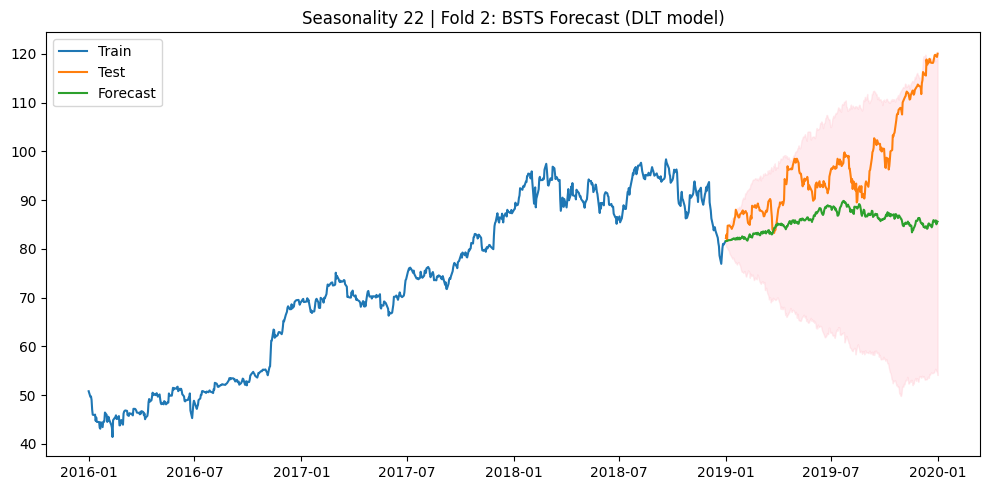

2025-06-09 18:18:19 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  36.9311
  MAE:   33.7731
  MAPE:  0.3877
  SMAPE: 0.3129
  R2:    -6.2420


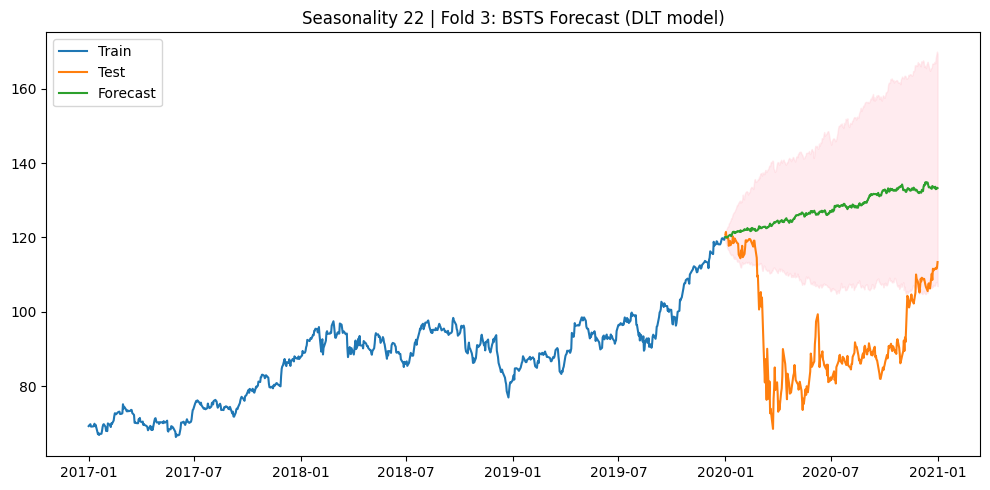

2025-06-09 18:19:36 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  4.7788
  MAE:   3.7169
  MAPE:  0.0416
  SMAPE: 0.0409
  R2:    -0.4770


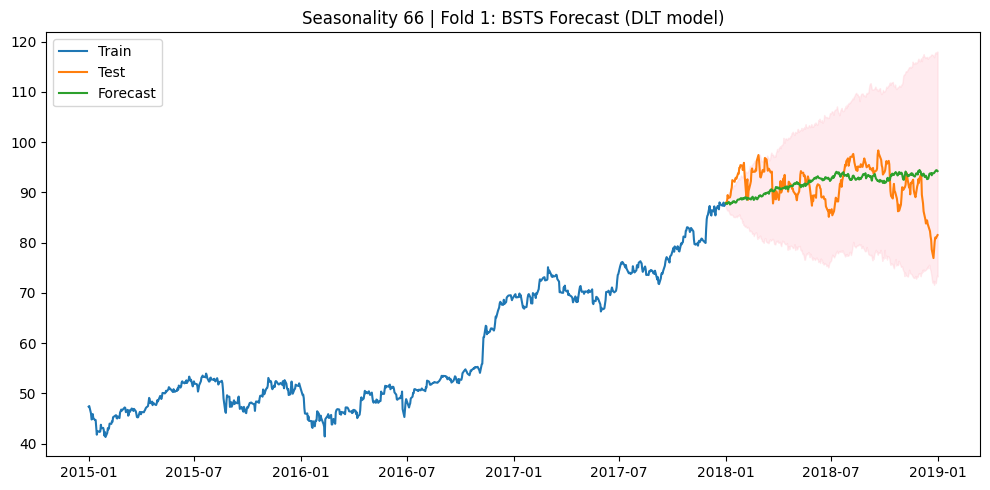

2025-06-09 18:22:21 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  12.1137
  MAE:   9.2683
  MAPE:  0.0894
  SMAPE: 0.0961
  R2:    -0.5719


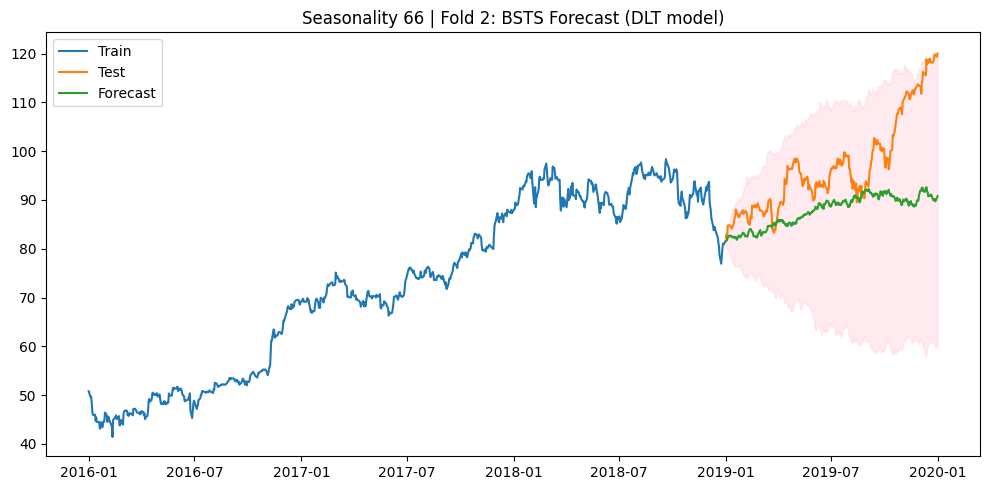

2025-06-09 18:25:20 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  36.8434
  MAE:   33.5062
  MAPE:  0.3855
  SMAPE: 0.3108
  R2:    -6.2077


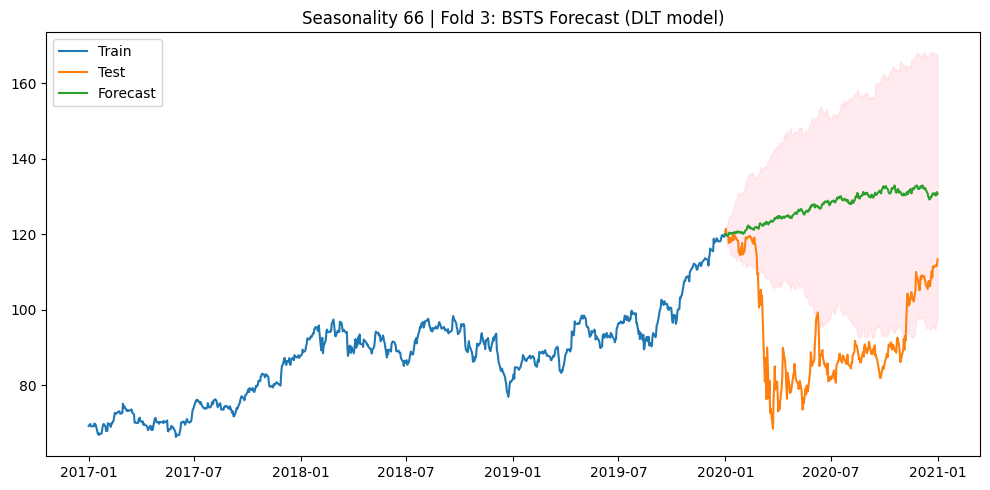

In [17]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2015-01-01', '2017-12-31', '2018-01-01', '2018-12-31'),
    ('2016-01-01', '2018-12-31', '2019-01-01', '2019-12-31'),
    ('2017-01-01', '2019-12-31', '2020-01-01', '2020-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


2025-06-09 18:27:47 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  2.8544
  MAE:   2.4249
  MAPE:  0.0507
  SMAPE: 0.0492
  R2:    0.1004


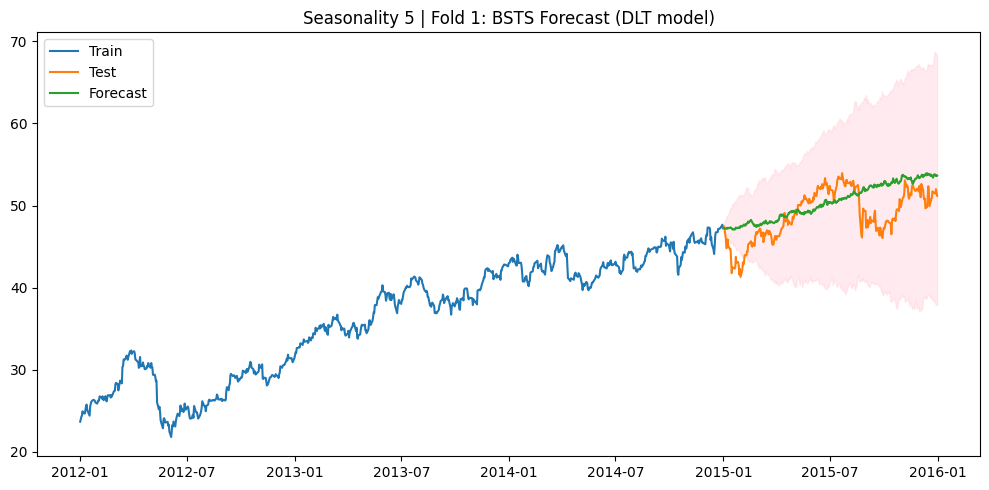

2025-06-09 18:29:09 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  5.4930
  MAE:   4.7212
  MAPE:  0.0913
  SMAPE: 0.0890
  R2:    0.2978


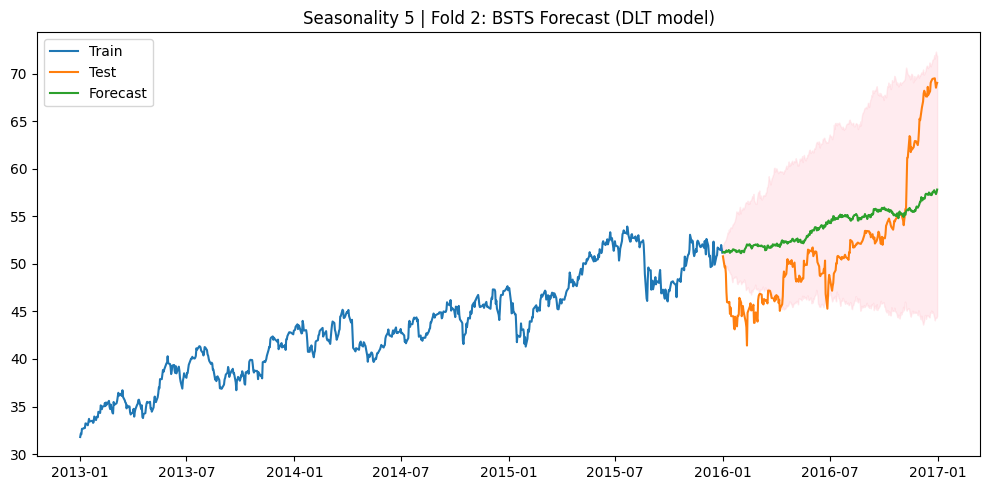

2025-06-09 18:30:22 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  5.1204
  MAE:   3.5883
  MAPE:  0.0453
  SMAPE: 0.0472
  R2:    0.1622


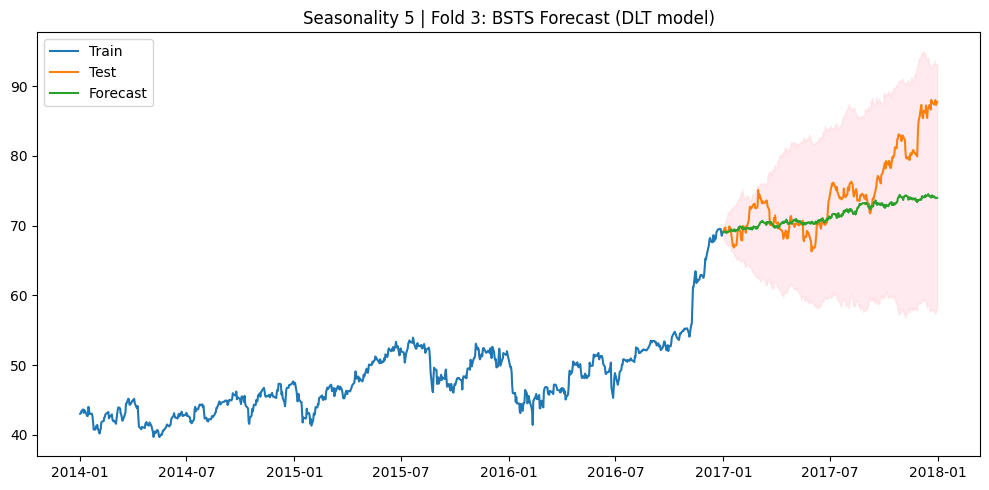

2025-06-09 18:31:37 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  2.9504
  MAE:   2.4739
  MAPE:  0.0519
  SMAPE: 0.0502
  R2:    0.0389


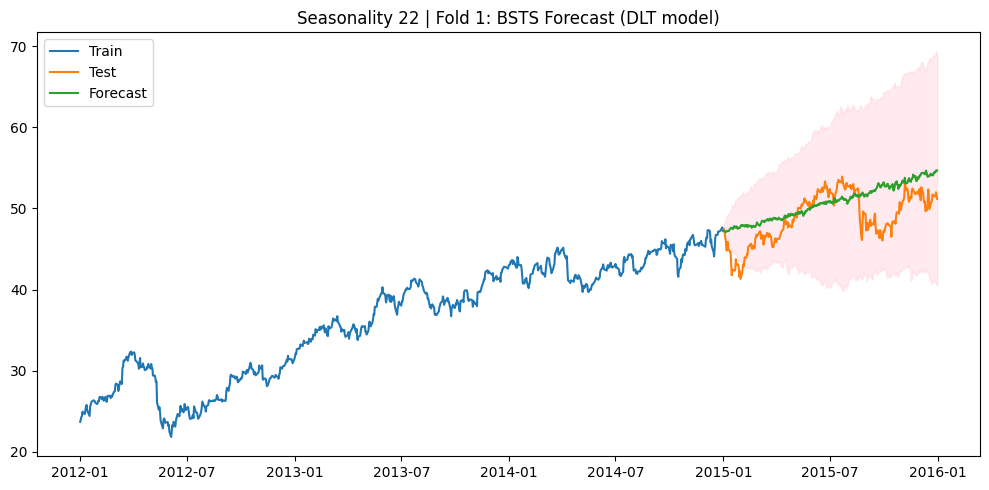

2025-06-09 18:33:13 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  6.0934
  MAE:   5.5846
  MAPE:  0.1091
  SMAPE: 0.1050
  R2:    0.1359


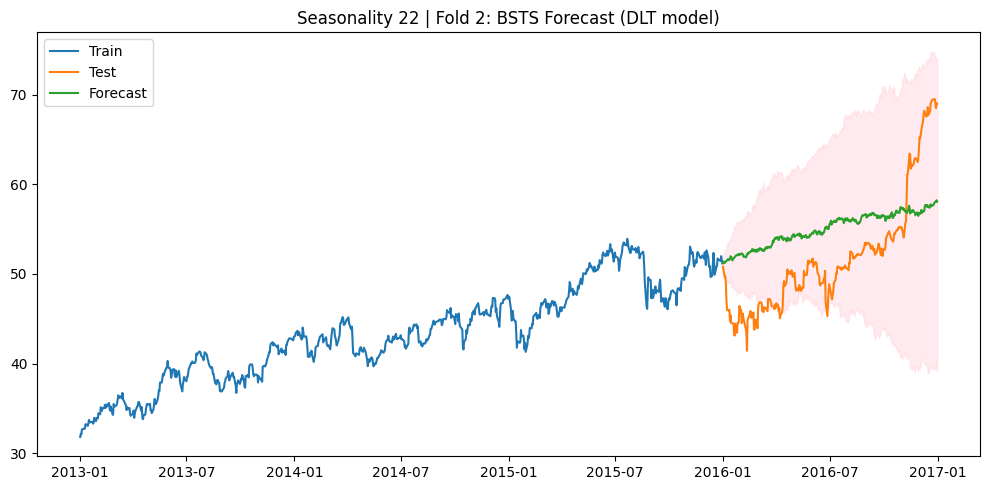

2025-06-09 18:34:42 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  4.4296
  MAE:   3.2192
  MAPE:  0.0413
  SMAPE: 0.0423
  R2:    0.3730


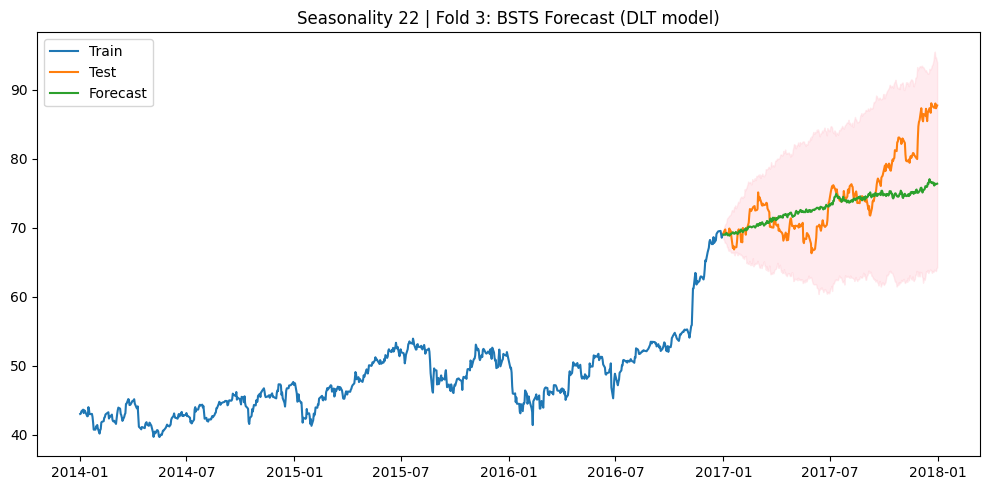

2025-06-09 18:36:08 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  2.7137
  MAE:   2.2757
  MAPE:  0.0479
  SMAPE: 0.0465
  R2:    0.1869


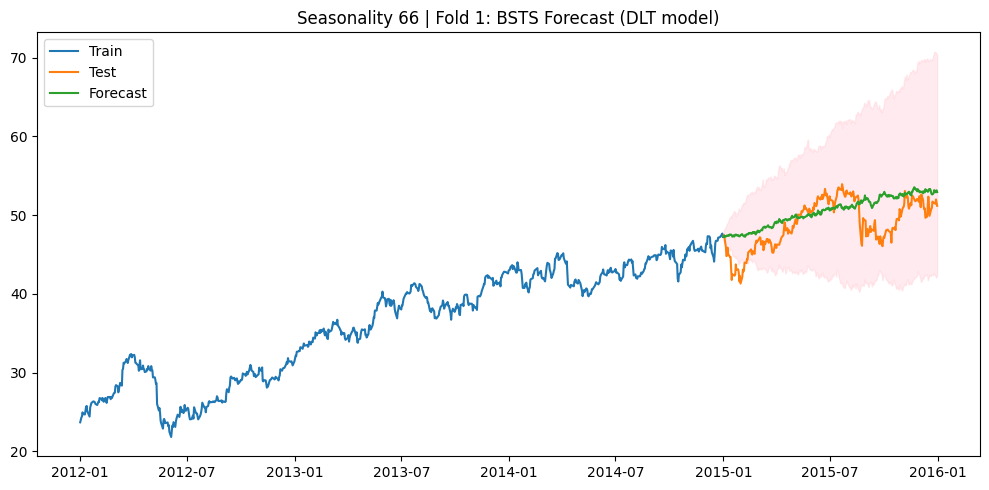

2025-06-09 18:38:47 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  6.0201
  MAE:   5.7485
  MAPE:  0.1137
  SMAPE: 0.1081
  R2:    0.1566


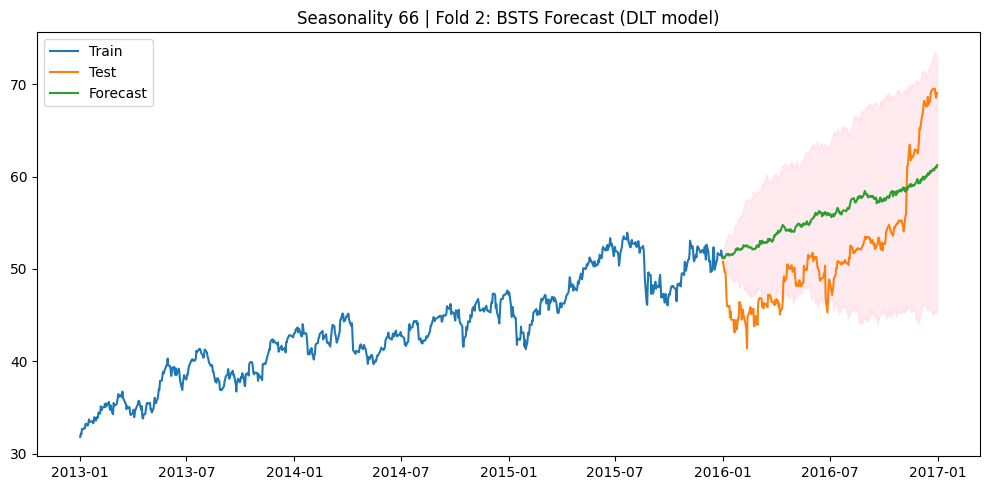

2025-06-09 18:40:53 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  5.8210
  MAE:   4.2317
  MAPE:  0.0535
  SMAPE: 0.0560
  R2:    -0.0827


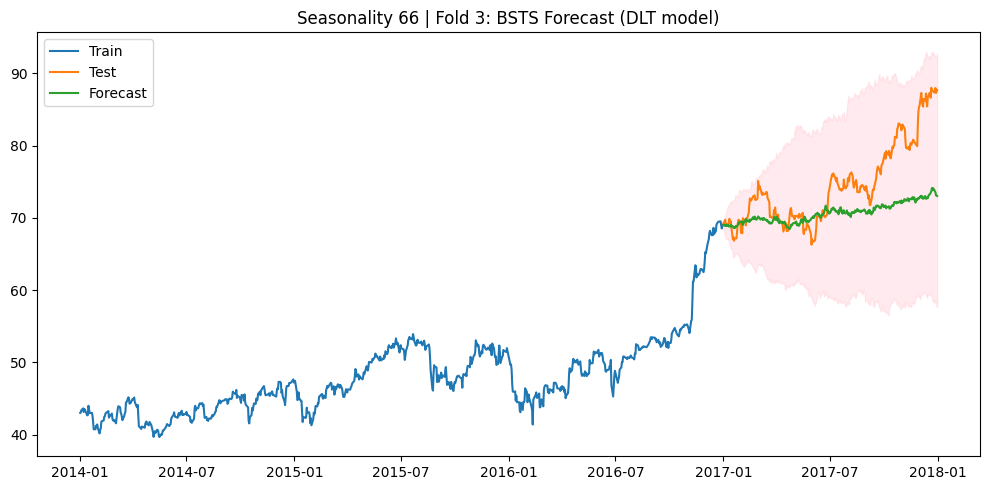

In [18]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2012-01-01', '2014-12-31', '2015-01-01', '2015-12-31'),
    ('2013-01-01', '2015-12-31', '2016-01-01', '2016-12-31'),
    ('2014-01-01', '2016-12-31', '2017-01-01', '2017-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


# Period 1:

2025-06-10 16:16:04 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  4.9574
  MAE:   3.6809
  MAPE:  0.0413
  SMAPE: 0.0405
  R2:    -0.5894


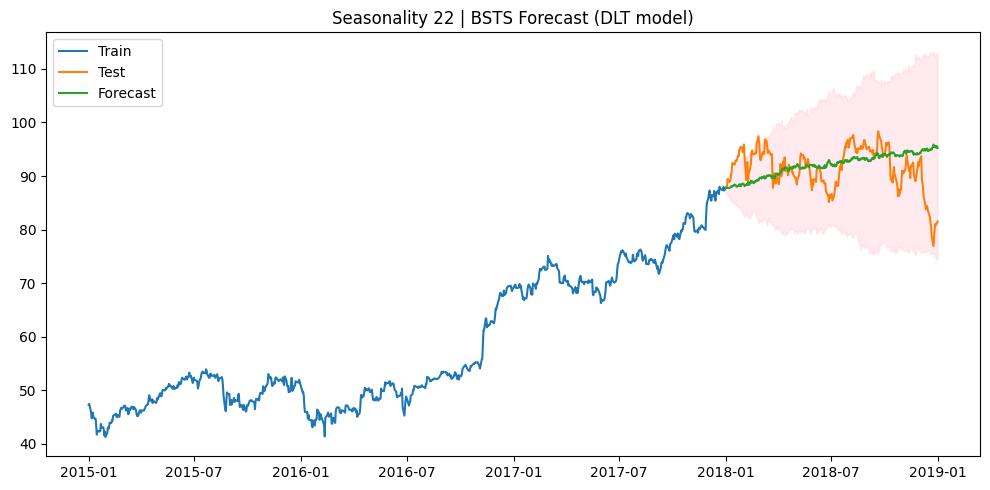

In [11]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

train_start = '2015-01-01'
train_end = '2017-12-31'
test_start = '2018-01-01'
test_end = '2018-12-31'

seasonality = 22

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# Period 2:

2025-06-10 16:19:39 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  22.4820
  MAE:   21.3181
  MAPE:  0.1485
  SMAPE: 0.1617
  R2:    -4.5563


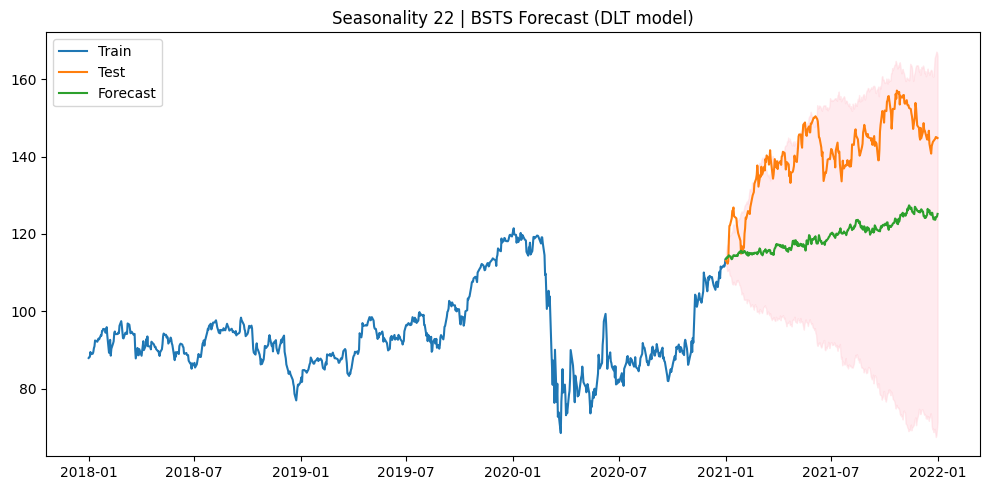

In [12]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
train_start = '2018-01-01'
train_end = '2020-12-31'
test_start = '2021-01-01'
test_end = '2021-12-31'

seasonality = 22

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# Period 3:

2025-06-10 16:22:15 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  35.0240
  MAE:   28.9787
  MAPE:  0.1344
  SMAPE: 0.1480
  R2:    -1.4408


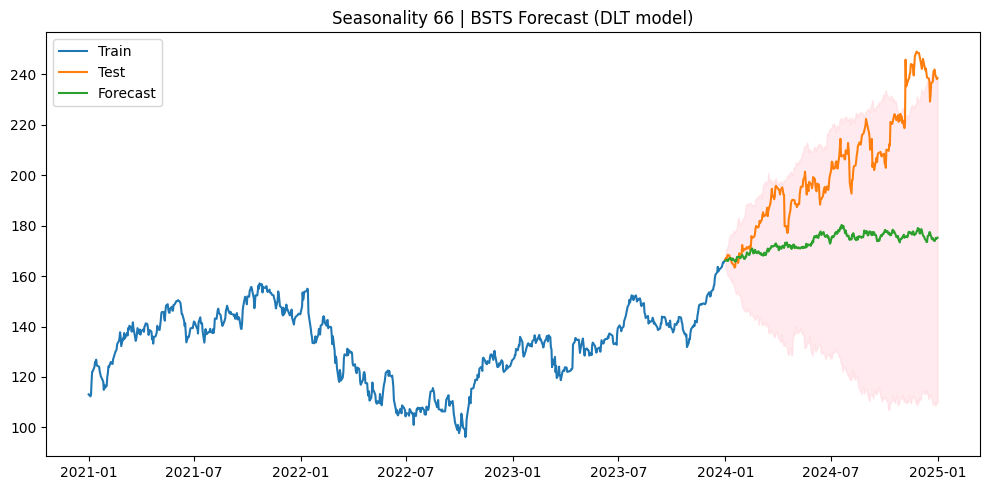

In [13]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('JPM.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
train_start = '2021-01-01'
train_end = '2023-12-31'
test_start = '2024-01-01'
test_end = '2024-12-31'

seasonality = 66

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# NVDA:

2025-06-09 19:23:56 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  7.2244
  MAE:   5.1956
  MAPE:  0.2189
  SMAPE: 0.2652
  R2:    -0.5187


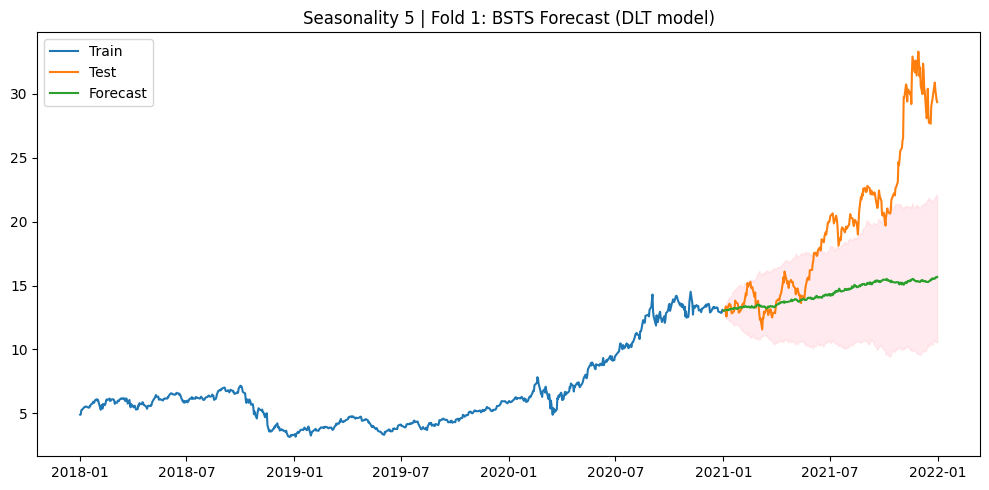

2025-06-09 19:26:08 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  13.7221
  MAE:   12.4824
  MAPE:  0.7884
  SMAPE: 0.5216
  R2:    -7.8156


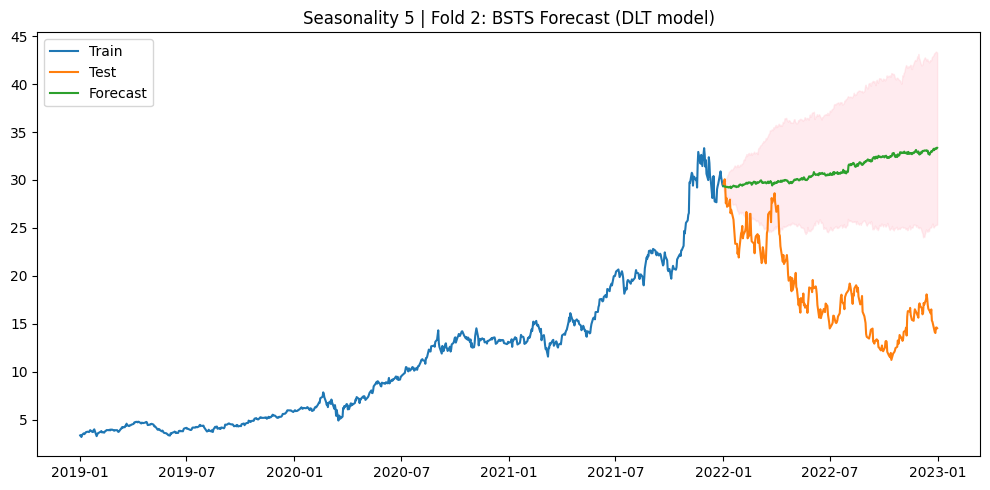

2025-06-09 19:27:58 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  22.4306
  MAE:   20.2064
  MAPE:  0.5102
  SMAPE: 0.7102
  R2:    -3.2892


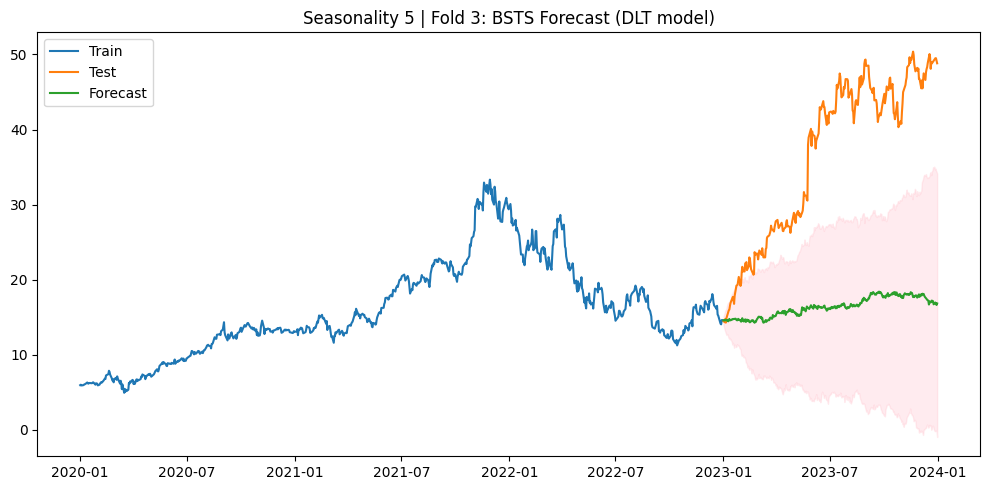

2025-06-09 19:29:20 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  7.1262
  MAE:   5.0943
  MAPE:  0.2142
  SMAPE: 0.2587
  R2:    -0.4777


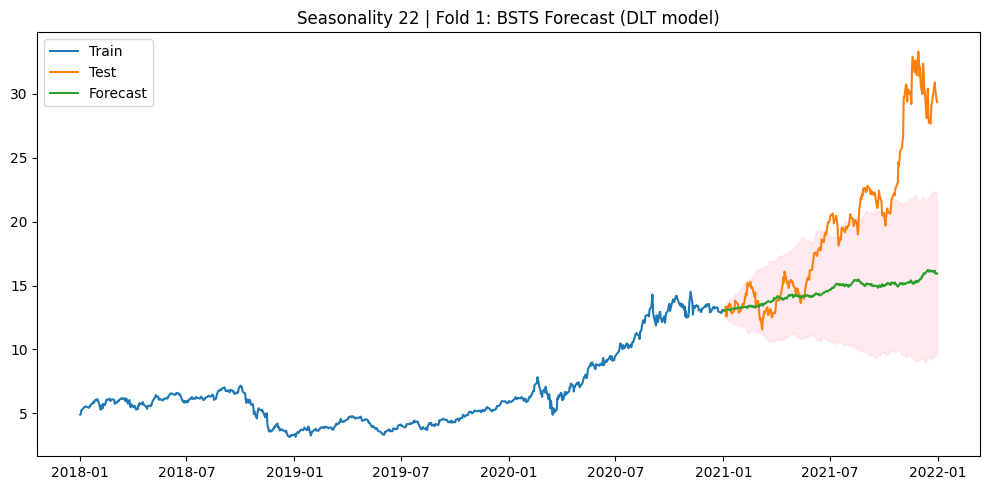

2025-06-09 19:31:16 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  13.9064
  MAE:   12.6879
  MAPE:  0.7999
  SMAPE: 0.5279
  R2:    -8.0541


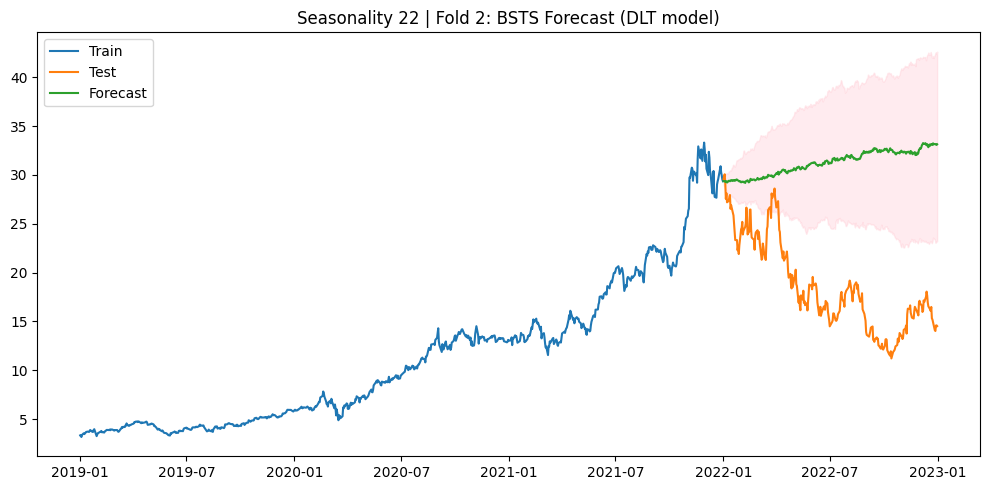

2025-06-09 19:33:06 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  22.6948
  MAE:   20.4074
  MAPE:  0.5142
  SMAPE: 0.7191
  R2:    -3.3908


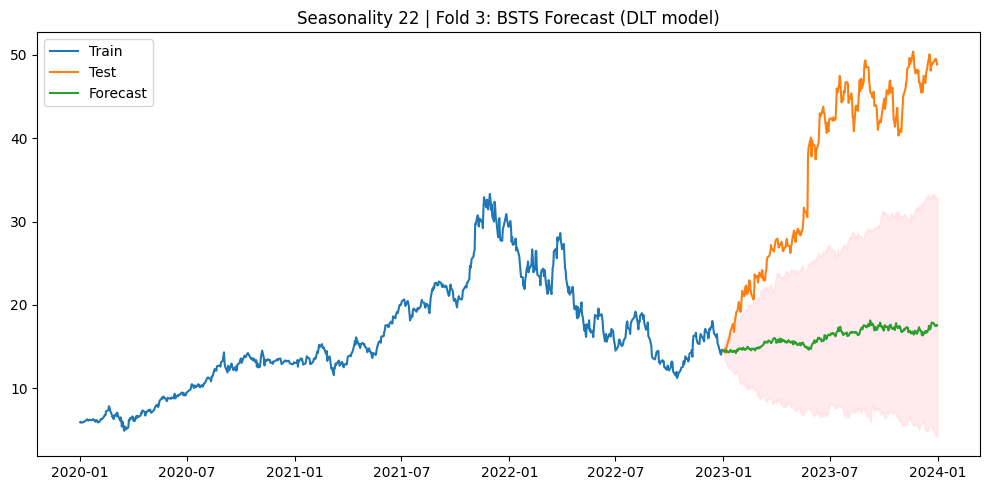

2025-06-09 19:34:39 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  7.1696
  MAE:   5.1303
  MAPE:  0.2159
  SMAPE: 0.2609
  R2:    -0.4957


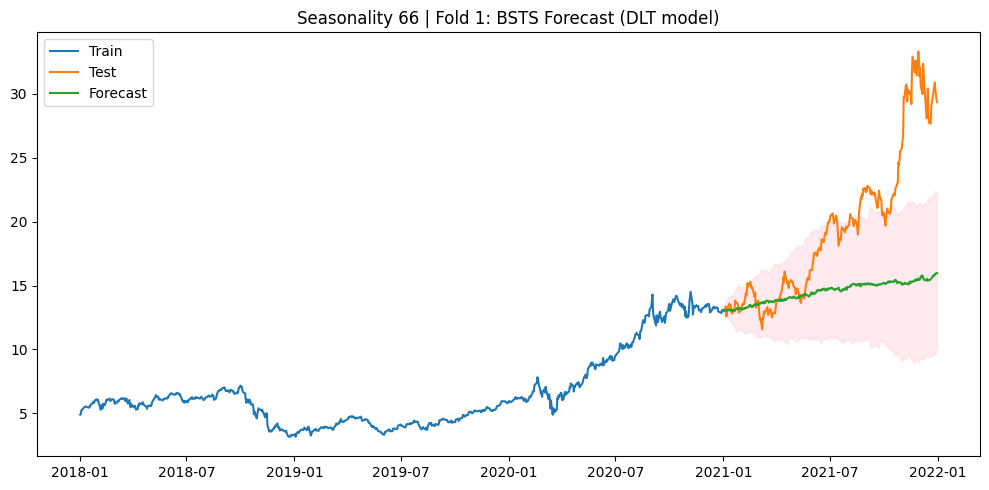

2025-06-09 19:36:55 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  13.2431
  MAE:   12.1260
  MAPE:  0.7628
  SMAPE: 0.5123
  R2:    -7.2110


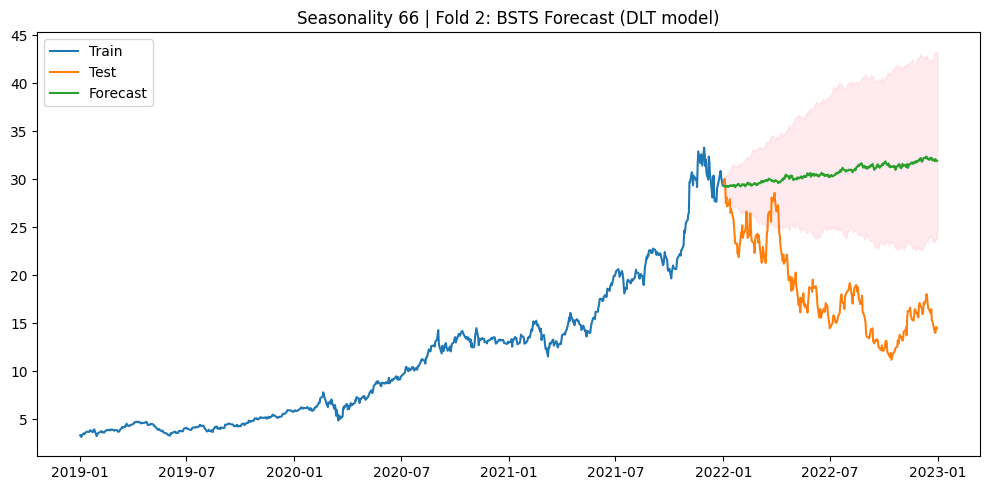

2025-06-09 19:39:14 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  22.4651
  MAE:   20.1024
  MAPE:  0.5041
  SMAPE: 0.7023
  R2:    -3.3024


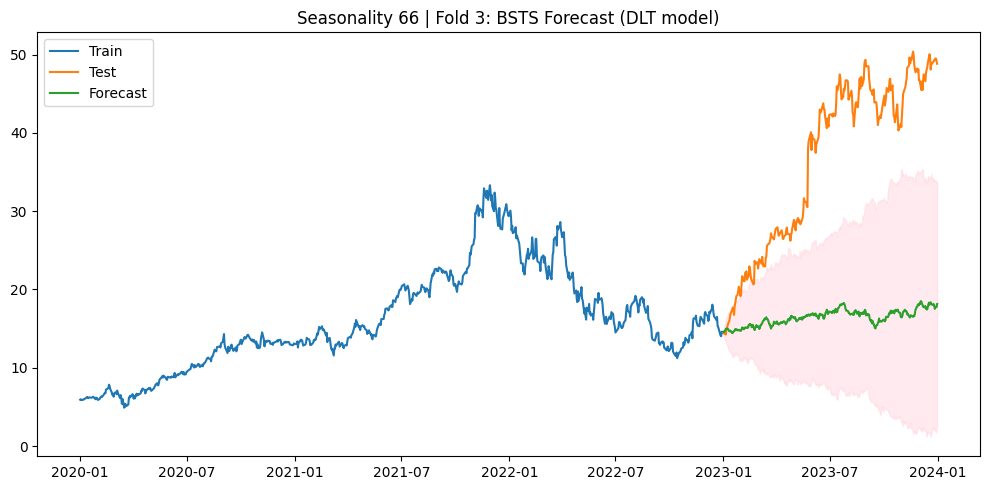

In [20]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


2025-06-09 19:41:45 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  1.1618
  MAE:   1.0278
  MAPE:  0.1994
  SMAPE: 0.1906
  R2:    -0.5673


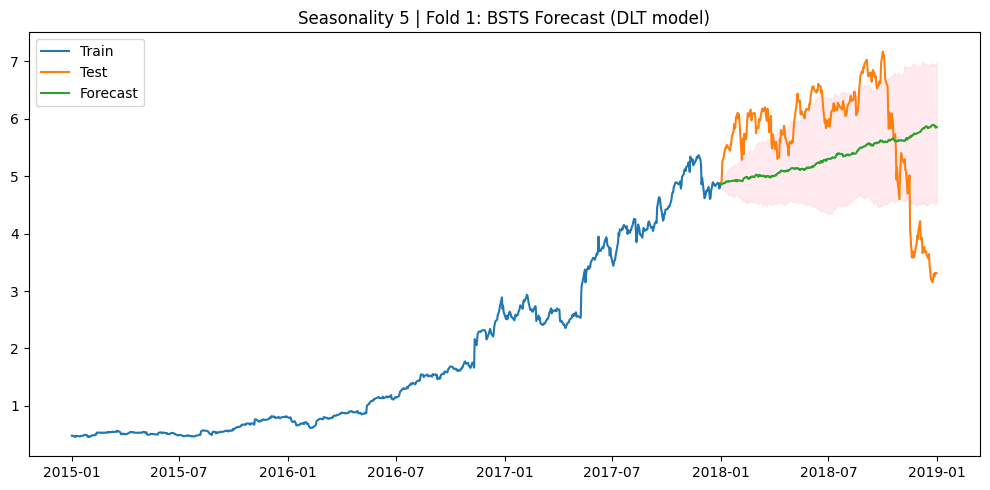

2025-06-09 19:44:43 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  0.5435
  MAE:   0.4384
  MAPE:  0.0968
  SMAPE: 0.1027
  R2:    0.2579


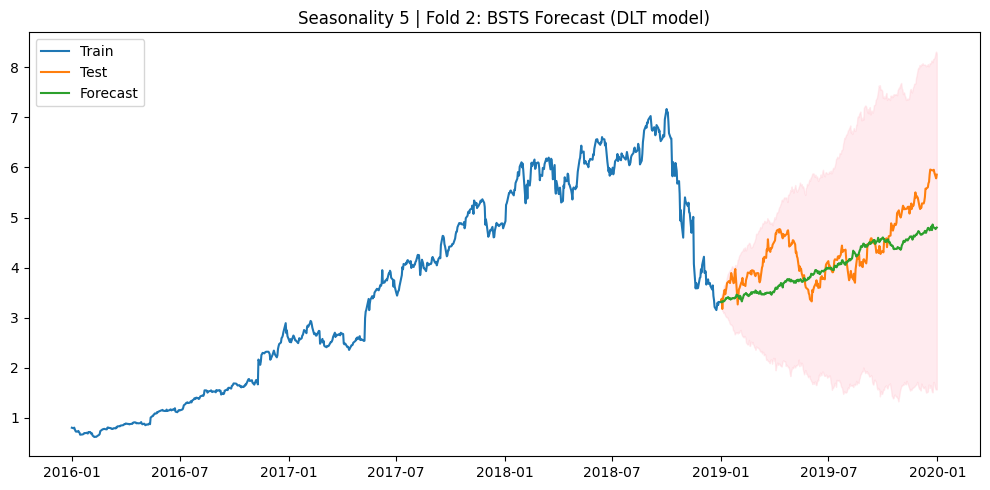

2025-06-09 19:47:28 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  3.8826
  MAE:   3.1225
  MAPE:  0.2719
  SMAPE: 0.3330
  R2:    -0.7733


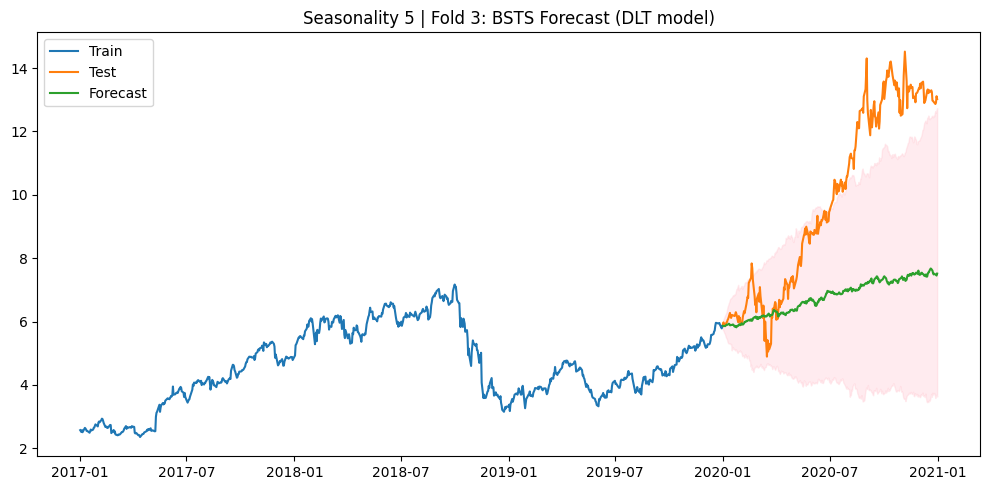

2025-06-09 19:49:36 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  1.1246
  MAE:   0.9713
  MAPE:  0.1911
  SMAPE: 0.1797
  R2:    -0.4686


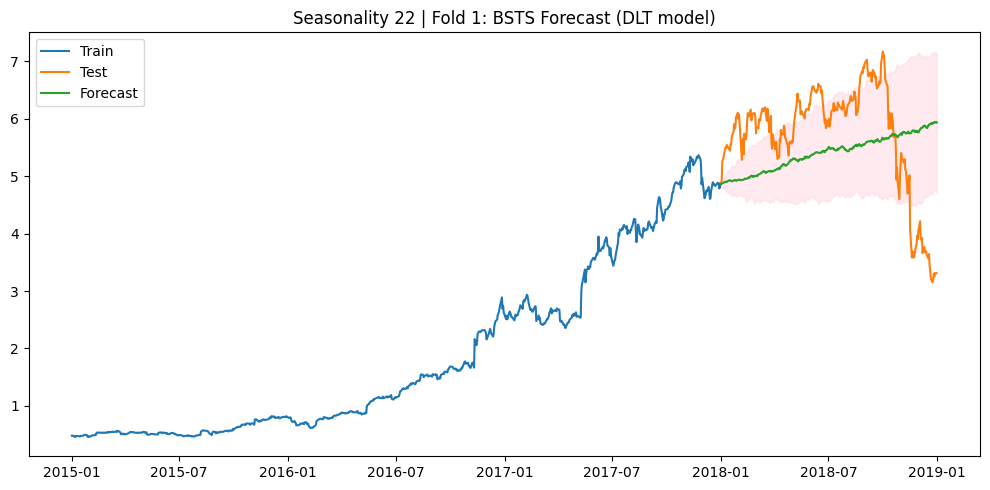

2025-06-09 19:52:28 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  0.4771
  MAE:   0.4002
  MAPE:  0.0910
  SMAPE: 0.0937
  R2:    0.4281


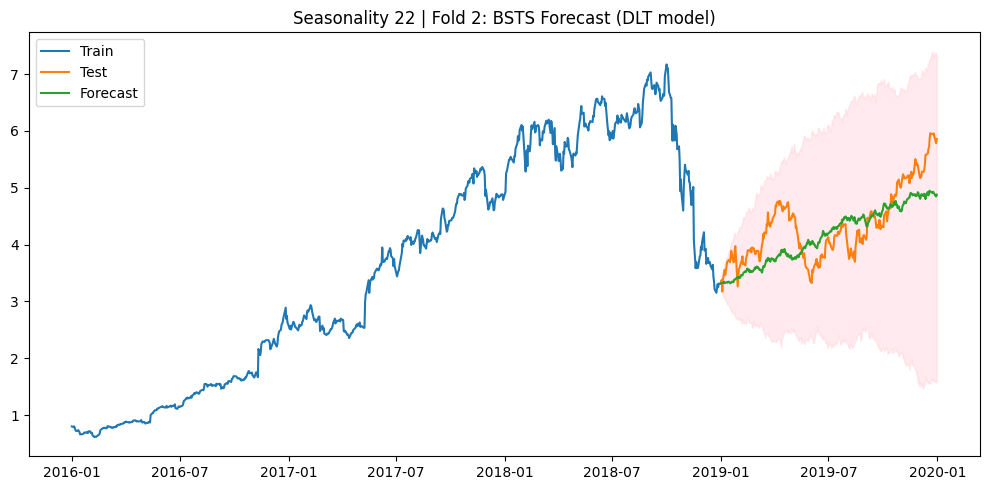

2025-06-09 19:55:09 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  3.9650
  MAE:   3.1834
  MAPE:  0.2767
  SMAPE: 0.3409
  R2:    -0.8494


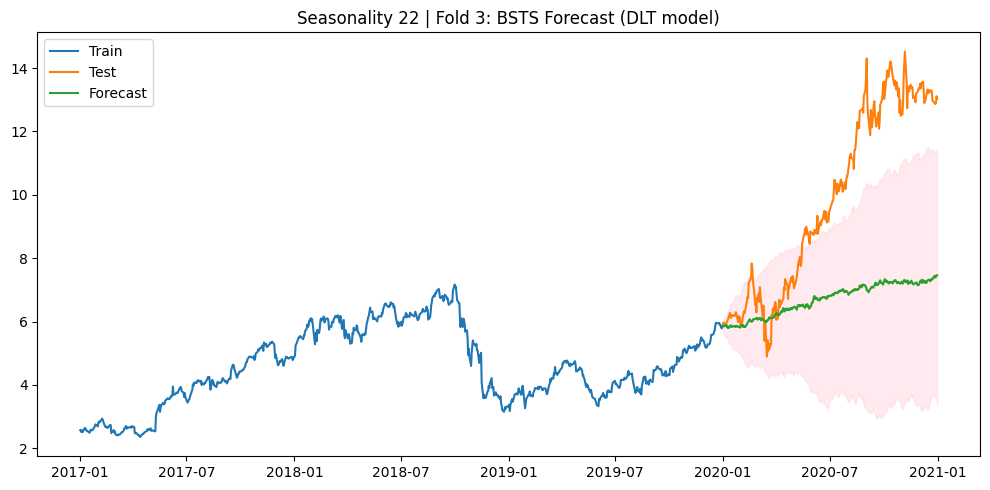

2025-06-09 19:57:25 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  1.1394
  MAE:   0.9996
  MAPE:  0.1948
  SMAPE: 0.1850
  R2:    -0.5076


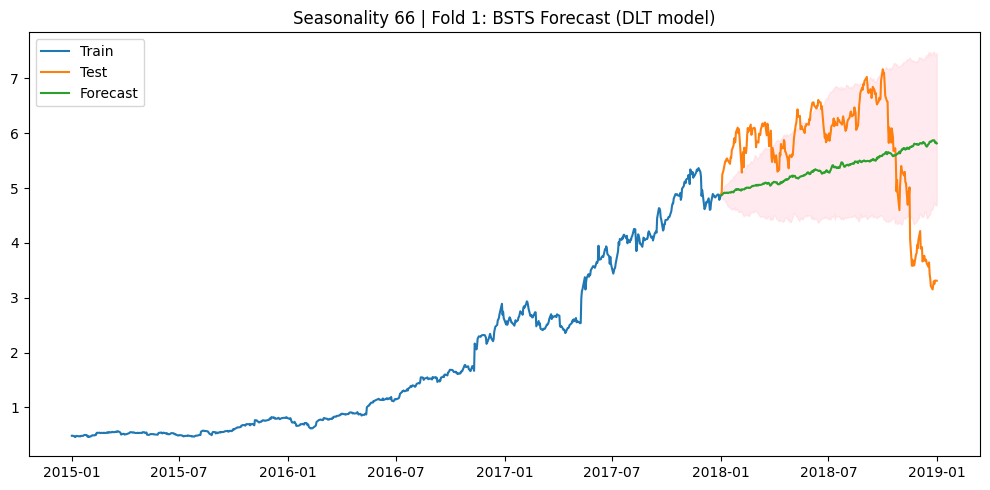

2025-06-09 20:01:43 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  0.7008
  MAE:   0.5506
  MAPE:  0.1184
  SMAPE: 0.1288
  R2:    -0.2341


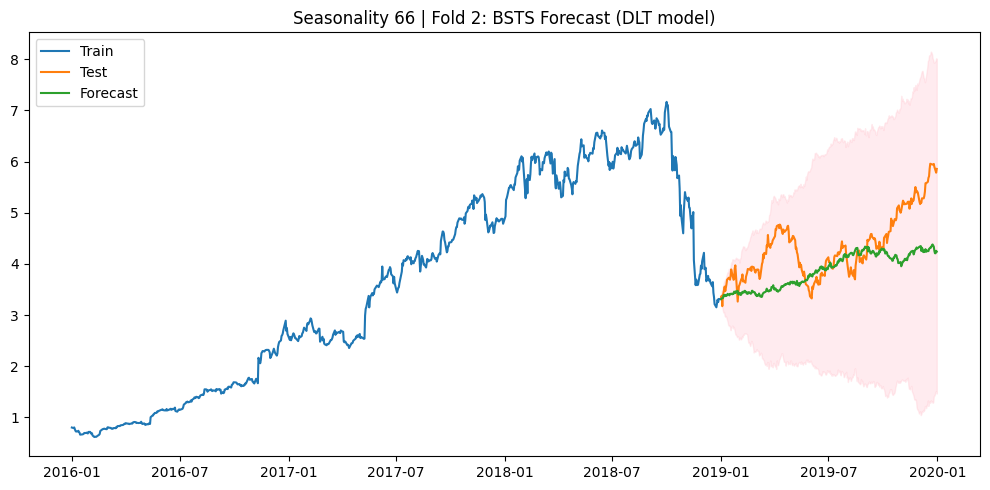

2025-06-09 20:04:51 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  4.0015
  MAE:   3.1805
  MAPE:  0.2749
  SMAPE: 0.3396
  R2:    -0.8836


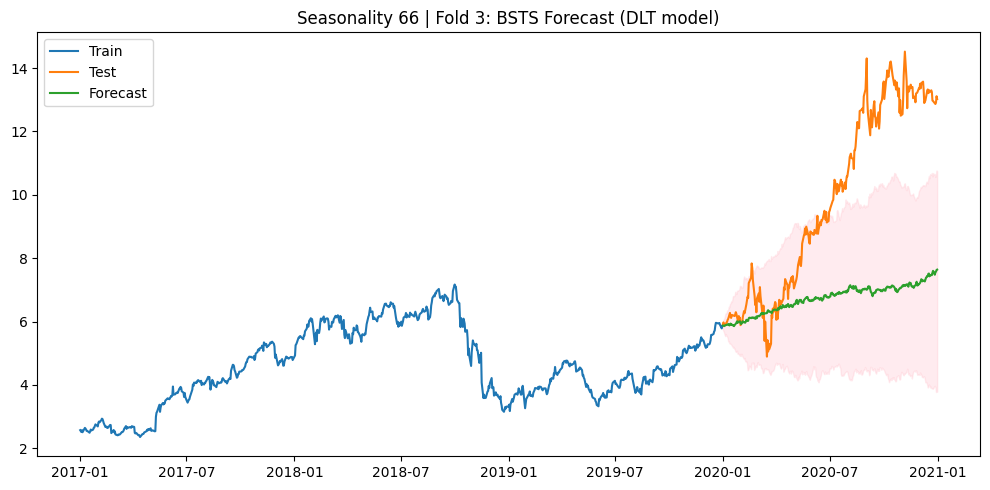

In [21]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2015-01-01', '2017-12-31', '2018-01-01', '2018-12-31'),
    ('2016-01-01', '2018-12-31', '2019-01-01', '2019-12-31'),
    ('2017-01-01', '2019-12-31', '2020-01-01', '2020-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


2025-06-10 14:12:22 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  0.1457
  MAE:   0.1021
  MAPE:  0.1550
  SMAPE: 0.1795
  R2:    -1.0153


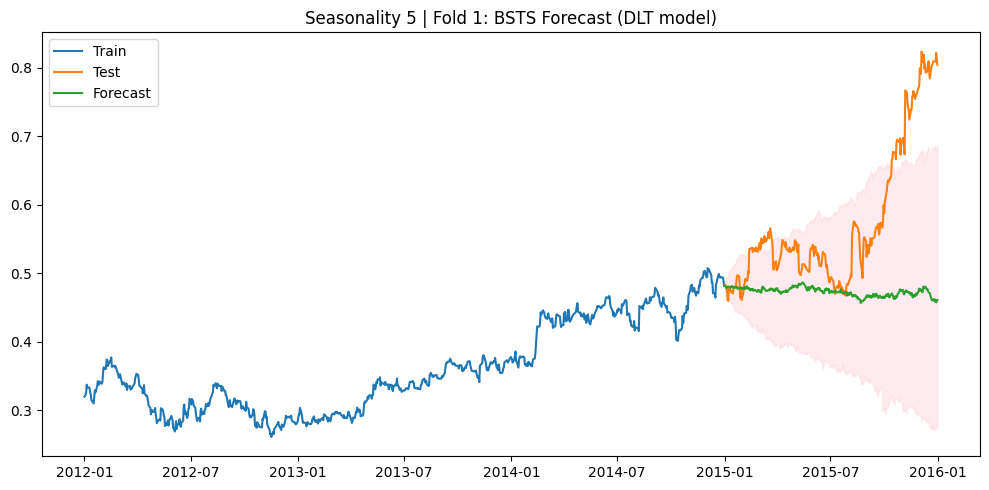

2025-06-10 14:17:00 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  0.7237
  MAE:   0.5263
  MAPE:  0.3208
  SMAPE: 0.4132
  R2:    -0.7615


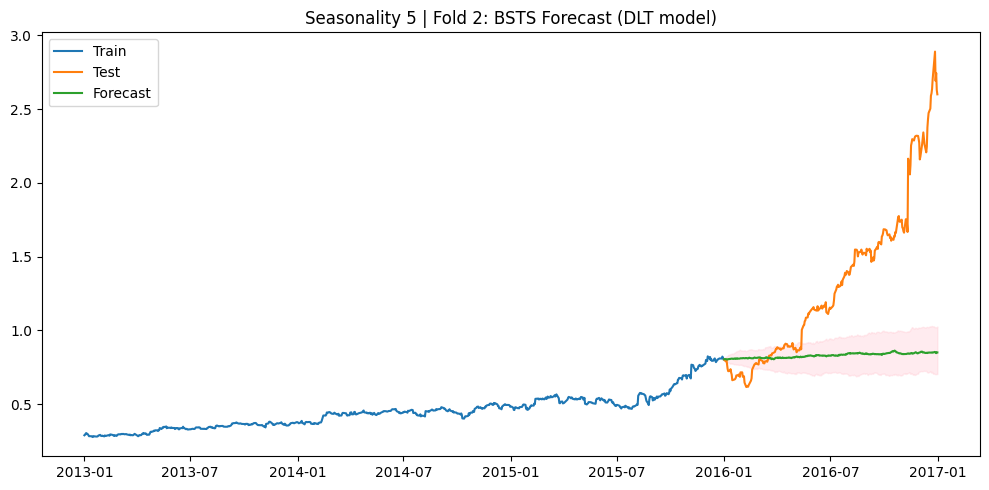

2025-06-10 14:21:32 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  1.3731
  MAE:   1.0806
  MAPE:  0.2500
  SMAPE: 0.3063
  R2:    -1.1046


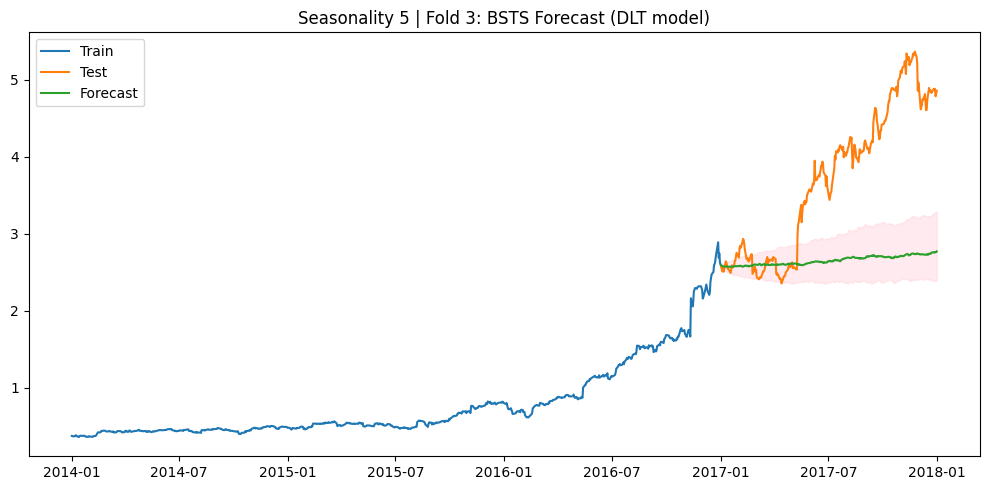

2025-06-10 14:25:41 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  0.1408
  MAE:   0.0952
  MAPE:  0.1428
  SMAPE: 0.1651
  R2:    -0.8817


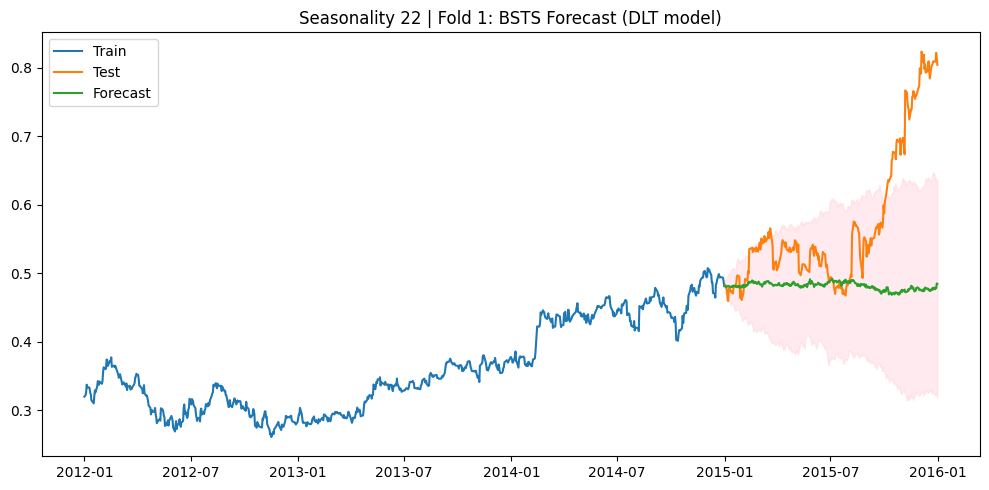

2025-06-10 14:29:43 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  0.7098
  MAE:   0.5123
  MAPE:  0.3110
  SMAPE: 0.3981
  R2:    -0.6948


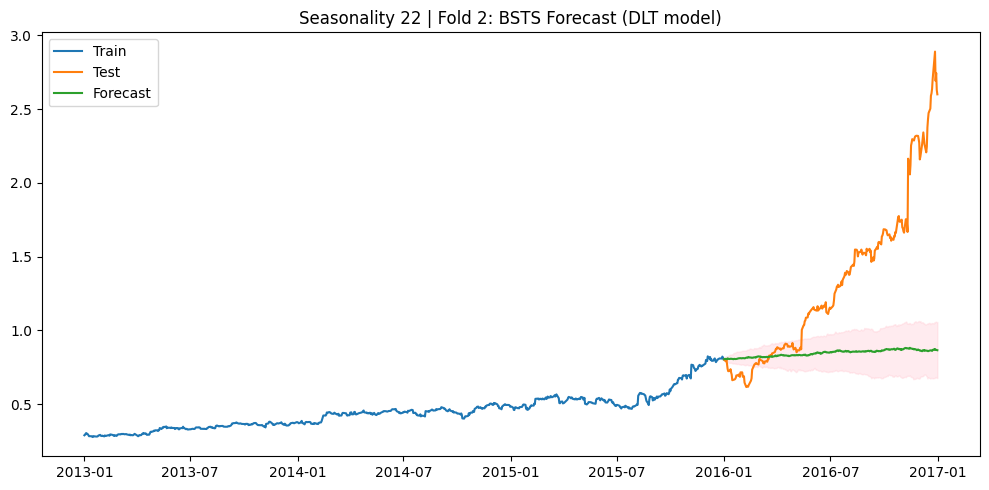

2025-06-10 14:33:46 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  1.3579
  MAE:   1.0676
  MAPE:  0.2469
  SMAPE: 0.3017
  R2:    -1.0584


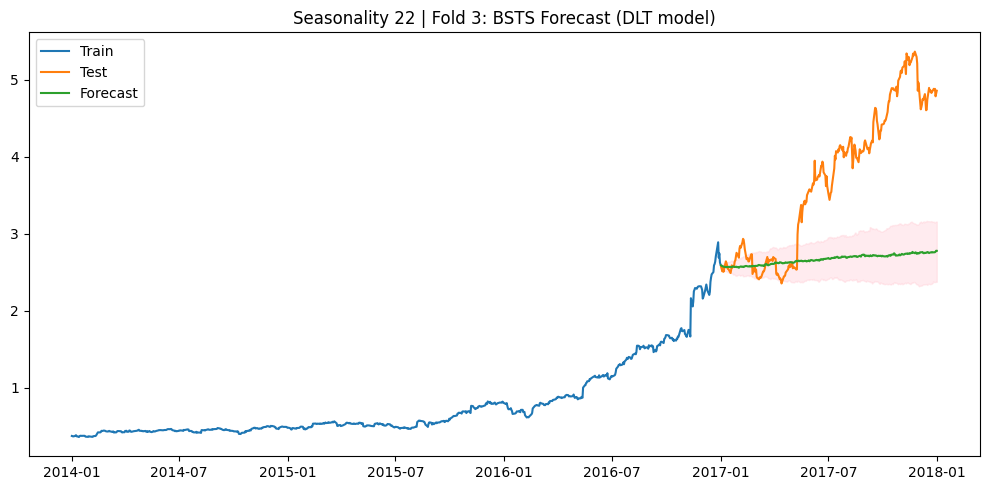

2025-06-10 14:37:49 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  0.1391
  MAE:   0.0958
  MAPE:  0.1447
  SMAPE: 0.1666
  R2:    -0.8378


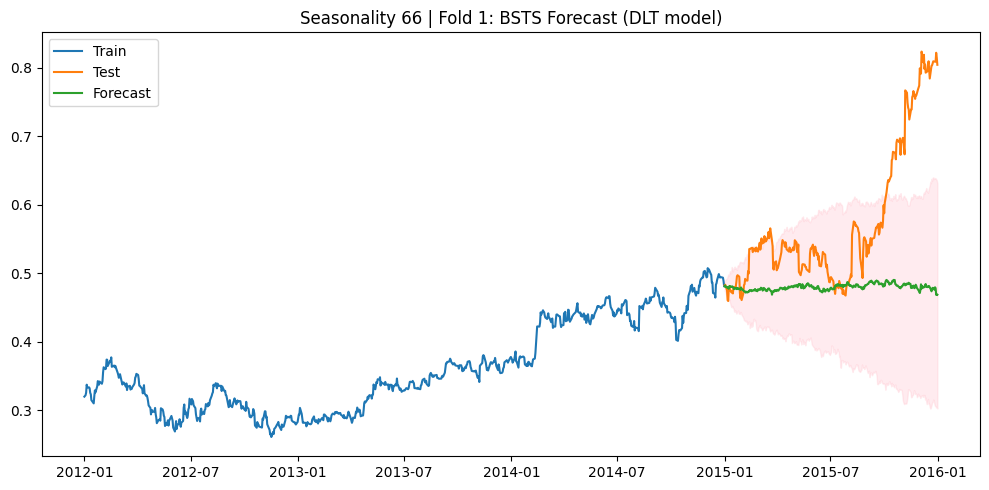

2025-06-10 14:41:50 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  0.7178
  MAE:   0.5246
  MAPE:  0.3204
  SMAPE: 0.4120
  R2:    -0.7329


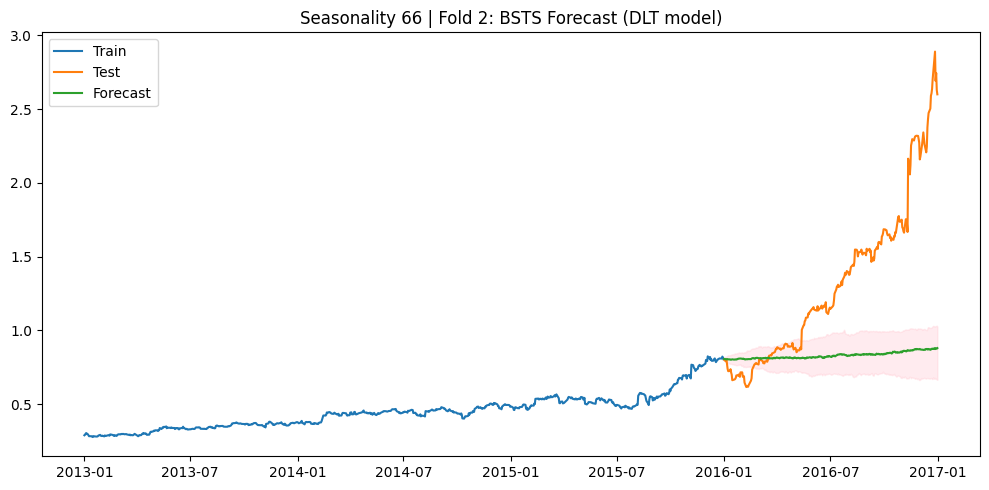

2025-06-10 14:46:40 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  1.3513
  MAE:   1.0630
  MAPE:  0.2459
  SMAPE: 0.3001
  R2:    -1.0383


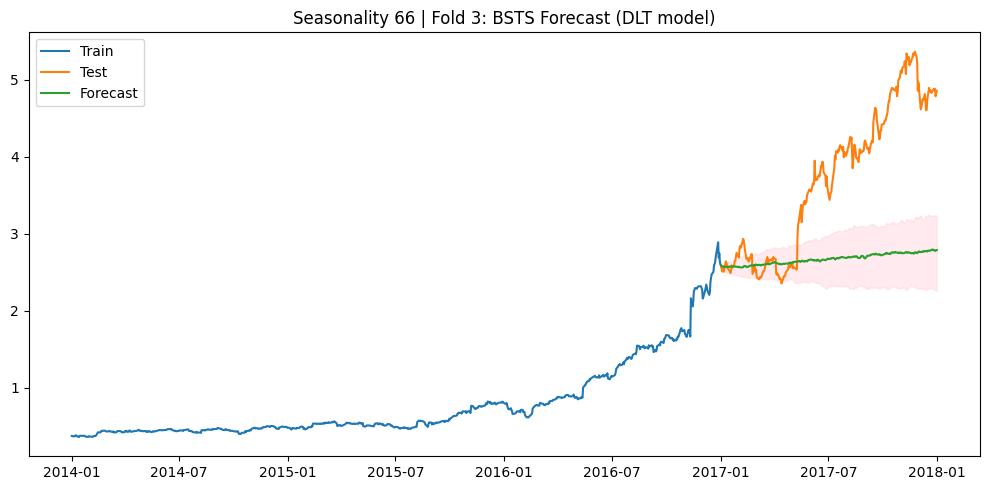

In [3]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2012-01-01', '2014-12-31', '2015-01-01', '2015-12-31'),
    ('2013-01-01', '2015-12-31', '2016-01-01', '2016-12-31'),
    ('2014-01-01', '2016-12-31', '2017-01-01', '2017-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


# Period 1:

2025-06-10 16:30:35 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  1.1246
  MAE:   0.9713
  MAPE:  0.1911
  SMAPE: 0.1797
  R2:    -0.4686


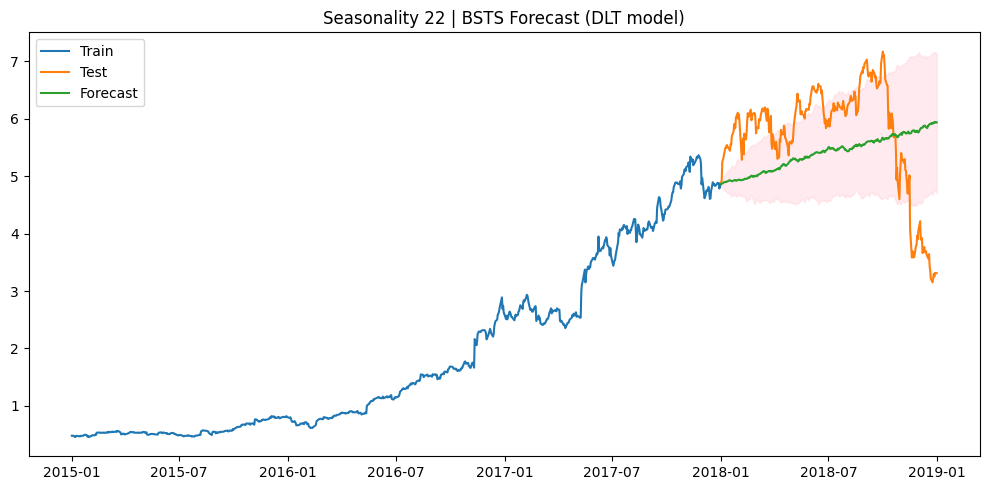

In [14]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

train_start = '2015-01-01'
train_end = '2017-12-31'
test_start = '2018-01-01'
test_end = '2018-12-31'

seasonality = 22

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# Period 2:

2025-06-10 16:33:26 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  7.1262
  MAE:   5.0943
  MAPE:  0.2142
  SMAPE: 0.2587
  R2:    -0.4777


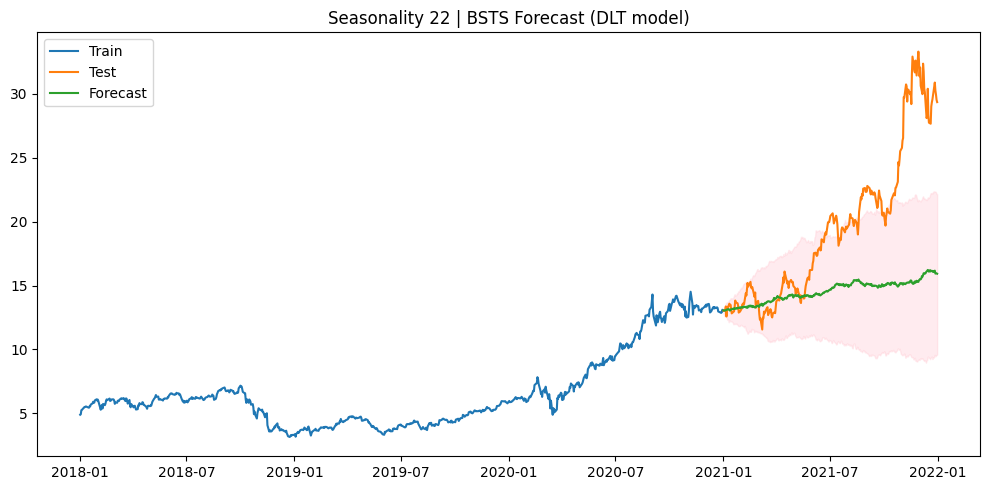

In [15]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
train_start = '2018-01-01'
train_end = '2020-12-31'
test_start = '2021-01-01'
test_end = '2021-12-31'

seasonality = 22

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# Period 3:

2025-06-10 16:35:42 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  60.9218
  MAE:   55.5815
  MAPE:  0.4823
  SMAPE: 0.6561
  R2:    -4.1248


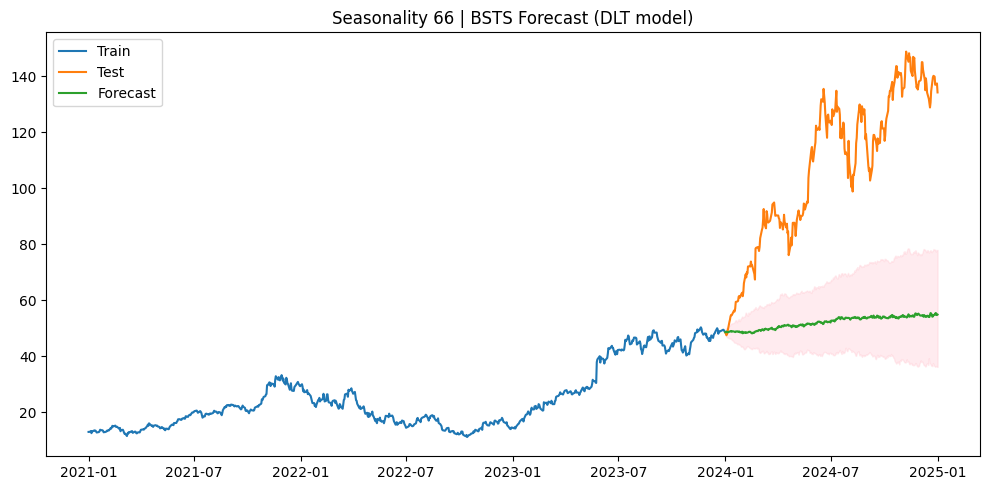

In [16]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('NVDA.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
train_start = '2021-01-01'
train_end = '2023-12-31'
test_start = '2024-01-01'
test_end = '2024-12-31'

seasonality = 66

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# SPY:

2025-06-09 22:59:35 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  11.0974
  MAE:   7.8437
  MAPE:  0.0326
  SMAPE: 0.0318
  R2:    -0.4292


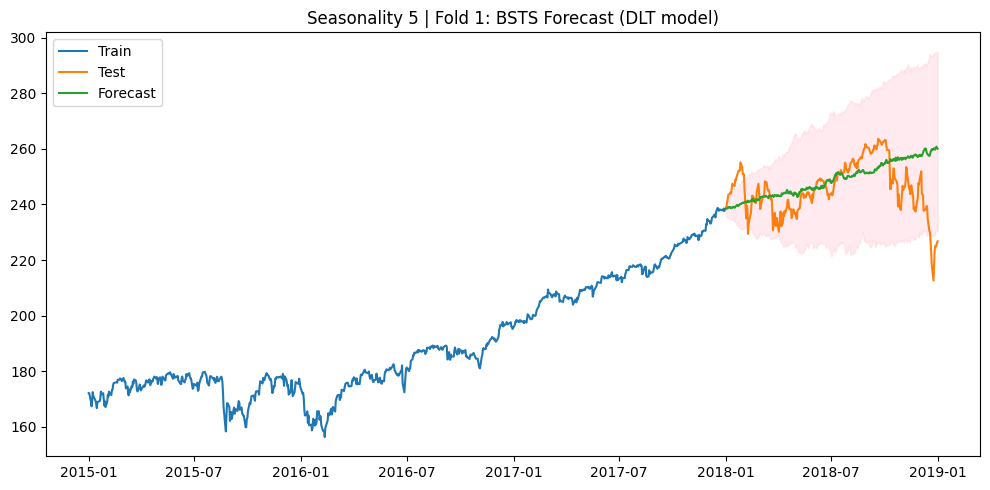

2025-06-09 23:00:46 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  26.8529
  MAE:   25.5219
  MAPE:  0.0946
  SMAPE: 0.0998
  R2:    -2.1000


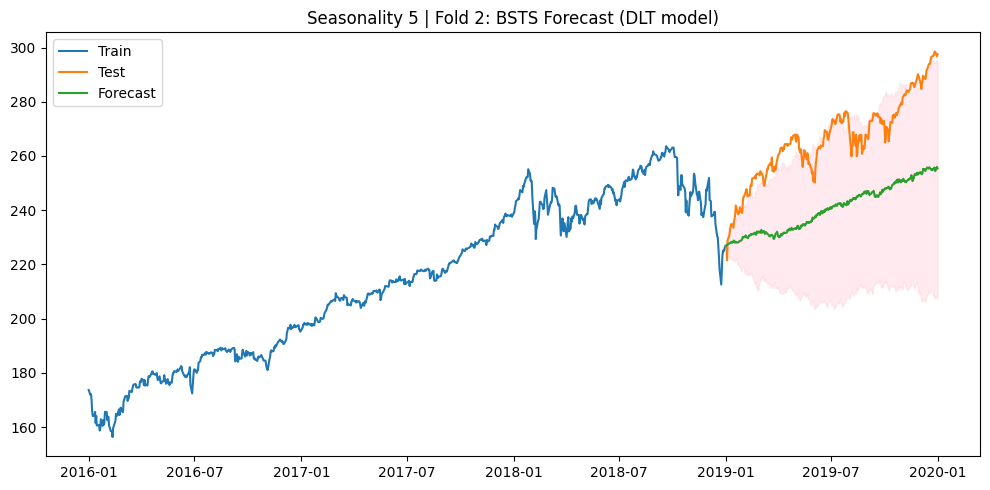

2025-06-09 23:01:56 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  30.0656
  MAE:   21.7054
  MAPE:  0.0807
  SMAPE: 0.0744
  R2:    0.0316


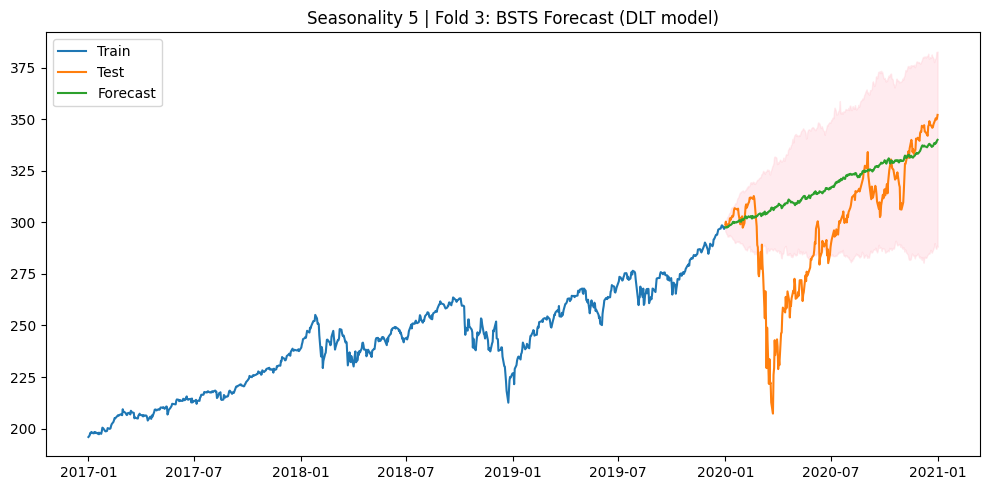

2025-06-09 23:03:06 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  12.9771
  MAE:   9.1507
  MAPE:  0.0383
  SMAPE: 0.0370
  R2:    -0.9544


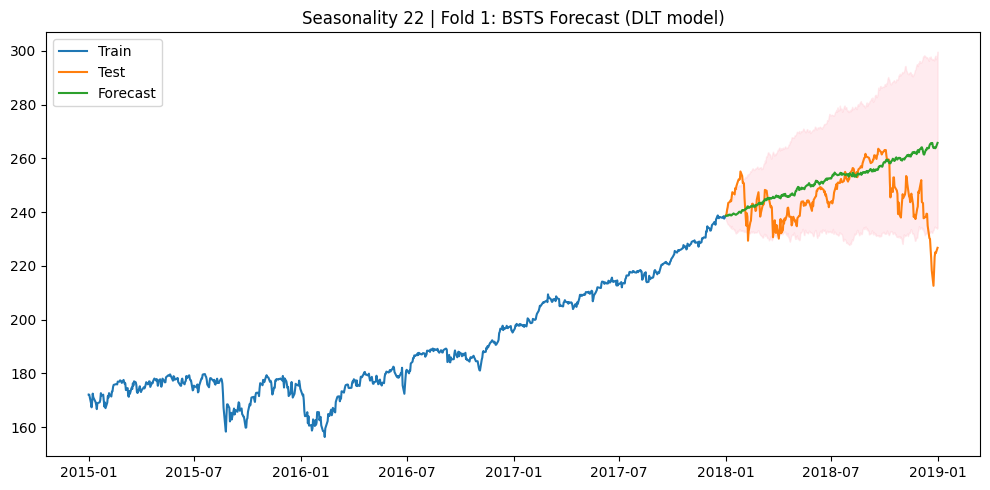

2025-06-09 23:04:26 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  24.5011
  MAE:   23.1971
  MAPE:  0.0860
  SMAPE: 0.0902
  R2:    -1.5807


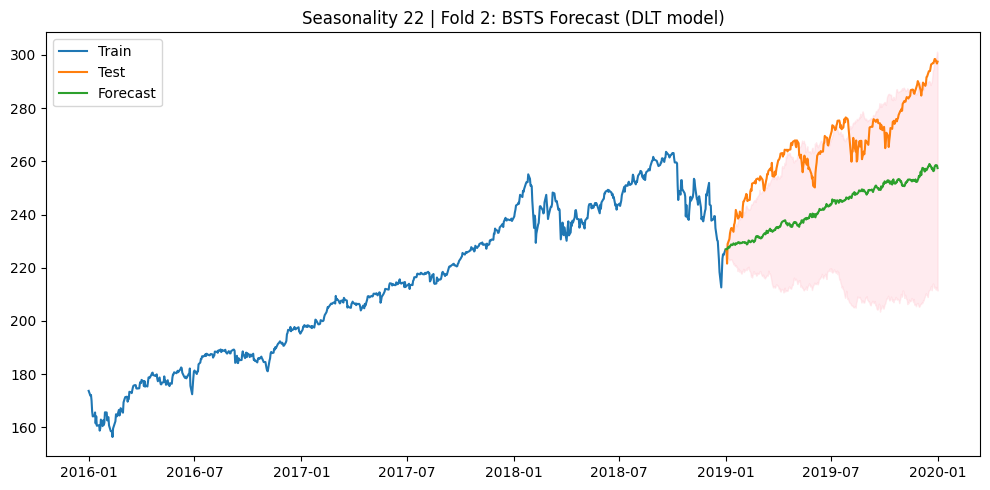

2025-06-09 23:05:46 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  31.7433
  MAE:   23.4660
  MAPE:  0.0869
  SMAPE: 0.0799
  R2:    -0.0795


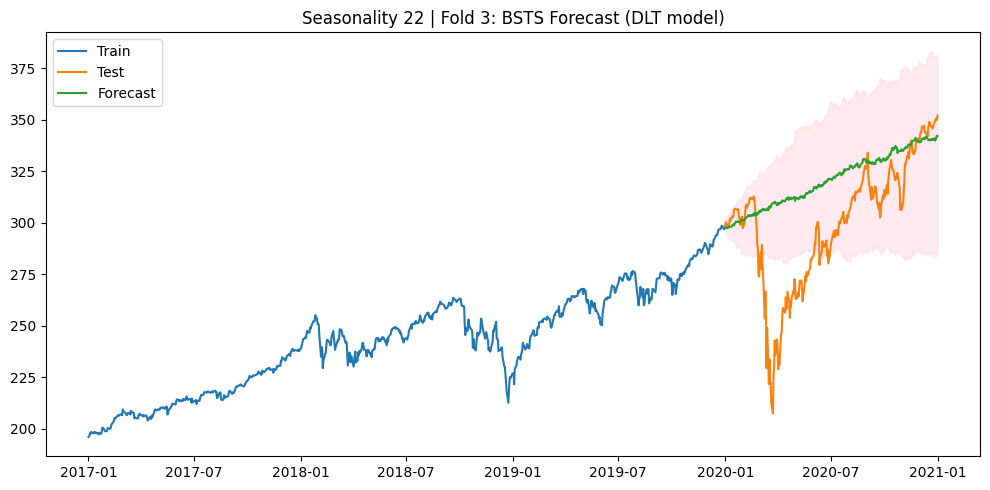

2025-06-09 23:07:07 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2015-01-01 to 2017-12-31 | Test: 2018-01-01 to 2018-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  13.1769
  MAE:   9.5067
  MAPE:  0.0398
  SMAPE: 0.0384
  R2:    -1.0150


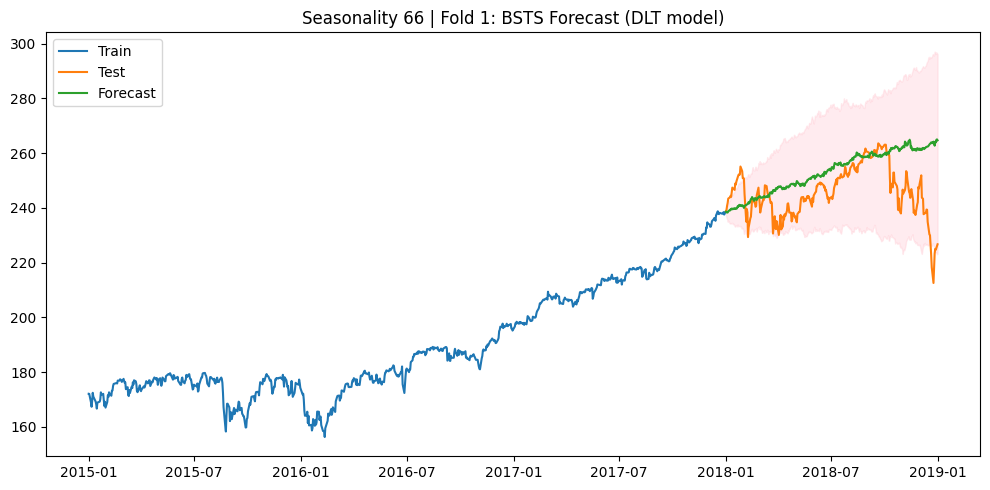

2025-06-09 23:09:34 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2016-01-01 to 2018-12-31 | Test: 2019-01-01 to 2019-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  26.3071
  MAE:   24.8605
  MAPE:  0.0921
  SMAPE: 0.0970
  R2:    -1.9752


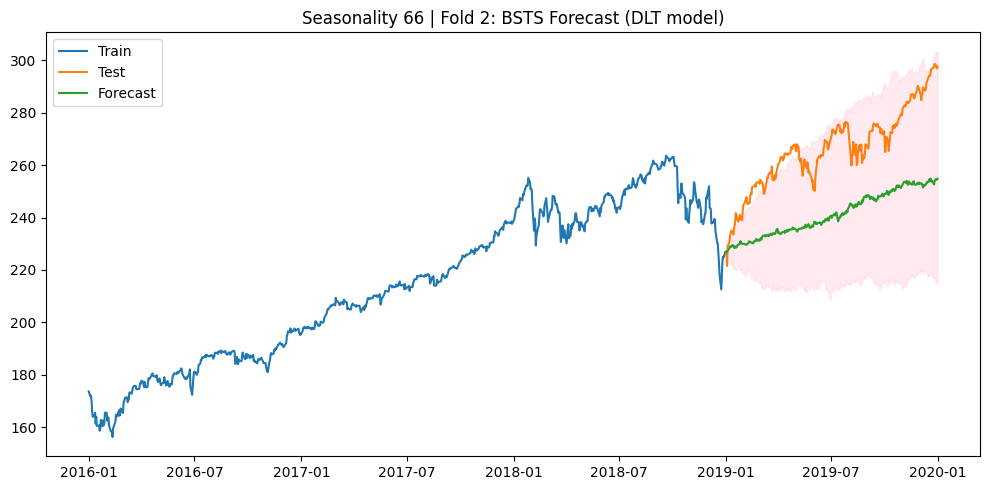

2025-06-09 23:12:10 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2017-01-01 to 2019-12-31 | Test: 2020-01-01 to 2020-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  29.0259
  MAE:   20.8286
  MAPE:  0.0774
  SMAPE: 0.0715
  R2:    0.0974


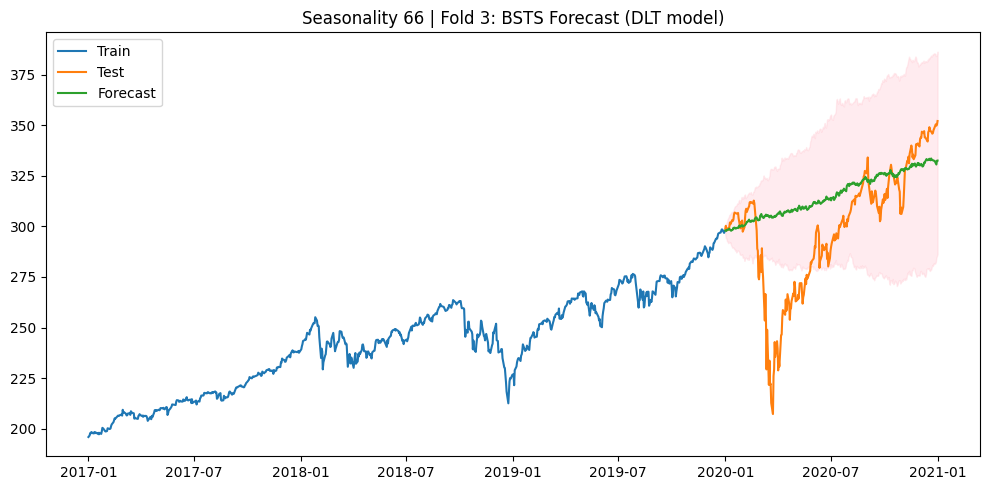

In [3]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2015-01-01', '2017-12-31', '2018-01-01', '2018-12-31'),
    ('2016-01-01', '2018-12-31', '2019-01-01', '2019-12-31'),
    ('2017-01-01', '2019-12-31', '2020-01-01', '2020-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


2025-06-10 00:17:29 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  12.0924
  MAE:   9.0541
  MAPE:  0.0528
  SMAPE: 0.0504
  R2:    -6.4487


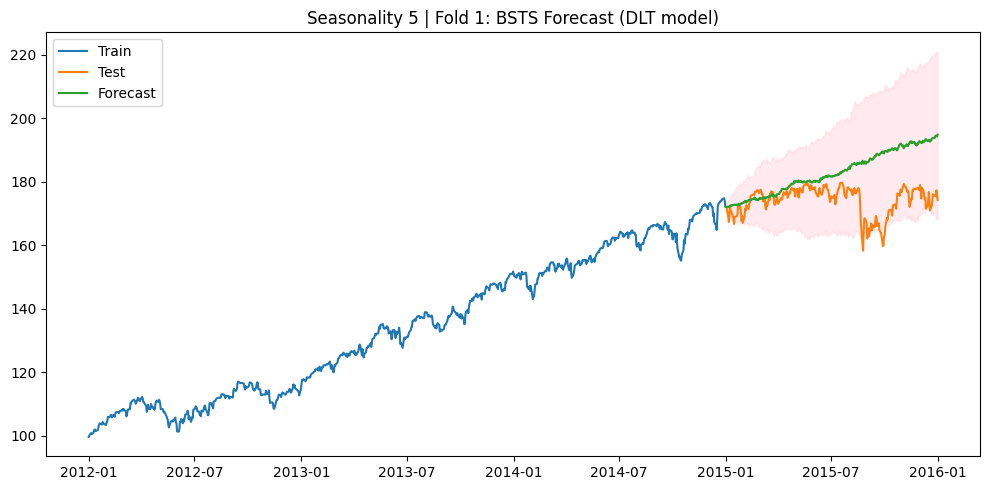

2025-06-10 00:18:49 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  5.8011
  MAE:   4.1850
  MAPE:  0.0241
  SMAPE: 0.0236
  R2:    0.6460


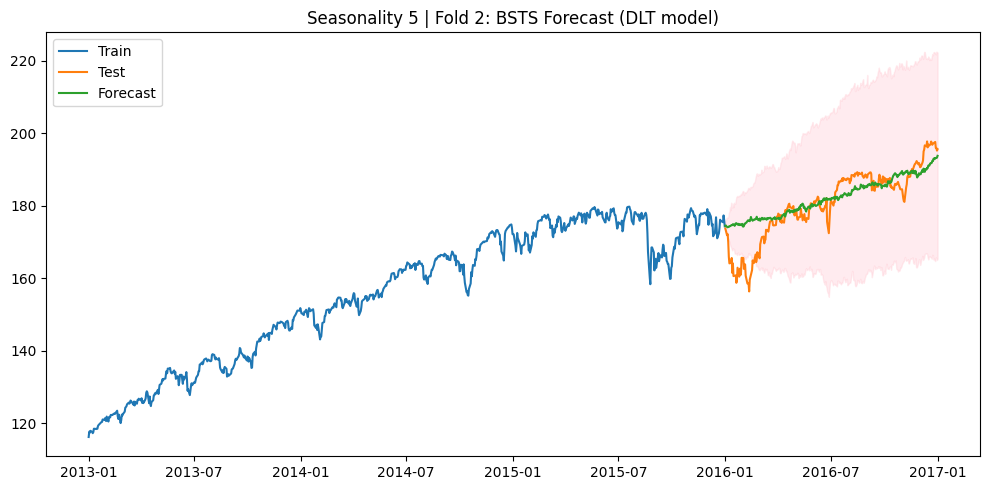

2025-06-10 00:19:59 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  13.5089
  MAE:   12.2270
  MAPE:  0.0556
  SMAPE: 0.0575
  R2:    -0.5309


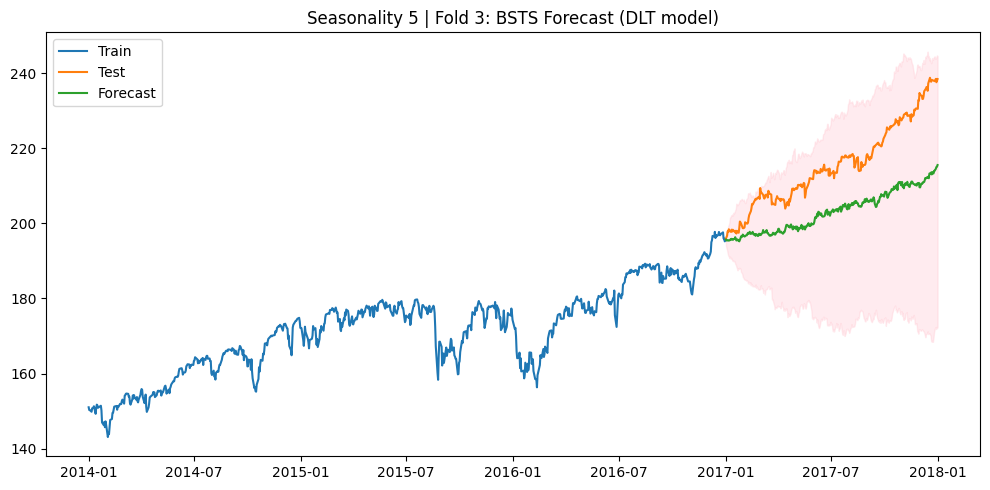

2025-06-10 00:21:03 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  13.5898
  MAE:   10.9590
  MAPE:  0.0637
  SMAPE: 0.0607
  R2:    -8.4077


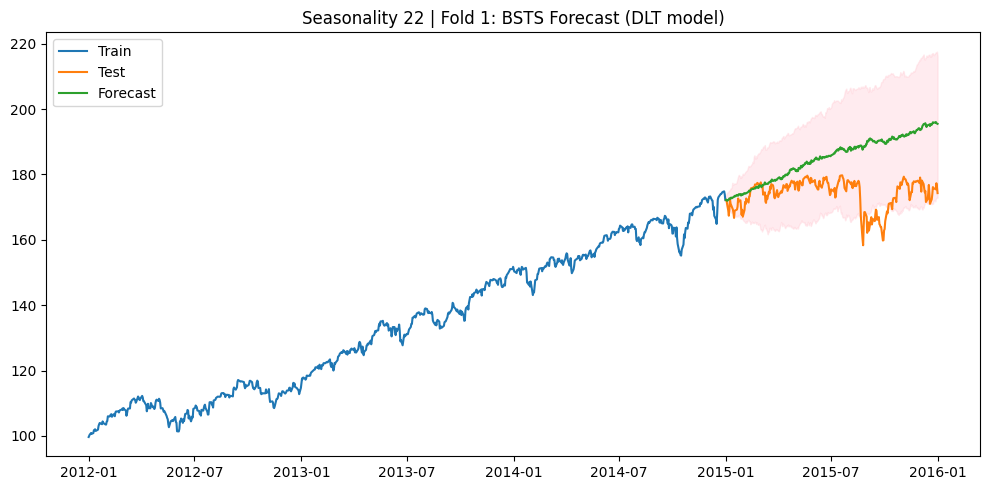

2025-06-10 00:22:23 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  6.7916
  MAE:   5.1766
  MAPE:  0.0299
  SMAPE: 0.0291
  R2:    0.5148


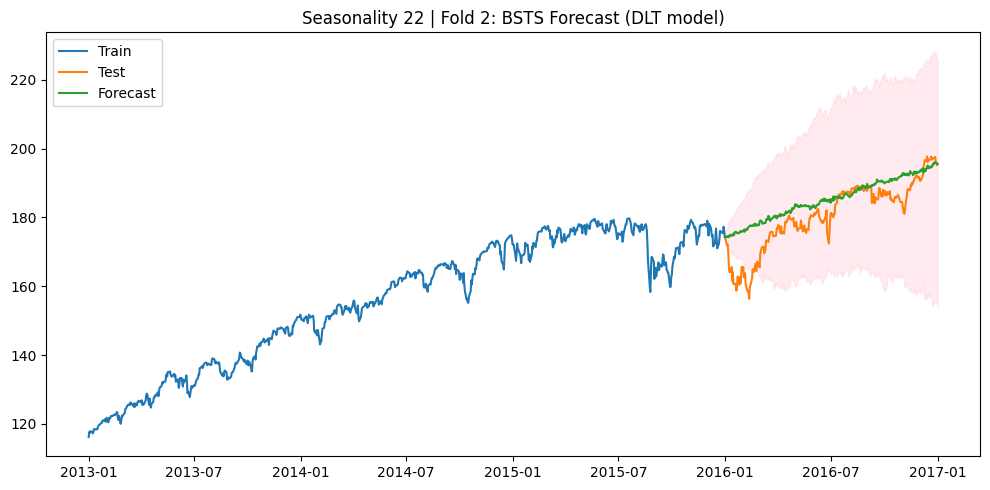

2025-06-10 00:23:41 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  10.7651
  MAE:   9.2499
  MAPE:  0.0418
  SMAPE: 0.0430
  R2:    0.0278


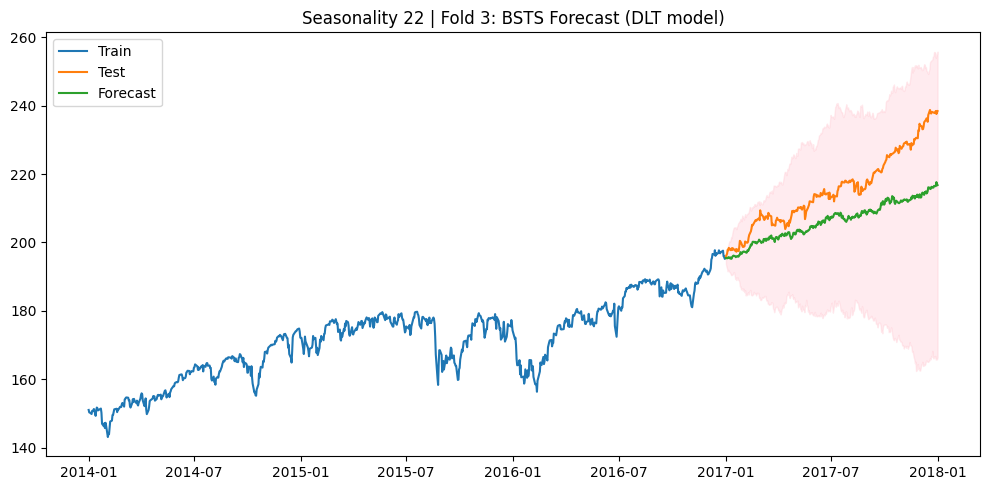

2025-06-10 00:24:56 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2012-01-01 to 2014-12-31 | Test: 2015-01-01 to 2015-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  11.8413
  MAE:   9.0212
  MAPE:  0.0525
  SMAPE: 0.0502
  R2:    -6.1425


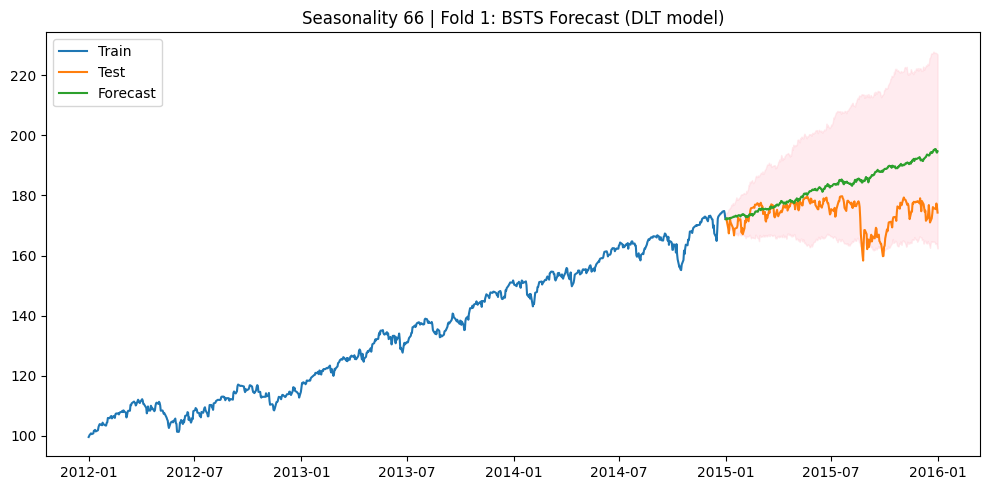

2025-06-10 00:27:28 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2013-01-01 to 2015-12-31 | Test: 2016-01-01 to 2016-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  7.3303
  MAE:   5.9409
  MAPE:  0.0340
  SMAPE: 0.0332
  R2:    0.4347


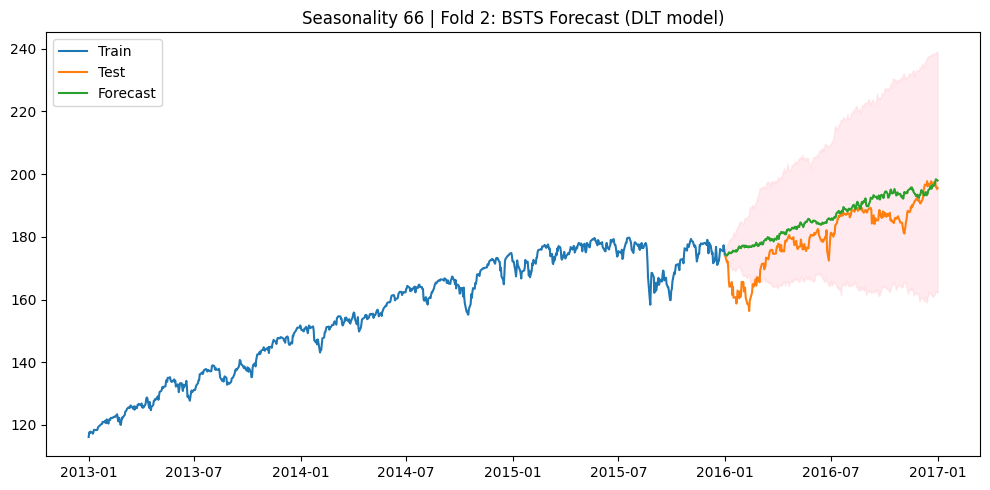

2025-06-10 00:29:57 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2014-01-01 to 2016-12-31 | Test: 2017-01-01 to 2017-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  11.3475
  MAE:   9.3880
  MAPE:  0.0424
  SMAPE: 0.0437
  R2:    -0.0802


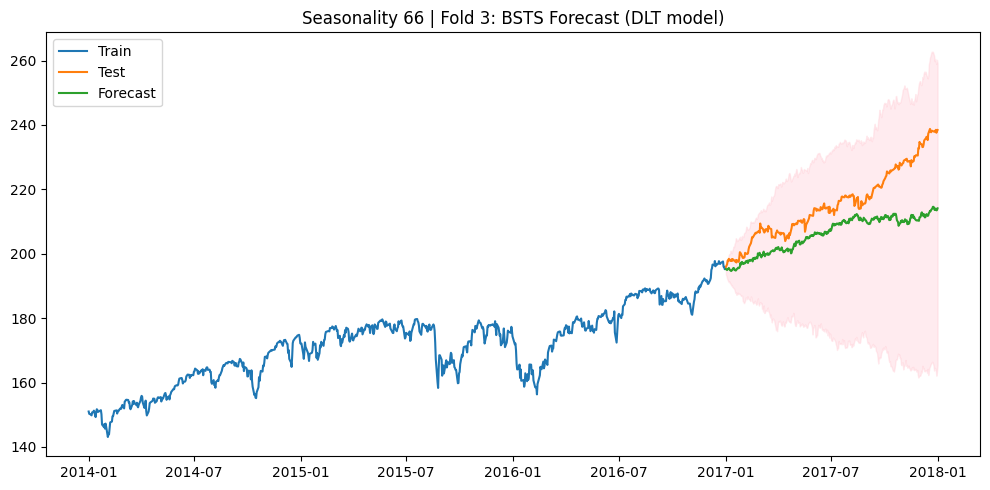

In [7]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2012-01-01', '2014-12-31', '2015-01-01', '2015-12-31'),
    ('2013-01-01', '2015-12-31', '2016-01-01', '2016-12-31'),
    ('2014-01-01', '2016-12-31', '2017-01-01', '2017-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


2025-06-10 14:51:37 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  21.1205
  MAE:   18.6328
  MAPE:  0.0449
  SMAPE: 0.0462
  R2:    0.4601


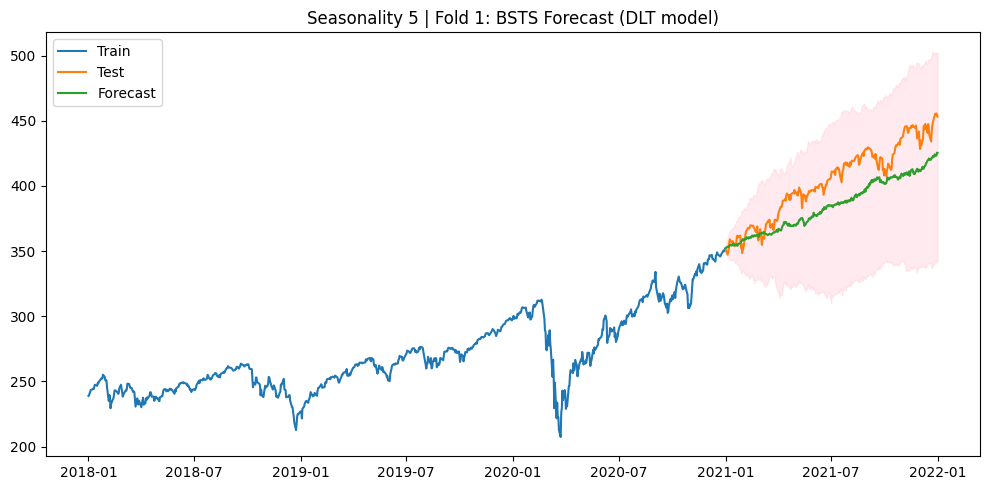

2025-06-10 14:52:45 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  120.8301
  MAE:   109.0791
  MAPE:  0.2872
  SMAPE: 0.2437
  R2:    -19.8784


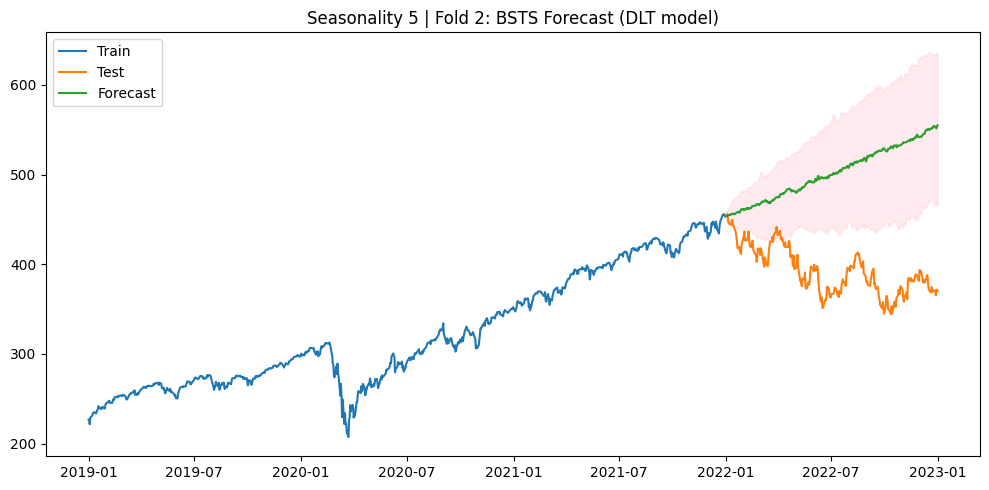

2025-06-10 14:54:04 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 5 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  27.0119
  MAE:   23.2874
  MAPE:  0.0545
  SMAPE: 0.0566
  R2:    -0.2473


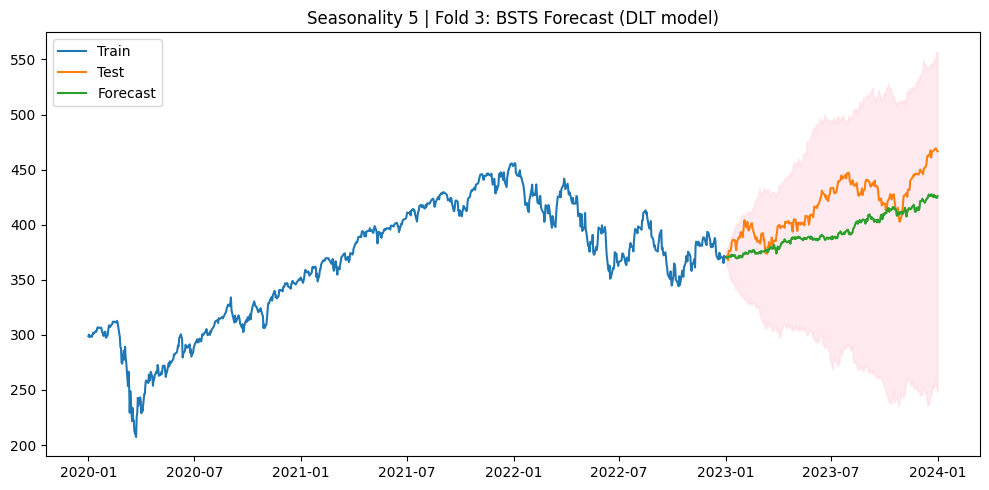

2025-06-10 14:55:22 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  16.3574
  MAE:   13.5168
  MAPE:  0.0323
  SMAPE: 0.0331
  R2:    0.6762


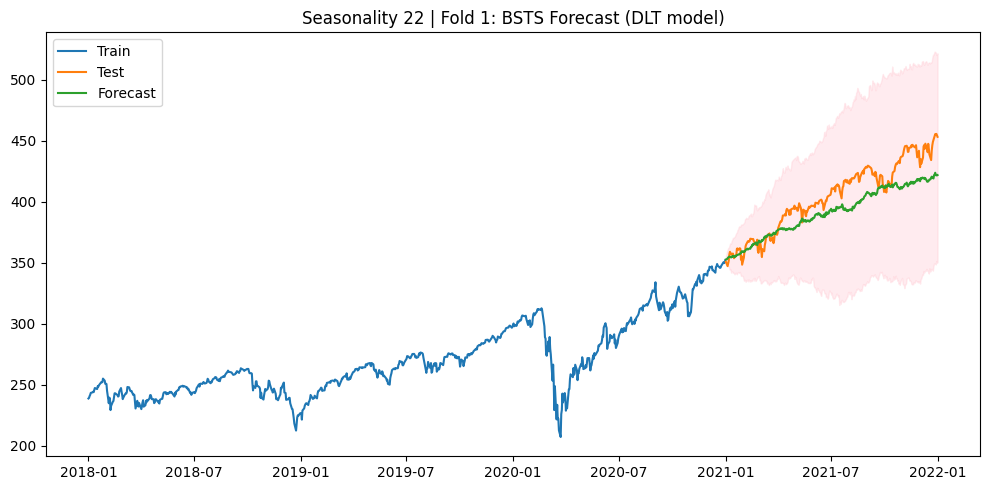

2025-06-10 14:56:48 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  126.3006
  MAE:   114.6718
  MAPE:  0.3016
  SMAPE: 0.2545
  R2:    -21.8117


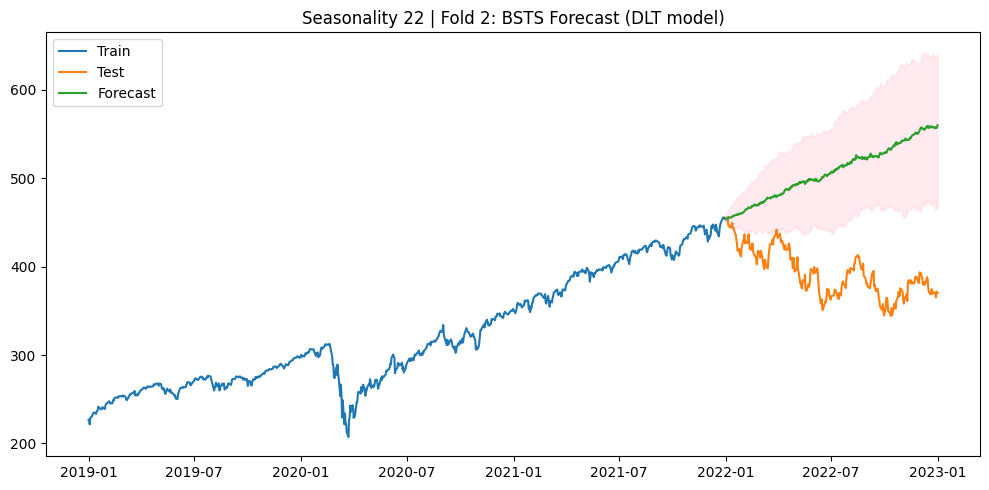

2025-06-10 14:58:13 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 22 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  16.2162
  MAE:   13.9082
  MAPE:  0.0328
  SMAPE: 0.0334
  R2:    0.5505


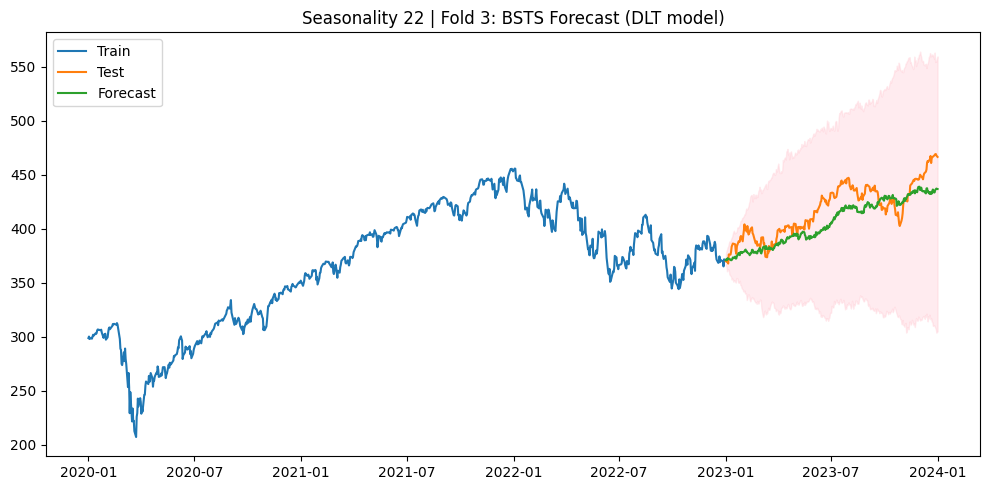

2025-06-10 14:59:37 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 1 - Train: 2018-01-01 to 2020-12-31 | Test: 2021-01-01 to 2021-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 1 Metrics:
  RMSE:  28.4198
  MAE:   25.0007
  MAPE:  0.0600
  SMAPE: 0.0624
  R2:    0.0225


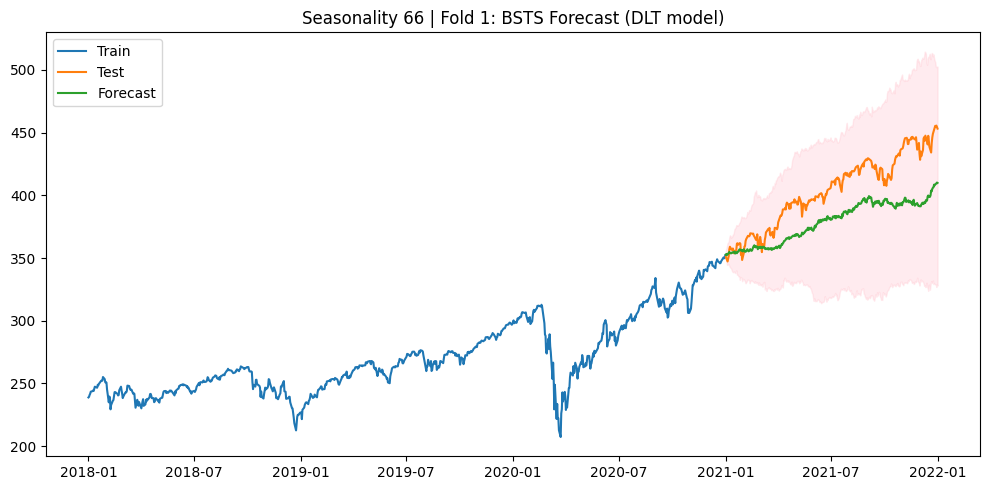

2025-06-10 15:01:26 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 2 - Train: 2019-01-01 to 2021-12-31 | Test: 2022-01-01 to 2022-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 2 Metrics:
  RMSE:  114.1870
  MAE:   103.7329
  MAPE:  0.2730
  SMAPE: 0.2338
  R2:    -17.6458


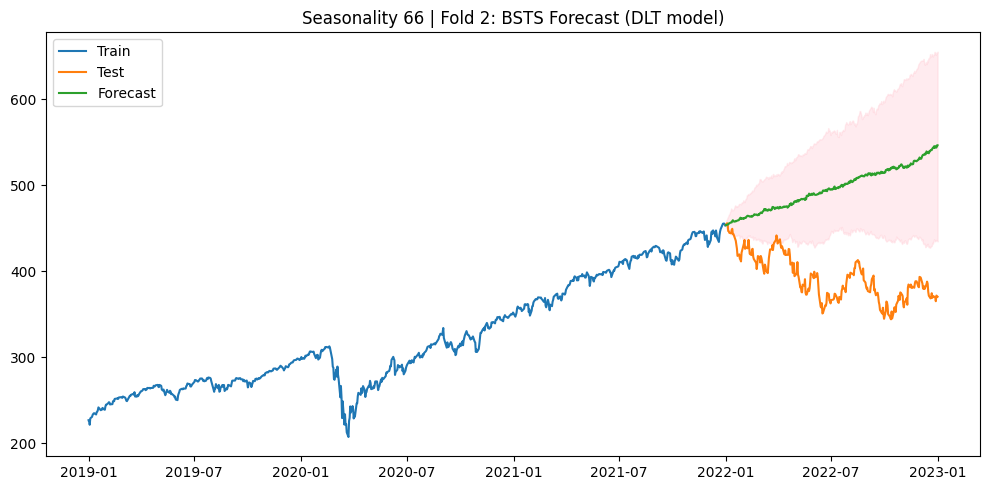

2025-06-10 15:03:05 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.



Seasonality: 66 | Fold 3 - Train: 2020-01-01 to 2022-12-31 | Test: 2023-01-01 to 2023-12-31


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fold 3 Metrics:
  RMSE:  21.1522
  MAE:   17.6836
  MAPE:  0.0414
  SMAPE: 0.0426
  R2:    0.2352


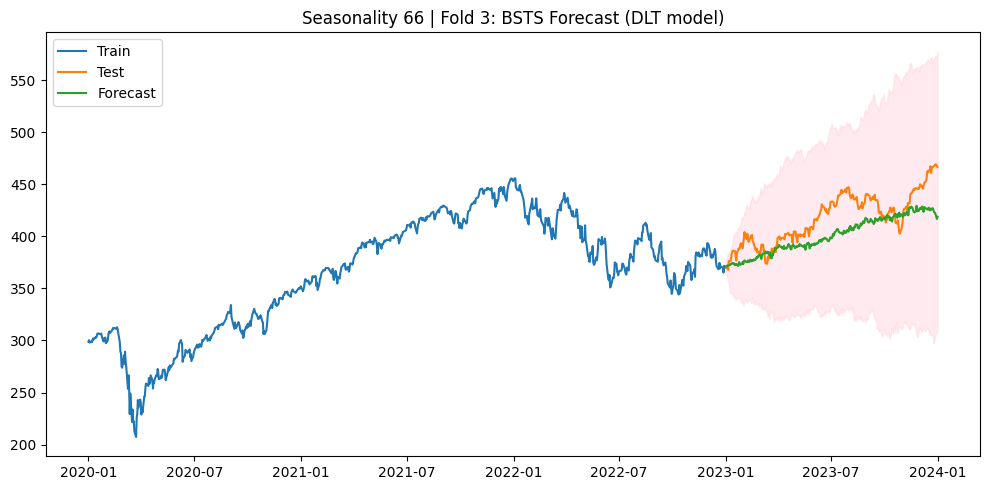

In [4]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
folds = [
    ('2018-01-01', '2020-12-31', '2021-01-01', '2021-12-31'),
    ('2019-01-01', '2021-12-31', '2022-01-01', '2022-12-31'),
    ('2020-01-01', '2022-12-31', '2023-01-01', '2023-12-31')
]

# -------------------------------
# Helper function for 1 fold
# -------------------------------
def run_bsts_fold(df, train_start, train_end, test_start, test_end, fold_num, seasonality):
    print(f"\nSeasonality: {seasonality} | Fold {fold_num} - Train: {train_start} to {train_end} | Test: {test_start} to {test_end}")

    train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
    test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

    # Fit DLT (BSTS)
    model = DLT(
        response_col='y',
        date_col='ds',
        seasonality=seasonality,
        seed=2023,
        estimator='stan-mcmc',
    )
    model.fit(train_df)

    # Forecast
    forecast_df = model.predict(df=test_df)
    y_true = test_df['y'].values
    y_pred = forecast_df['prediction'].values

    # Evaluate
    rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
    mae_val = mean_absolute_error(y_true, y_pred)
    mape_val = mape(y_true, y_pred)
    smape_val = smape(y_true, y_pred)
    r2_val = r2_score(y_true, y_pred)

    print(f"Fold {fold_num} Metrics:")
    print(f"  RMSE:  {rmse_val:.4f}")
    print(f"  MAE:   {mae_val:.4f}")
    print(f"  MAPE:  {mape_val:.4f}")
    print(f"  SMAPE: {smape_val:.4f}")
    print(f"  R2:    {r2_val:.4f}")

    # Plot
    plt.figure(figsize=(10, 5))
    plt.plot(train_df['ds'], train_df['y'], label='Train')
    plt.plot(test_df['ds'], test_df['y'], label='Test')
    plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
    plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
    plt.title(f'Seasonality {seasonality} | Fold {fold_num}: BSTS Forecast (DLT model)')
    plt.legend()
    plt.tight_layout()
    plt.show()

    del model, forecast_df
    gc.collect()

# -------------------------------
# Grid search over seasonality values
# -------------------------------
seasonality_values = [5, 22, 66]

for seasonality in seasonality_values:
    for i, (train_start, train_end, test_start, test_end) in enumerate(folds, 1):
        run_bsts_fold(df, train_start, train_end, test_start, test_end, i, seasonality)


# Period 1:

2025-06-10 16:16:04 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  4.9574
  MAE:   3.6809
  MAPE:  0.0413
  SMAPE: 0.0405
  R2:    -0.5894


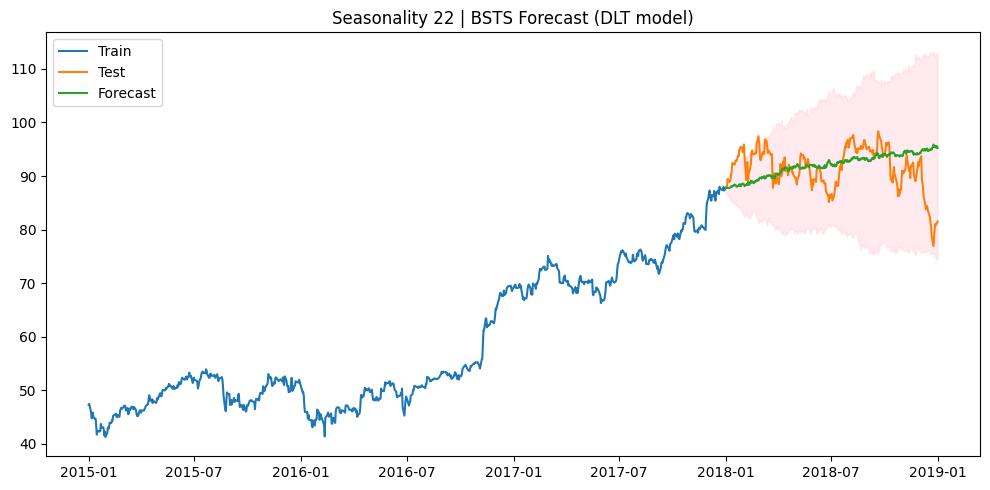

In [ ]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

train_start = '2015-01-01'
train_end = '2017-12-31'
test_start = '2018-01-01'
test_end = '2018-12-31'

seasonality = 22

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# Period 2:

2025-06-10 16:39:17 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  16.3574
  MAE:   13.5168
  MAPE:  0.0323
  SMAPE: 0.0331
  R2:    0.6762


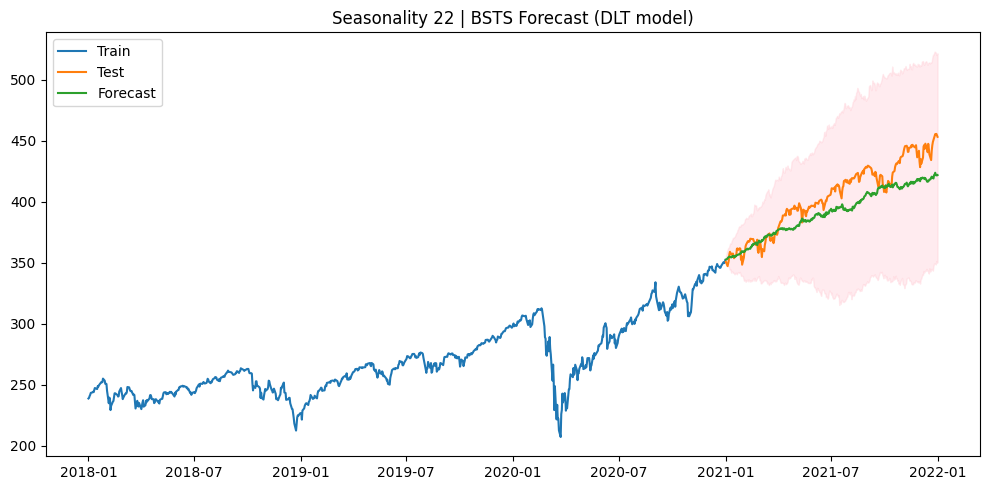

In [18]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
train_start = '2018-01-01'
train_end = '2020-12-31'
test_start = '2021-01-01'
test_end = '2021-12-31'

seasonality = 22

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()


# Period 3:

2025-06-10 16:37:41 - orbit - INFO - Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.
INFO:orbit:Sampling (CmdStanPy) with chains: 4, cores: 2, temperature: 1.000, warmups (per chain): 225 and samples(per chain): 25.


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Metrics:
  RMSE:  59.8359
  MAE:   53.4086
  MAPE:  0.0966
  SMAPE: 0.1026
  R2:    -1.4488


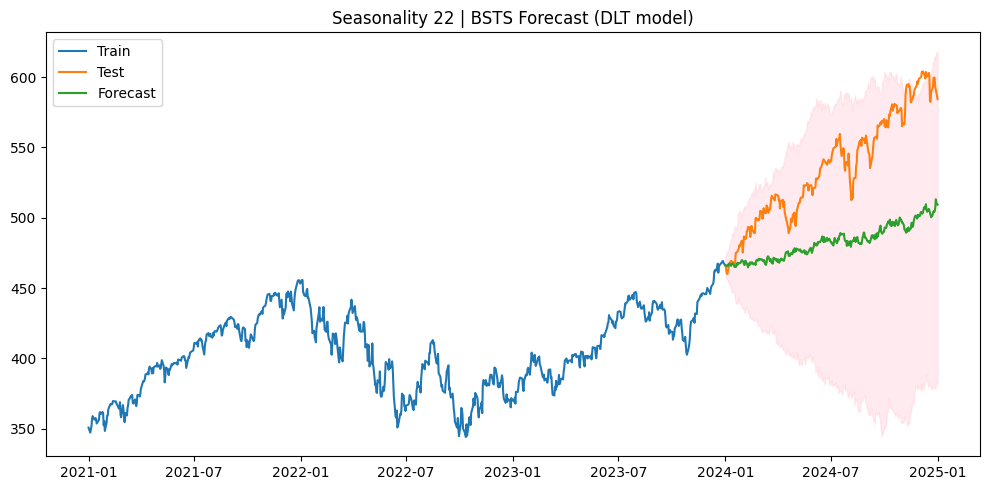

In [17]:
from orbit.models import DLT
from orbit.diagnostics.metrics import smape, mape
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import gc

# -------------------------------
# Load and preprocess data
# -------------------------------
df = pd.read_csv('SPY.csv', skiprows=3, header=None)
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df[['Date', 'Close']]
df.columns = ['ds', 'y']
df = df.set_index('ds').asfreq('D')
df['y'] = df['y'].interpolate(method='time')
df = df.reset_index()

# -------------------------------
# Define backtesting folds
# -------------------------------
train_start = '2021-01-01'
train_end = '2023-12-31'
test_start = '2024-01-01'
test_end = '2024-12-31'

seasonality = 22

train_df = df[(df['ds'] >= train_start) & (df['ds'] <= train_end)].copy()
test_df = df[(df['ds'] >= test_start) & (df['ds'] <= test_end)].copy()

model = DLT(
    response_col='y',
    date_col='ds',
    seasonality=seasonality,
    seed=2023,
    estimator='stan-mcmc',
    )
model.fit(train_df)

    # Forecast
forecast_df = model.predict(df=test_df)
y_true = test_df['y'].values
y_pred = forecast_df['prediction'].values

    # Evaluate
rmse_val = np.sqrt(mean_squared_error(y_true, y_pred))
mae_val = mean_absolute_error(y_true, y_pred)
mape_val = mape(y_true, y_pred)
smape_val = smape(y_true, y_pred)
r2_val = r2_score(y_true, y_pred)

print(f"Metrics:")
print(f"  RMSE:  {rmse_val:.4f}")
print(f"  MAE:   {mae_val:.4f}")
print(f"  MAPE:  {mape_val:.4f}")
print(f"  SMAPE: {smape_val:.4f}")
print(f"  R2:    {r2_val:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_df['ds'], train_df['y'], label='Train')
plt.plot(test_df['ds'], test_df['y'], label='Test')
plt.plot(forecast_df['ds'], forecast_df['prediction'], label='Forecast')
plt.fill_between(forecast_df['ds'], forecast_df['prediction_5'], forecast_df['prediction_95'], color='pink', alpha=0.3)
plt.title(f'Seasonality {seasonality} | BSTS Forecast (DLT model)')
plt.legend()
plt.tight_layout()
plt.show()
